# Traffic Status Prediction

This jupiter notebook will follow the process of the training and testing of the data models for the final traffic status prediction solution

- First, we will take a look at the provided data (sorted by timestamp). There are two datasets, each with columns:

        1. MedidasCCVStatusId
        2. SensorCCVId
        3. VehicleTypeId
        4. Timestamp
        5. Fluxo
        6. Velocidade
        7. EstadodeTrafego

- In both of the datasets the `EstadodeTrafego` column is populated with NULL values, as this is the value we must predict. However, in one of the datasets the `Velocidade` column is also unusable. We will keep this in mind as we carry on with our analysis.

- We will also keep a column with the original timestamps, to facilitate model results validation later on.

In [1]:
import pandas as pd
import numpy as np

print("-------------- Dataset with velocity --------------")

data_with_velocity = pd.read_csv("../dataset/data_with_velocity.csv")
data_with_velocity = data_with_velocity.sort_values(by="Timestamp")
data_with_velocity['OriginalTimestamp'] = data_with_velocity['Timestamp'].copy()

print(data_with_velocity.head())


print("-------------- Dataset without velocity --------------")

data_without_velocity = pd.read_csv("../dataset/data_without_velocity.csv")
data_without_velocity = data_without_velocity.sort_values(by="Timestamp")
data_without_velocity['OriginalTimestamp'] = data_without_velocity['Timestamp'].copy()

print(data_without_velocity.head())

-------------- Dataset with velocity --------------
       MedidasCCVStatusId  SensorCCVId  VehicleTypeId            Timestamp  \
24667           943390928     10010173              4  2023-03-10 16:19:00   
25179           943390929     10010172              4  2023-03-10 16:19:00   
24702           943396453     10010173              4  2023-03-10 16:20:00   
25208           943396454     10010172              4  2023-03-10 16:20:00   
24701           943396456     10010173              4  2023-03-10 16:21:00   

       Fluxo  Velocidade  EstadodeTrafego    OriginalTimestamp  
24667      3          86              NaN  2023-03-10 16:19:00  
25179      2          98              NaN  2023-03-10 16:19:00  
24702      5          93              NaN  2023-03-10 16:20:00  
25208      5          87              NaN  2023-03-10 16:20:00  
24701      5          81              NaN  2023-03-10 16:21:00  
-------------- Dataset without velocity --------------
      MedidasCCVStatusId  SensorCC

- The next step will be to separate the datasets by Sensor ID. This way, each model will only be trained for a specific location and direction. The grouped datasets will be stored in the `../sensor_datasets` directory with the filename `{SensorID}.csv`

In [2]:
import copy

grouped_data = data_without_velocity.groupby('SensorCCVId')

for value in data_without_velocity['SensorCCVId'].unique():
    sensor_data = grouped_data.get_group(value)
    sensor_data.to_csv('../sensor_datasets/'+str(value)+'.csv', index=False, na_rep='NULL')

grouped_data = data_with_velocity.groupby('SensorCCVId')

for value in data_with_velocity['SensorCCVId'].unique():
    sensor_data = grouped_data.get_group(value)
    sensor_data.to_csv('../sensor_datasets/'+str(value)+'.csv', index=False, na_rep='NULL')

- After the introduction and base is done, we will now begin the timestamp normalization.

## Timestamp Normalization

- Since timestamps in the dataset are interpreted as strings, we must first pass them to Datetime objects. This will make the overall process go by smoother. 
- To better suit the models, we will apply Circular Encoding to the timestamps. Furthermore, each sensor dataset will give origin to two new dataframes. One in which the time is encoded as an arctan value and another with the same encoding, but an additional column to specify the weekday. This is useful so that later on we can train a model for each weekday, to further explore all possibilities.

In [3]:
from datetime import datetime

def normalize_timestamps(data):
    
    # Days of the week list
    days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

    # Sort pandas dataframe by timestamps
    data = data.sort_values(by="Timestamp")
    
    # Group equal timestamps: sum the flow and average the velocity
    data = data.groupby('Timestamp').agg({
        'MedidasCCVStatusId': 'first',
        'SensorCCVId': 'first',
        'Fluxo': 'sum',
        'Velocidade': 'mean',
        'EstadodeTrafego': 'first',
        'OriginalTimestamp': 'first'
    }).reset_index()

    # Change timestamp strings to Datetime object type, facilitates following steps
    data['Timestamp'] =  [datetime.strptime(timestamp, '%Y-%m-%d %H:%M:%S') for timestamp in data['Timestamp']]

    # Create column with the weekdays
    data['Weekday'] = [days.index(date_obj.strftime('%A')) for date_obj in data['Timestamp']];

    # Rewrite Timestamp column with just the hour
    aux = [date_obj.time() for date_obj in data['Timestamp']]
    data['Timestamp'] = aux

    return data


def circular_encode_timestamps(timestamps, format):
    
    # Convert timestamps to angles in radians
    angles = [2*np.pi*(datetime.strptime(str(ts), format).hour/24.0 + 
                       datetime.strptime(str(ts), format).minute/(24.0*60) + 
                       datetime.strptime(str(ts), format).second/(24.0*3600)) 
                       for ts in timestamps]
    
    # Convert angles to sine and cosine values
    sin_values = np.sin(angles)
    cos_values = np.cos(angles)

    # Compute arctangent of sin/cos ratio to get single-value encoding
    encodings = np.arctan2(sin_values, cos_values)
    
    # Return single-value encodings as a 1D array  
    return encodings

In [4]:
sensor_10000028_og = pd.read_csv("../sensor_datasets/10000028.csv")
sensor_10000028 = copy.deepcopy(sensor_10000028_og)
sensor_10000028['Timestamp'] = circular_encode_timestamps(sensor_10000028['Timestamp'], '%Y-%m-%d %H:%M:%S')

sensor_10000028_weekday = normalize_timestamps(sensor_10000028_og)
sensor_10000028_weekday['Timestamp'] = circular_encode_timestamps(sensor_10000028_weekday['Timestamp'], '%H:%M:%S')


sensor_10000029_og = pd.read_csv("../sensor_datasets/10000029.csv")
sensor_10000029 = copy.deepcopy(sensor_10000029_og)
sensor_10000029['Timestamp'] = circular_encode_timestamps(sensor_10000029['Timestamp'], '%Y-%m-%d %H:%M:%S')

sensor_10000029_weekday = normalize_timestamps(sensor_10000029_og)
sensor_10000029_weekday['Timestamp'] = circular_encode_timestamps(sensor_10000029_weekday['Timestamp'], '%H:%M:%S')


sensor_10010172_og = pd.read_csv("../sensor_datasets/10010172.csv")
sensor_10010172 = copy.deepcopy(sensor_10010172_og)
sensor_10010172['Timestamp'] = circular_encode_timestamps(sensor_10010172['Timestamp'], '%Y-%m-%d %H:%M:%S')

sensor_10010172_weekday = normalize_timestamps(sensor_10010172_og)
sensor_10010172_weekday['Timestamp'] = circular_encode_timestamps(sensor_10010172_weekday['Timestamp'], '%H:%M:%S')


sensor_10010173_og = pd.read_csv("../sensor_datasets/10010173.csv")
sensor_10010173 = copy.deepcopy(sensor_10010173_og)
sensor_10010173['Timestamp'] = circular_encode_timestamps(sensor_10010173['Timestamp'], '%Y-%m-%d %H:%M:%S')

sensor_10010173_weekday = normalize_timestamps(sensor_10010173_og)
sensor_10010173_weekday['Timestamp'] = circular_encode_timestamps(sensor_10010173_weekday['Timestamp'], '%H:%M:%S')

sensors = [sensor_10000028, sensor_10000029, sensor_10010172, sensor_10010173]
sensors_weekday = [sensor_10000028_weekday, sensor_10000029_weekday, sensor_10010172_weekday, sensor_10010173_weekday]

In [5]:
print(sensor_10000028.head())
print(sensor_10000028_weekday.head())

print(sensor_10000029.head())
print(sensor_10000029_weekday.head())

print(sensor_10010172.head())
print(sensor_10010172_weekday.head())

print(sensor_10010173.head())
print(sensor_10010173_weekday.head())

   MedidasCCVStatusId  SensorCCVId  VehicleTypeId  Timestamp  Fluxo  \
0           892741587     10000028              3   3.119776      3   
1           892741590     10000028              6   3.119776      1   
2           892741589     10000028              5   3.119776     24   
3           892741588     10000028              4   3.119776    255   
4           892746410     10000028              4   3.141593    273   

   Velocidade  EstadodeTrafego    OriginalTimestamp  
0         NaN              NaN  2023-02-10 11:55:00  
1         NaN              NaN  2023-02-10 11:55:00  
2         NaN              NaN  2023-02-10 11:55:00  
3         NaN              NaN  2023-02-10 11:55:00  
4         NaN              NaN  2023-02-10 12:00:00  
   Timestamp  MedidasCCVStatusId  SensorCCVId  Fluxo  Velocidade  \
0   3.119776           892741587     10000028    283         NaN   
1   3.141593           892746410     10000028    303         NaN   
2  -3.119776           892751899     10000028

- To summarize, we know have 2 datasets per sensor, both with circular time encoding and one of them with an additional `Weekday` column. With the timestamps normalized we will now move on to the necessary preparations for training the models. 

## Model Training and Validation - Preparations

- The following models will be used for training:
       
        1. K-Means
        2. TimeSeries K-Means with Dynamic Time Warping
        3. Gaussian Mixture Model

- To further analyse the model performances on different scenarios, we will divide all computed datasets in 3 disctinct dataframes:

        1. Dataframe with Fluxo and Velocidade columns
        2. Dataframe with Timestamp and Fluxo columns
        3. Dataframe with Timestamp, Fluxo and Velocidade columns

- Lastly, the chosen performance metrics are as follow:

        1. Elbow Method (only in K-Means)
        2. Silhouette Score (the higher the better)
        3. Calinski-Harabaz Index (the higher the better)
        4. Davies-Bouldin Index (the lower the better)



In [6]:
from sklearn.cluster import KMeans
from tslearn.clustering import TimeSeriesKMeans
from sklearn import metrics
from sklearn.metrics import silhouette_score, davies_bouldin_score
from sklearn.mixture import GaussianMixture
import matplotlib.pyplot as plt
import csv

### K-Means

#### flux_and_velocity

In [7]:
def K_Means_flux_and_velocity(flux_and_velocity, file_writer):
    
    """ K-Means Algorithm - flux_and_velocity """

    # Execute the K-Means algorithm
    k = 4
    kmeans = KMeans(n_clusters=k, max_iter = 300, n_init = 10, random_state = 0).fit(flux_and_velocity)

    plt.scatter(flux_and_velocity['Fluxo'], flux_and_velocity['Velocidade'], c=kmeans.labels_, s = 10)
    plt.show()

    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Elbow Method
    cs = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
        kmeans.fit(flux_and_velocity)
        cs.append(kmeans.inertia_)
    
    plt.plot(range(1, 11), cs)
    plt.show()

    # Silhouette score
    silhouette_avg = silhouette_score(flux_and_velocity, kmeans.labels_)
    print("The average silhouette score for the flux_and_velocity dataset (K-Means) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(flux_and_velocity, kmeans.labels_)
    print("The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(flux_and_velocity, kmeans.labels_)
    print("The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is :", davies_index)

    # Write a row to the csv file
    file_writer.writerow(["K-Means Algorithm - flux_and_velocity"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

#### time_and_flux

In [8]:
def K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps):

    # Execute the K-Means algorithm
    k = 4
    kmeans = KMeans(n_clusters=k, max_iter = 300, n_init = 10, random_state = 0).fit(time_and_flux)

    plt.scatter(originalTimestamps, time_and_flux['Fluxo'], c=kmeans.labels_, s = 10)
    plt.show()

    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Elbow Method
    cs = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
        kmeans.fit(time_and_flux)
        cs.append(kmeans.inertia_)
    
    plt.plot(range(1, 11), cs)
    plt.show()

    # Silhouette score
    silhouette_avg = silhouette_score(time_and_flux, kmeans.labels_)
    print("The average silhouette score for the time_and_flux dataset (K-Means) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_and_flux, kmeans.labels_)
    print("The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_and_flux, kmeans.labels_)
    print("The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["K-Means Algorithm - time_and_flux"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

#### time_flux_and_velocity

In [9]:
def K_Means_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps):
    
    # Execute the K-Means algorithm
    k = 4
    kmeans = KMeans(n_clusters=k, max_iter = 300, n_init = 10, random_state = 0).fit(time_flux_and_velocity)

    plt.scatter(originalTimestamps, time_flux_and_velocity['Velocidade'], c=kmeans.labels_, s = 10)
    plt.show()

    plt.scatter(originalTimestamps, time_flux_and_velocity['Fluxo'], c=kmeans.labels_, s = 10)
    plt.show()


    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Elbow Method
    cs = []
    for i in range(1, 11):
        kmeans = KMeans(n_clusters = i, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
        kmeans.fit(time_flux_and_velocity)
        cs.append(kmeans.inertia_)
    
    plt.plot(range(1, 11), cs)
    plt.show()

    # Silhouette score
    silhouette_avg = silhouette_score(time_flux_and_velocity, kmeans.labels_)
    print("The average silhouette score for the time_flux_and_velocity (K-Means) dataset is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_flux_and_velocity, kmeans.labels_)
    print("The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_flux_and_velocity, kmeans.labels_)
    print("The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["K-Means Algorithm - time_flux_and_velocity"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

### Time Series K-Means with dynamic time warping

#### time_and_flux

In [10]:
def time_K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps):
    
    time_series_kmeans = TimeSeriesKMeans(n_clusters=4, metric="dtw", max_iter=10, random_state=0).fit(time_and_flux)
    plt.scatter(originalTimestamps, time_and_flux['Fluxo'], c=time_series_kmeans.labels_, s = 10)
    plt.show()
    
    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Silhouette Score
    silhouette_avg = silhouette_score(time_and_flux, time_series_kmeans.labels_)
    print("The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_and_flux, time_series_kmeans.labels_)
    print("The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_and_flux, time_series_kmeans.labels_)
    print("The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["TimeSeries K-Means algorithm with Dynamic Time Warping - time_and_flux"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

#### time_flux_and_velocity

In [11]:
def time_K_Means_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps):
    
    time_series_kmeans = TimeSeriesKMeans(n_clusters=4, metric="dtw", max_iter=10, random_state=0).fit(time_flux_and_velocity)
    
    plt.scatter(originalTimestamps, time_flux_and_velocity['Fluxo'], c=time_series_kmeans.labels_, s = 10)
    plt.show()
    
    plt.scatter(time_flux_and_velocity['Velocidade'], time_flux_and_velocity['Fluxo'], c=time_series_kmeans.labels_, s = 10)
    plt.show()
    
    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Silhouette Score
    silhouette_avg = silhouette_score(time_flux_and_velocity, time_series_kmeans.labels_)
    print("The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_flux_and_velocity, time_series_kmeans.labels_)
    print("The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_flux_and_velocity, time_series_kmeans.labels_)
    print("The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["TimeSeries K-Means algorithm with Dynamic Time Warping - time_flux_and_velocity"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

### Gaussian Mixture Model

#### flux_and_velocity

In [12]:
def gaussian_model_flux_and_velocity(flux_and_velocity, file_writer):
    gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(flux_and_velocity)
    color = gmm.predict(flux_and_velocity)

    plt.scatter(flux_and_velocity['Fluxo'], flux_and_velocity['Velocidade'], c=color, s = 10)
    plt.show()

    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Silhouette Score
    silhouette_avg = silhouette_score(flux_and_velocity, color)
    print("The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(flux_and_velocity, color)
    print("The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(flux_and_velocity, color)
    print("The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is :", davies_index)
     
    # Write rows to the csv file
    file_writer.writerow(["Gaussian Mixture Model - flux_and_velocity"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

#### time_and_flux

In [13]:
def gaussian_model_time_and_flux(time_and_flux, file_writer, originalTimestamps):
    
    gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_and_flux)
    color = gmm.predict(time_and_flux)

    plt.scatter(originalTimestamps, time_and_flux['Fluxo'], c=color, s = 10)
    plt.show()

    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Silhouette Score
    silhouette_avg = silhouette_score(time_and_flux, color)
    print("The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_and_flux, color)
    print("The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_and_flux, color)
    print("The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["Gaussian Mixture Model - time_and_flux"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

#### time_flux_and_velocity

In [14]:
def gaussian_model_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps):
    
    gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_flux_and_velocity)
    color = gmm.predict(time_flux_and_velocity)

    plt.scatter(originalTimestamps, time_flux_and_velocity['Fluxo'], c=color, s = 10)
    plt.show()
  
    plt.scatter(time_flux_and_velocity['Fluxo'], time_flux_and_velocity['Velocidade'], c=color, s = 10)
    plt.show()

    # The following section of code is meant to evaluate the clustering model evaluate the clustering model

    # Silhouette Score
    silhouette_avg = silhouette_score(time_flux_and_velocity, color)
    print("The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is :", silhouette_avg)

    # Calinski-Harabaz Index
    cal_index = metrics.calinski_harabasz_score(time_flux_and_velocity, color)
    print("The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is :", cal_index)

    # Davies-Bouldin Index
    davies_index = davies_bouldin_score(time_flux_and_velocity, color)
    print("The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is :", davies_index)

    # Write rows to the csv file
    file_writer.writerow(["Gaussian Mixture Model - time_flux_and_velocity"])
    file_writer.writerows([["Silhouette score", "Calinski-Harabaz Index", "Davies-Bouldin Index"], [silhouette_avg, cal_index, davies_index]])

## Model Training and Validation - Execution

- Now that we have all our functions defined we will apply each to the new sensor dataset partitions.

In [15]:
def execute_all_models(data, file_writer):

    originalTimestamps = data['OriginalTimestamp']

    time_and_flux = data[['Timestamp', 'Fluxo']]
    flux_and_velocity = []
    time_flux_and_velocity = []

    if data['Velocidade'].isnull().any():
        K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps)
        time_K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps)
        gaussian_model_time_and_flux(time_and_flux, file_writer, originalTimestamps)

    else:
        flux_and_velocity = data[['Fluxo', 'Velocidade']]
        time_flux_and_velocity = data[['Timestamp', 'Fluxo', 'Velocidade']]


        K_Means_flux_and_velocity(flux_and_velocity, file_writer)
        K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps)
        K_Means_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps)

        time_K_Means_time_and_flux(time_and_flux, file_writer, originalTimestamps)
        time_K_Means_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps)

        gaussian_model_flux_and_velocity(flux_and_velocity, file_writer)
        gaussian_model_time_and_flux(time_and_flux, file_writer, originalTimestamps)
        gaussian_model_time_flux_and_velocity(time_flux_and_velocity, file_writer, originalTimestamps)



In [16]:
def weekday_models(dayOfWeek, data, filename):
    if(dayOfWeek < 0 or dayOfWeek > 6):
        return None
    
    
    weekday_data =  data[data['Weekday'] == dayOfWeek]

    file = open(filename, 'a')
    file_writer = csv.writer(file)

    execute_all_models(weekday_data, file_writer)

- The results for the datasets without weekday partitions will be stored in the `../docs/model_performances/notebook` directory, each with the filename `{SensorID}_results.csv`. On the other hand, the datasets with weekday partitions will be stored in the `../docs/model_performances/notebook/weekday_models` directory, each with the filename `{SensorID}_{Weekday}_results.csv`.

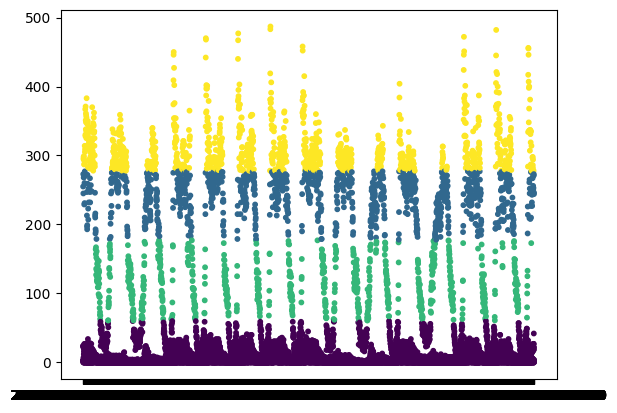

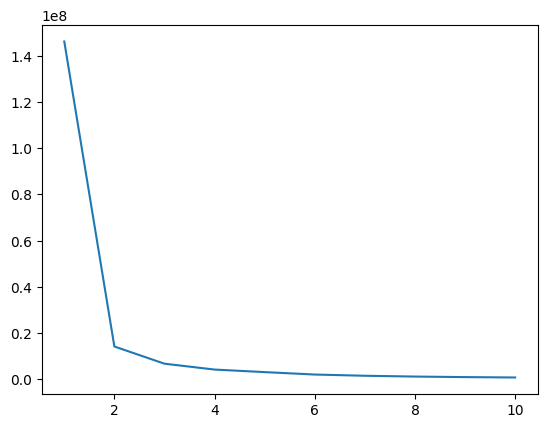

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.6916831105643688
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 308866.22490868
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5315499183733984


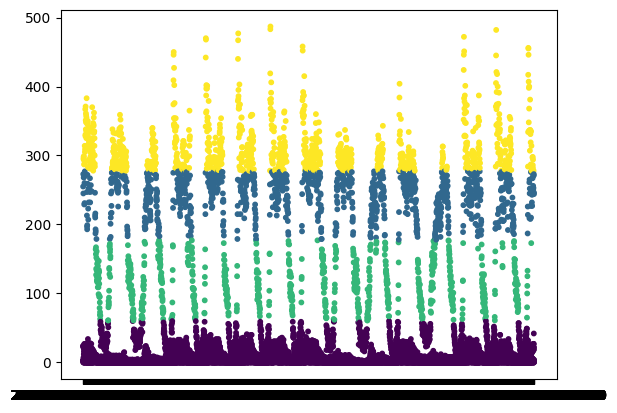

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.8309532363602372
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 178713.17035757488
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5073377120295471


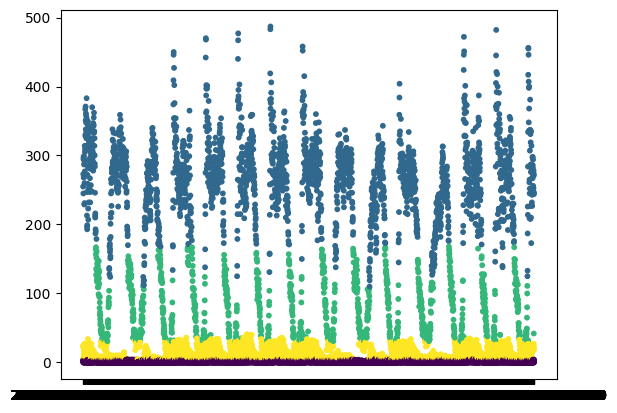

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.5654946717547533
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 85819.73309126084
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.6181044963221002


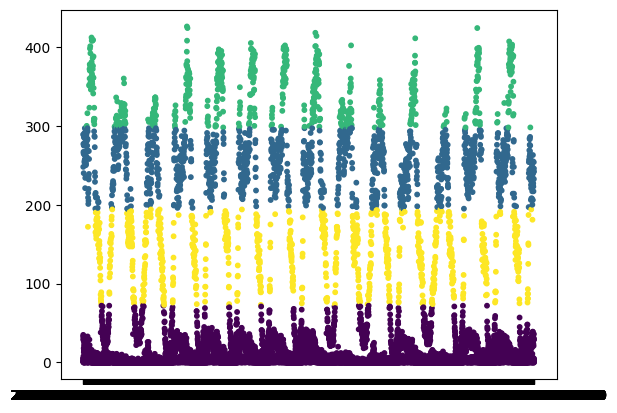

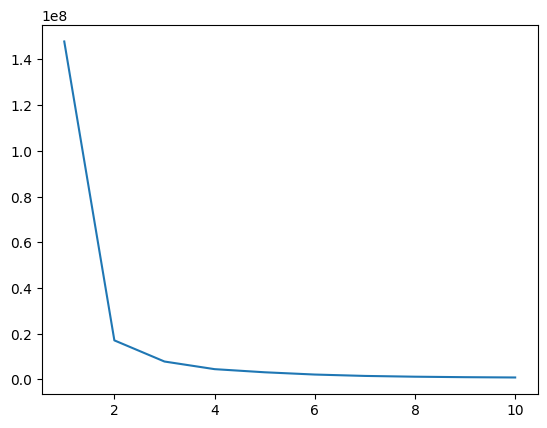

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.7177891362710599
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 335612.2423492565
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.4975426287736446


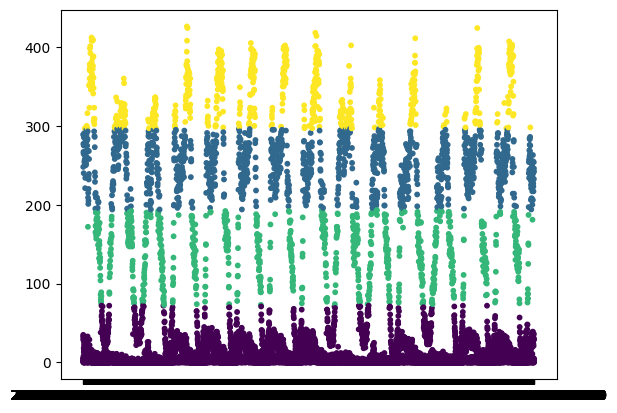

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.8468629370435269
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 173860.19209554835
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.4628480990896888


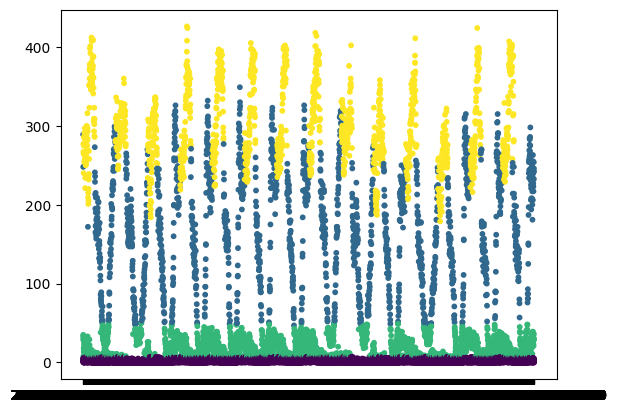

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.5820299683351147
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 58354.61341695593
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.7123935051824586


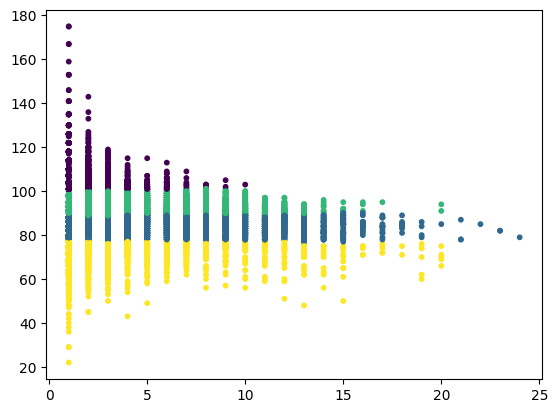

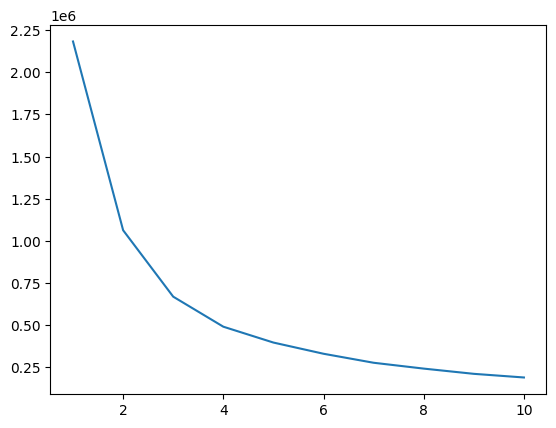

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3885557345283374
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 20474.945287663926
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7665258754223121


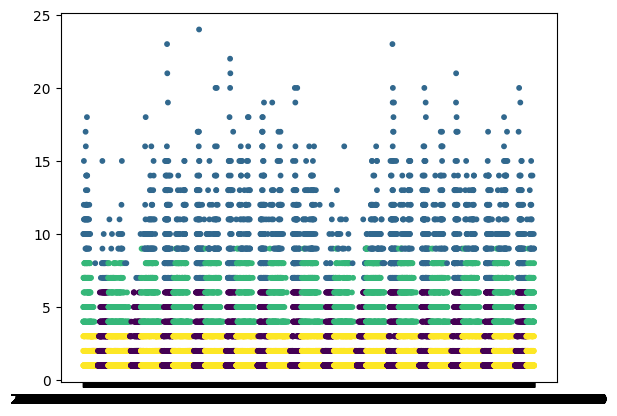

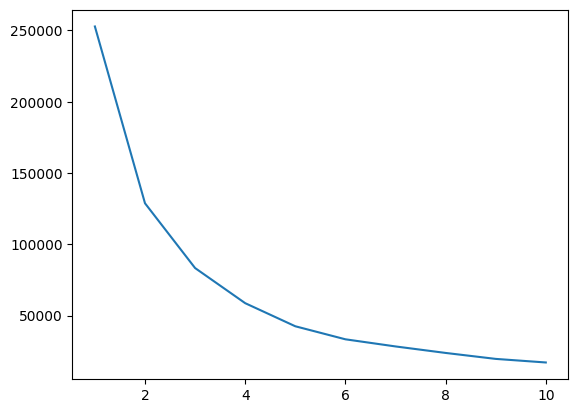

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.48570482751719957
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 26929.0117465071
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.650640620957522


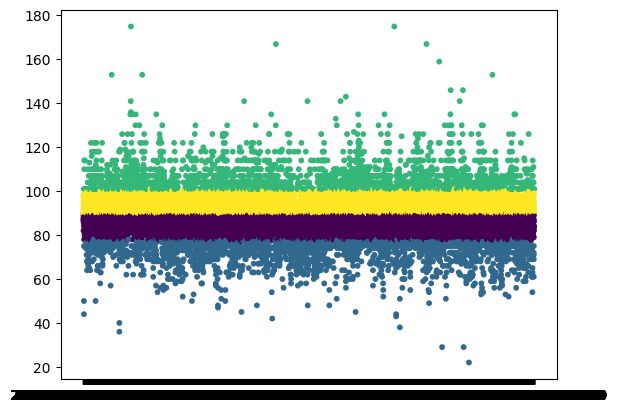

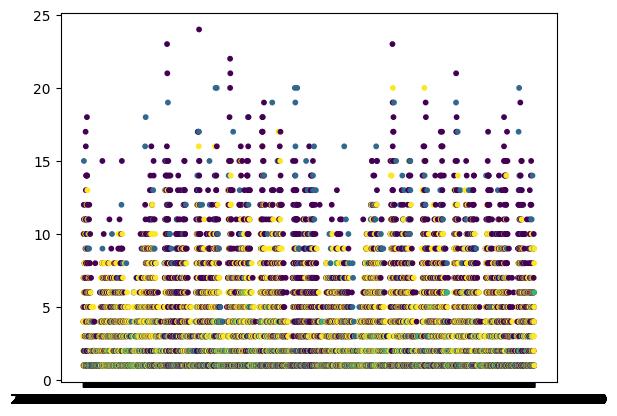

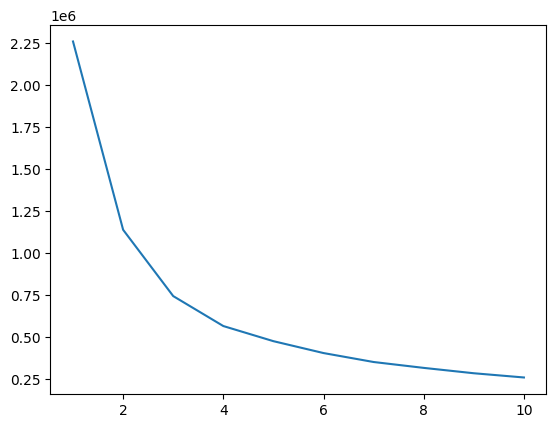

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.304227908483724
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 15020.91934275587
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9354746548391638


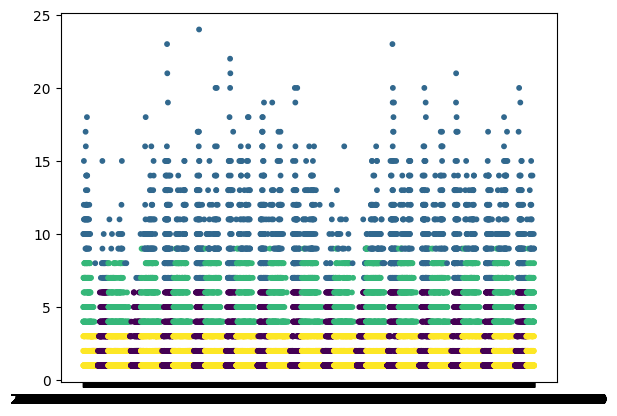

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4760968542652662
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 19387.14239066177
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7850316845032232


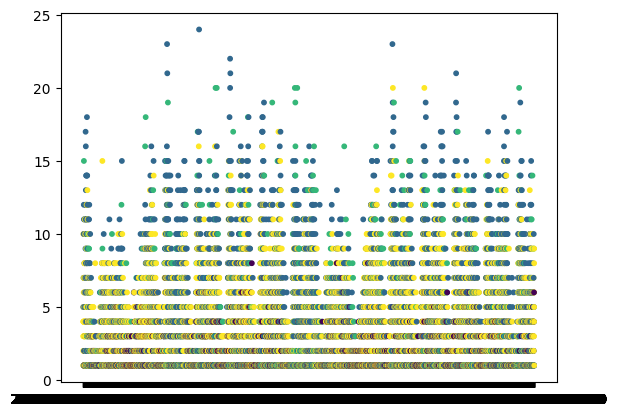

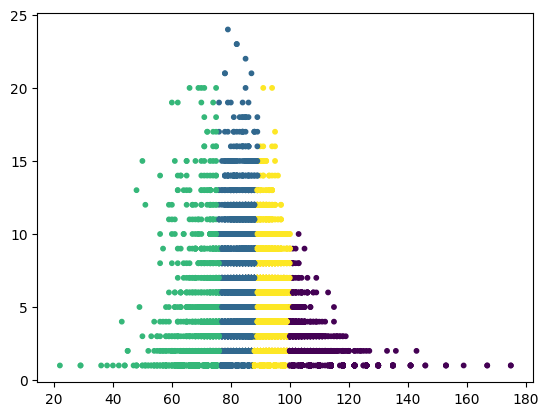

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.36429451025481974
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 17325.821895811277
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.870744836650919


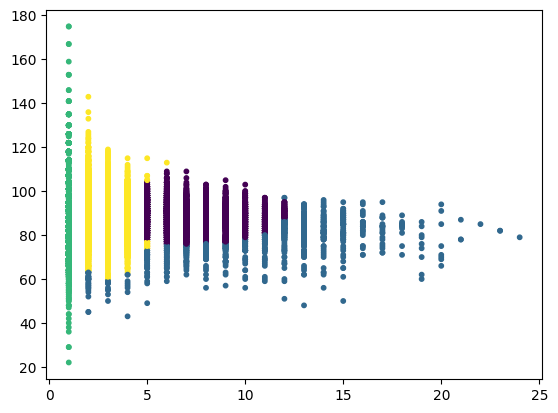

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : -0.004723780372543472
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 958.8639622221874
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 5.572170276985251


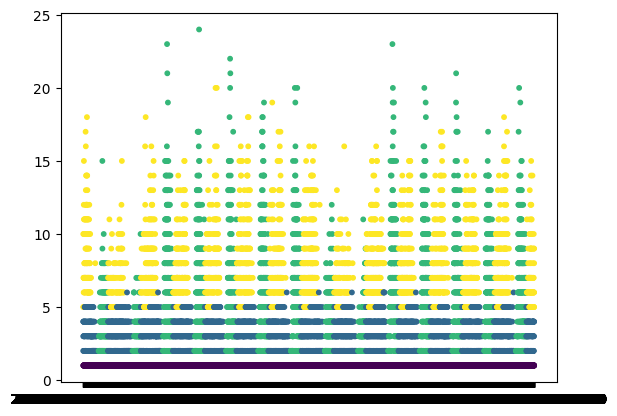

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.29625810851659723
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 9562.268352349016
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.039162040275418


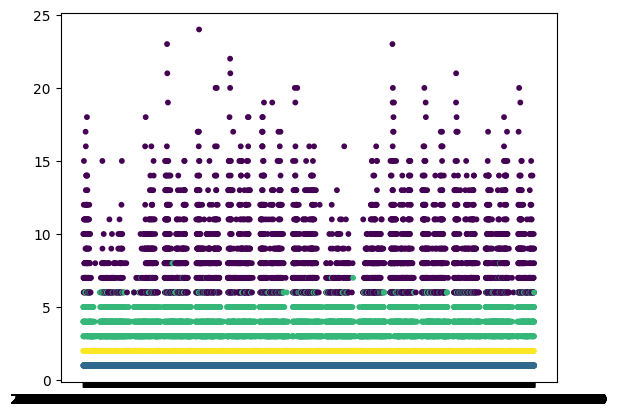

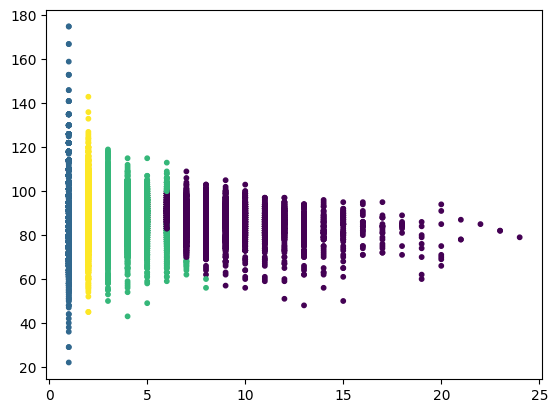

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.017662644382514307
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 537.7698497594328
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 9.224420737999228


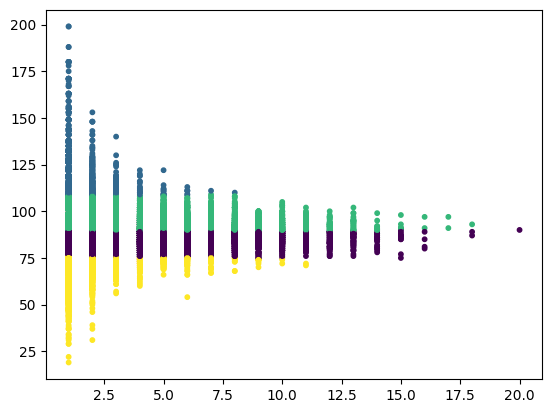

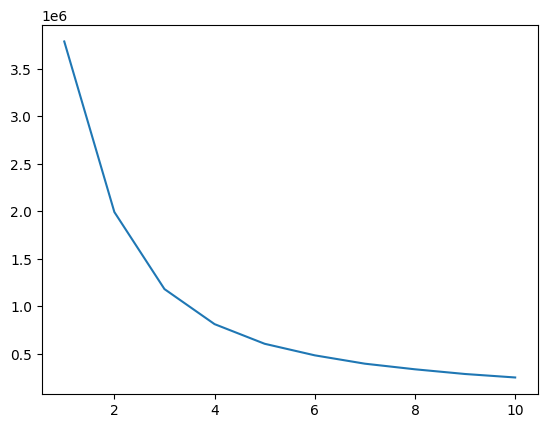

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.39614136950100964
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 32624.271297112762
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7036608346364625


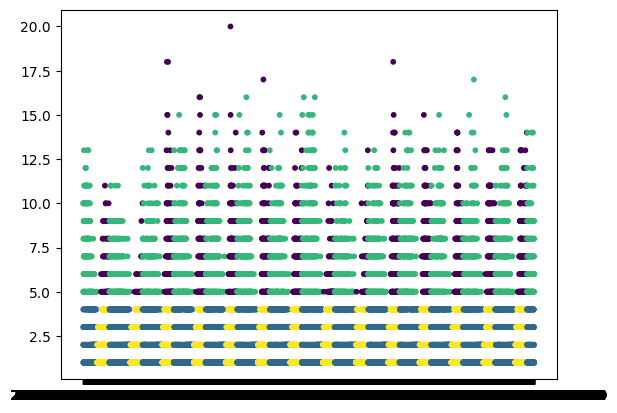

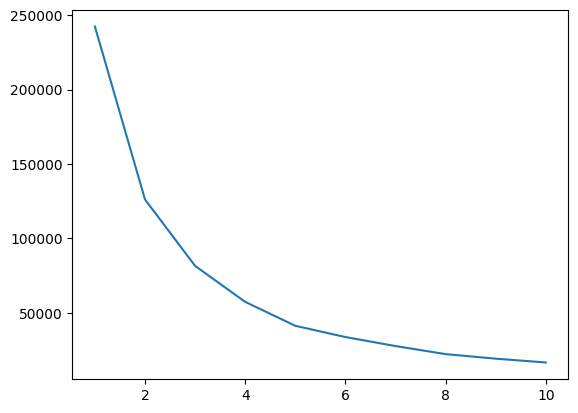

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4735755295458769
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 31586.73800807857
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.6921335464439371


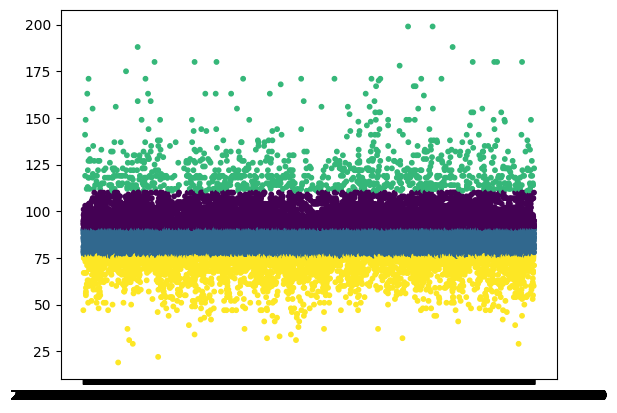

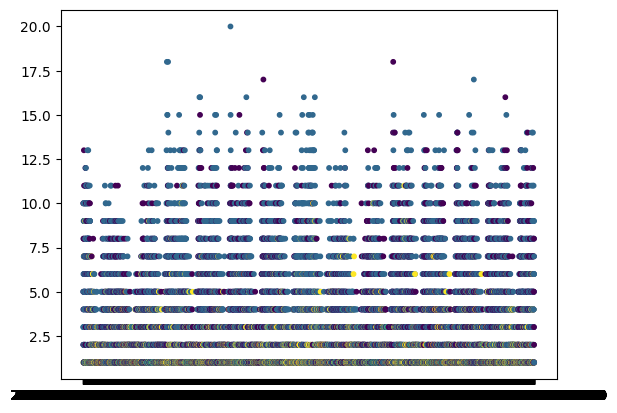

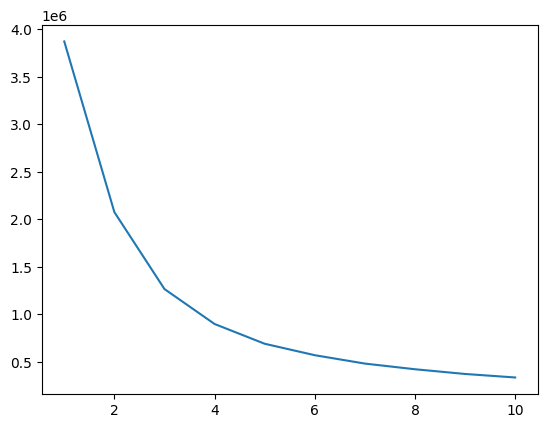

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.3193885810455834
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 24572.14804565507
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.8494032830406466


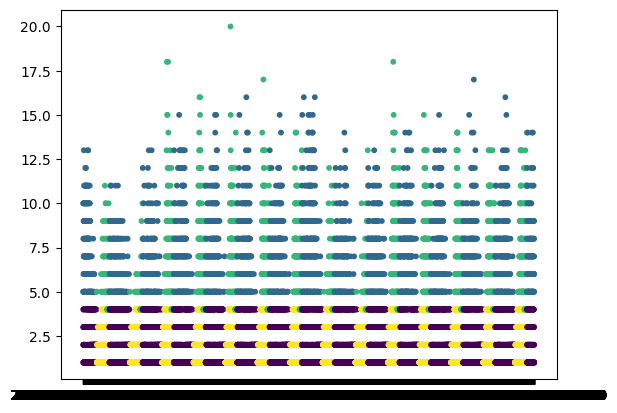

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.47223752050556744
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 22198.56419623216
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7650126241235226


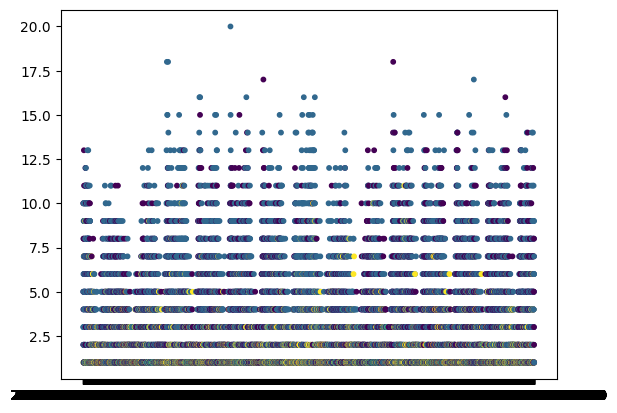

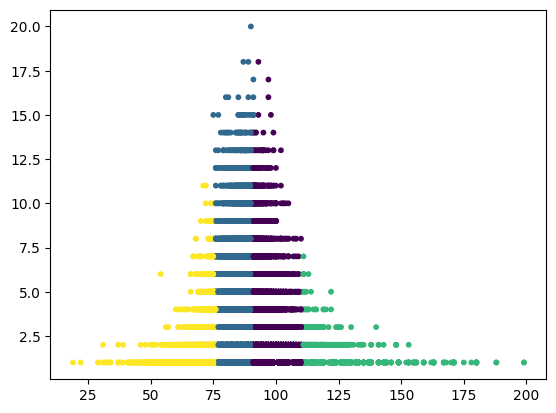

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.40642527548748175
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 23085.29758932447
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.7370263170410833


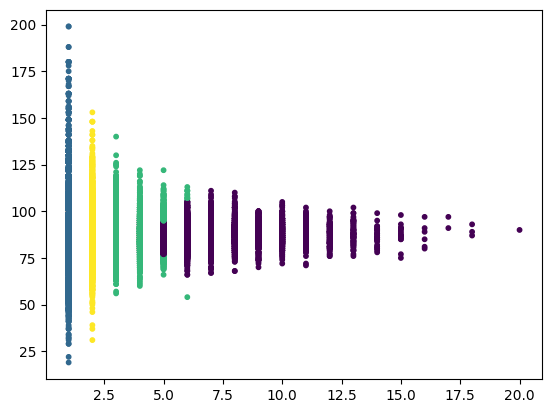

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : -0.04019239821360057
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 256.64294310562457
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 15.19114382267973


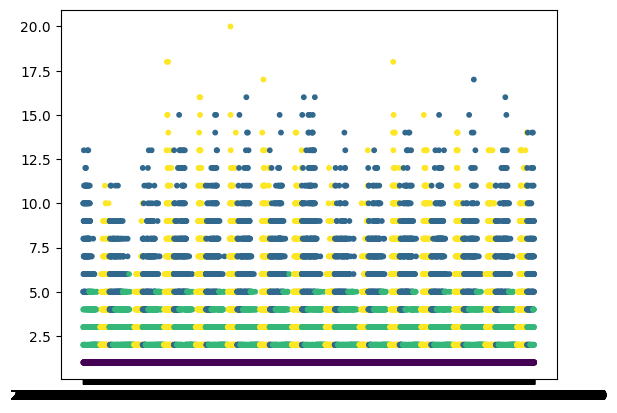

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.27278188221625493
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 11406.803872914465
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.0845369424147497


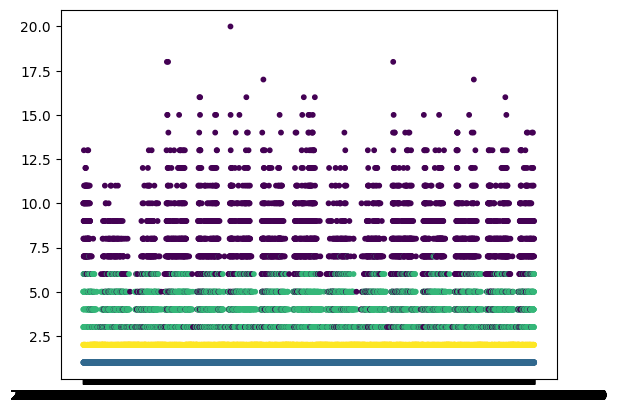

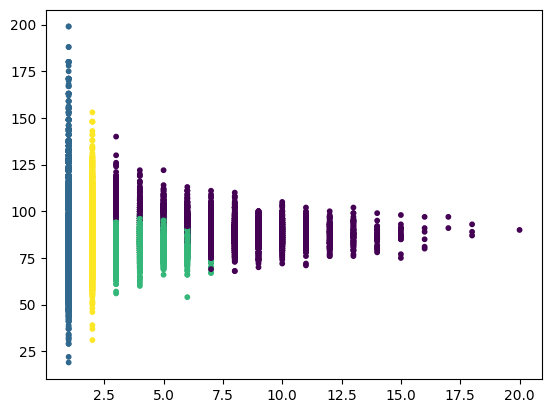

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.07897659788784953
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 433.59742376476913
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 13.624276749347239


In [17]:
for sensor in sensors:
    value = sensor['SensorCCVId'][0]
    filename = '../docs/model_performances/notebook/'+str(value)+'_results.csv'

    print("\n---------- SENSOR "+str(value)+" ----------\n")

    file = open(filename, 'a')
    file_writer = csv.writer(file)

    execute_all_models(sensor, file_writer)

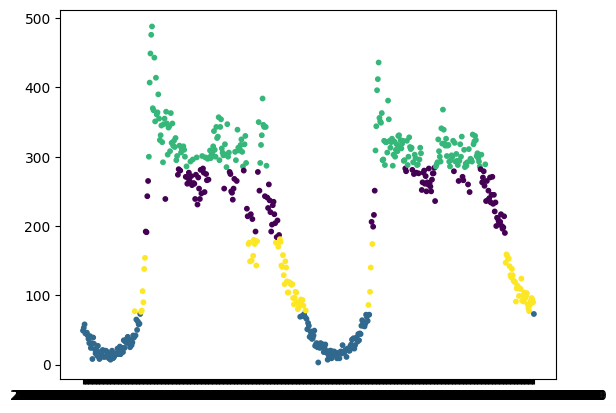

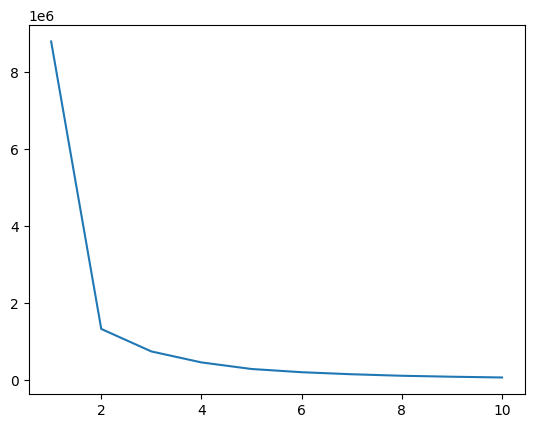

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.549496602016198
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 7335.094114900216
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5124311355822863


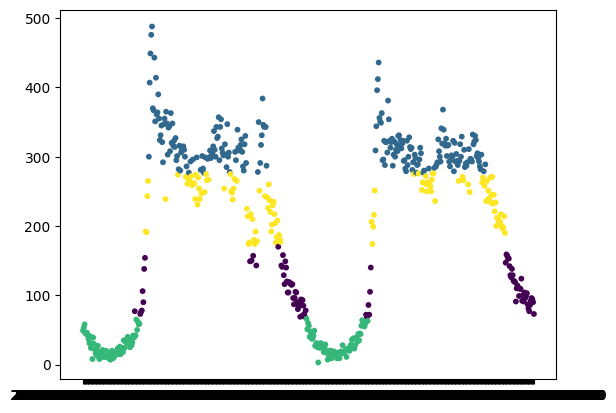

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5880116870610678
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 3362.8900432503306
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.532884343606304


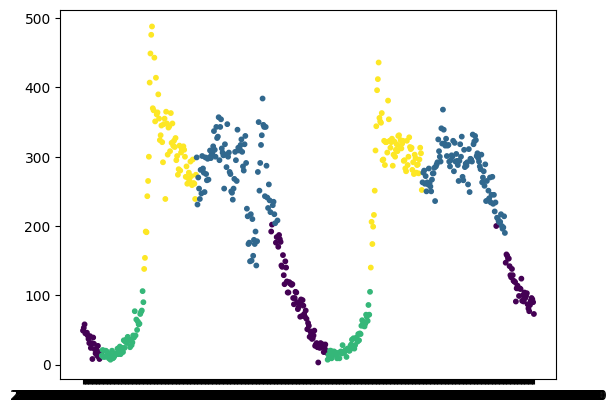

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.13029542397319246
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1177.0154688686098
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.7159735811252115


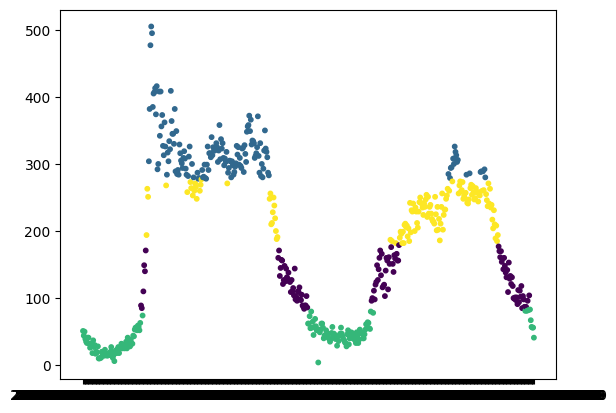

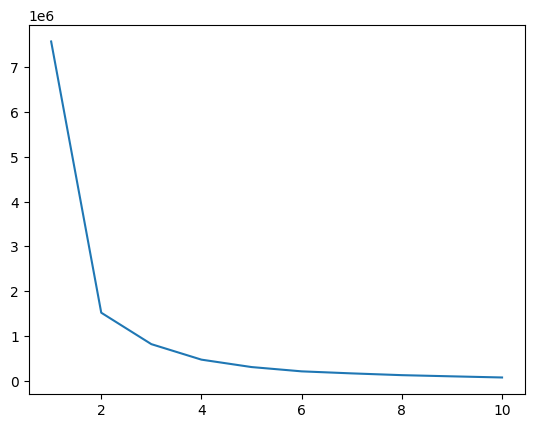

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5560495263625949
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 5885.710690638856
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.48297928023381403


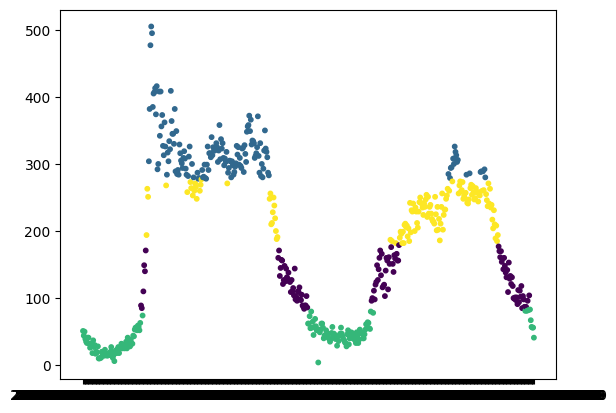

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5946013320609376
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2831.934514747289
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5107244498041006


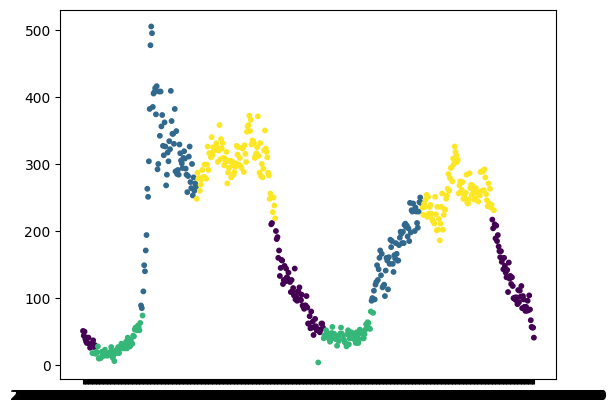

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.22895035362688906
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 609.7139752892774
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.9833472803996433


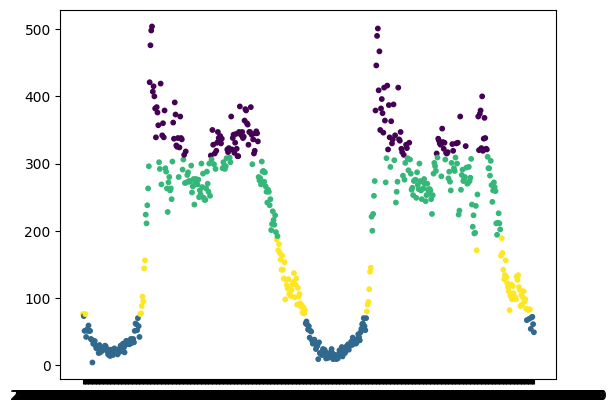

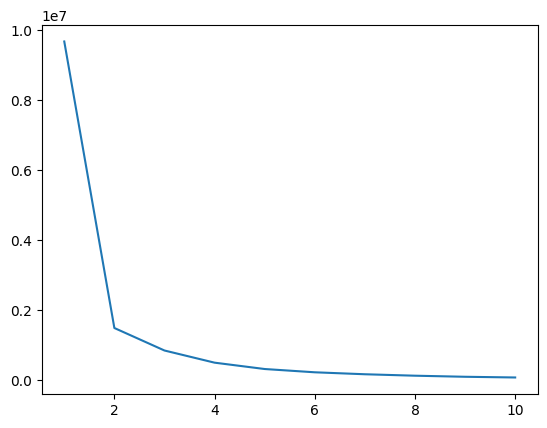

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5734621935768681
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 7553.855631418537
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.48576006966066687


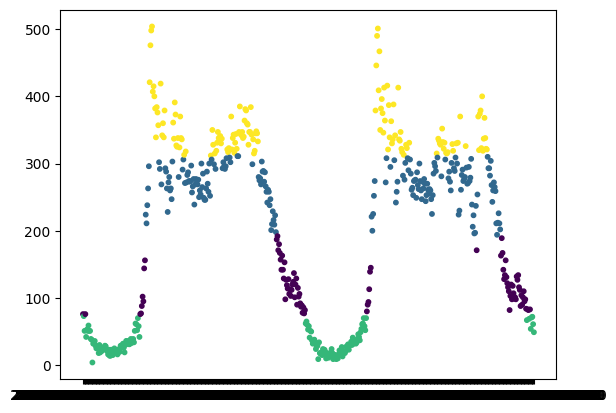

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5991735506423606
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 3477.3480869957953
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5307091880572795


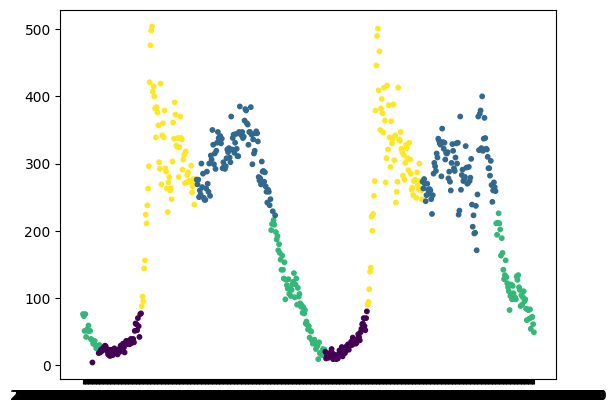

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.16048726306686886
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 907.1125803825917
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 6.407576885350649


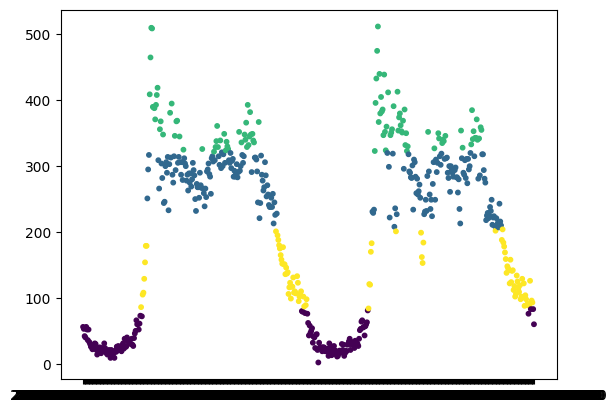

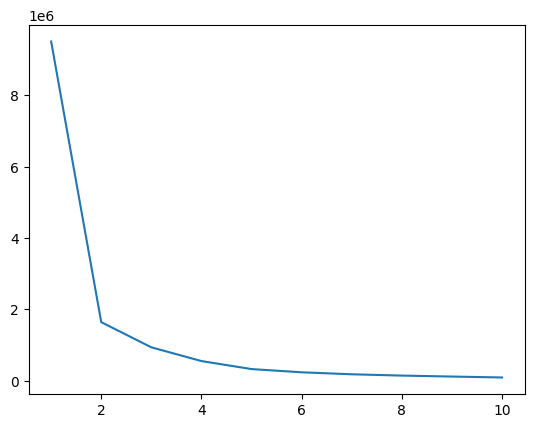

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5760176966724564
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 6906.772929461456
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.4908511682076548


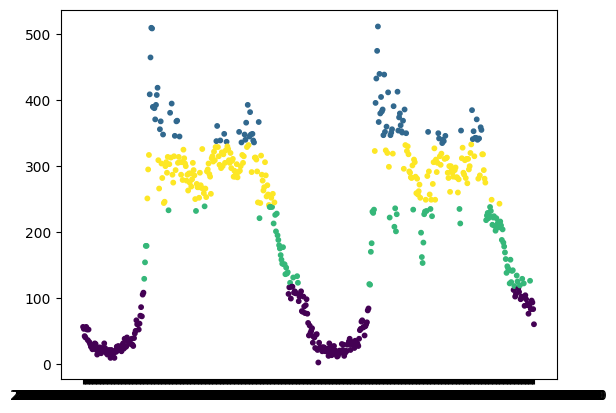

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5870958792328312
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2871.008854789111
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5427771430392205


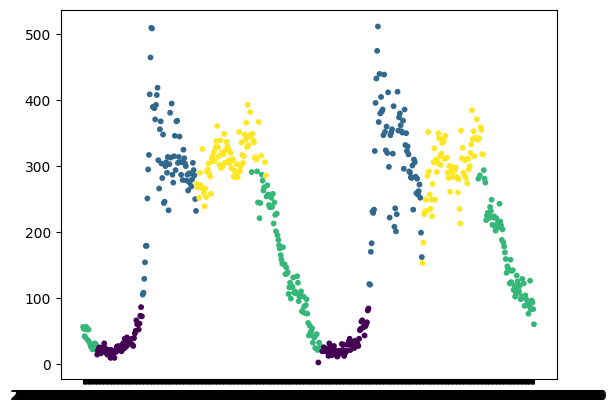

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.14159537077066975
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 659.2013750573083
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 6.470690777952393


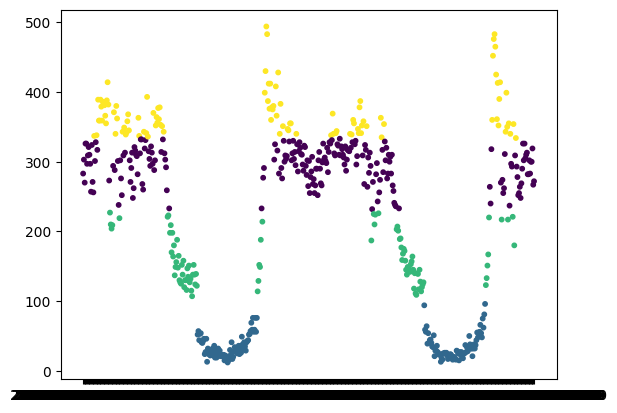

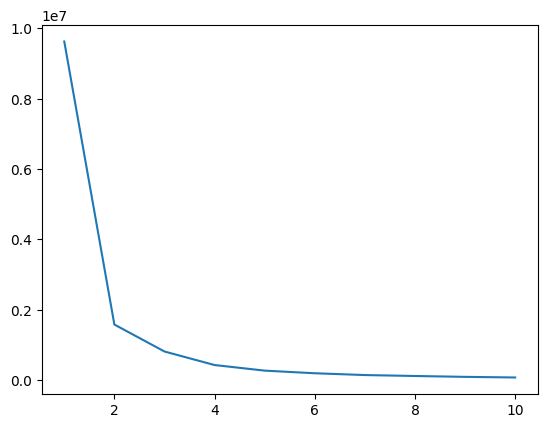

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5663868872522845
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 8083.163907334874
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5083335297704291


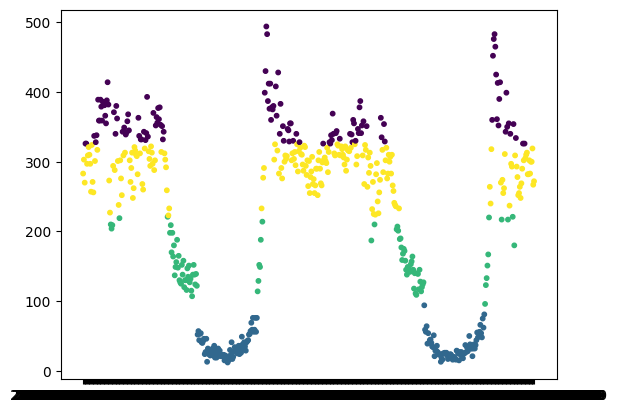

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6173710355916165
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4034.759640045682
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.49967459032238704


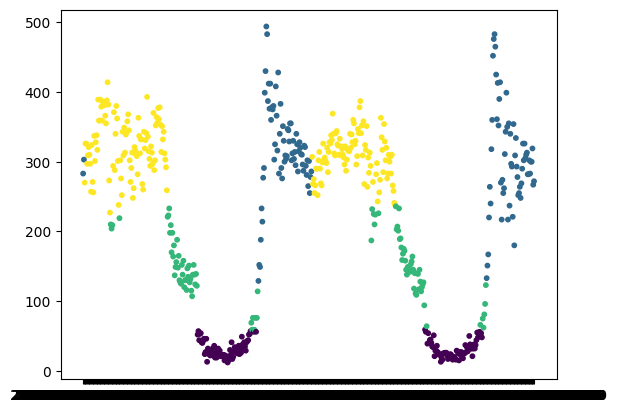

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.33352372479931275
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1421.66232082952
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 6.45401192826294


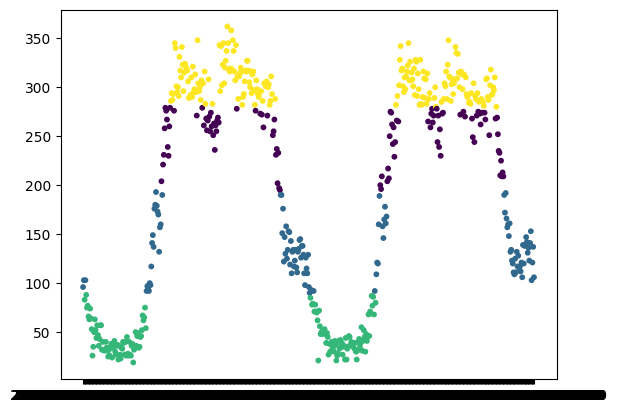

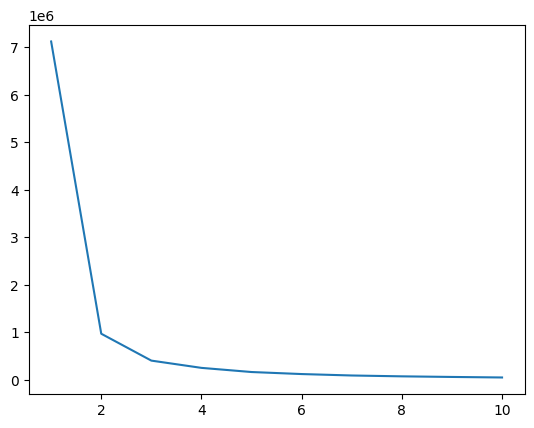

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5652233109470586
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 10021.72367531258
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5106788291252873


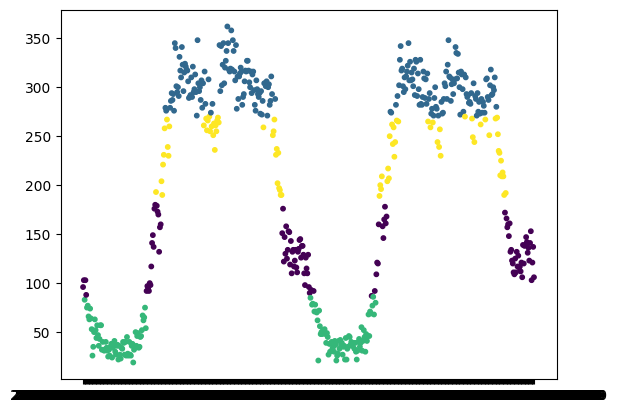

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6285783961991162
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 5308.008106254268
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5005323530952741


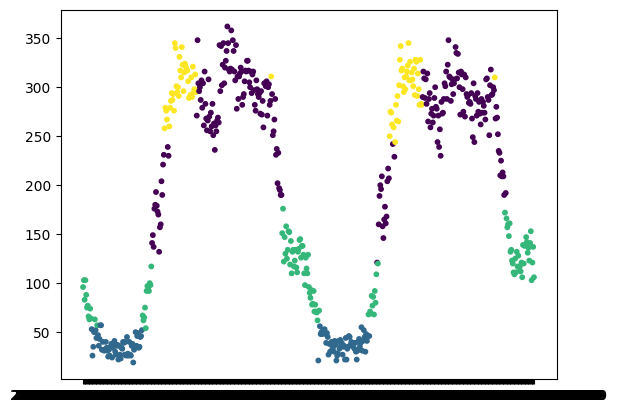

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.20715949314608023
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1625.655900575574
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.1995357019436934


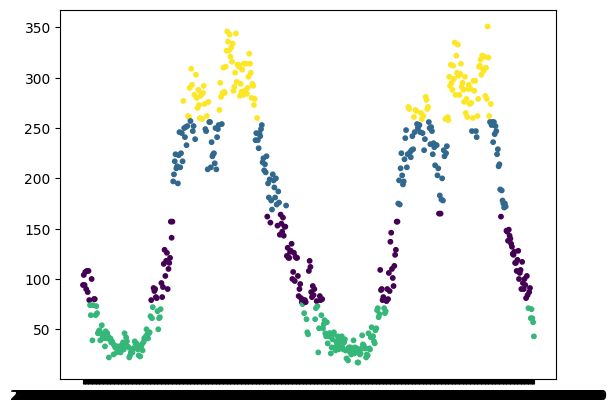

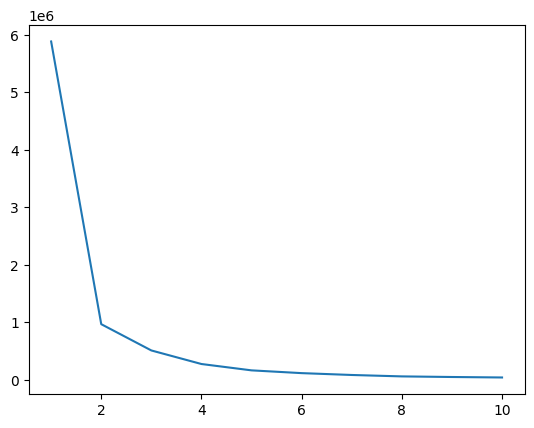

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5549244850902886
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 8313.835518828118
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.522076236867444


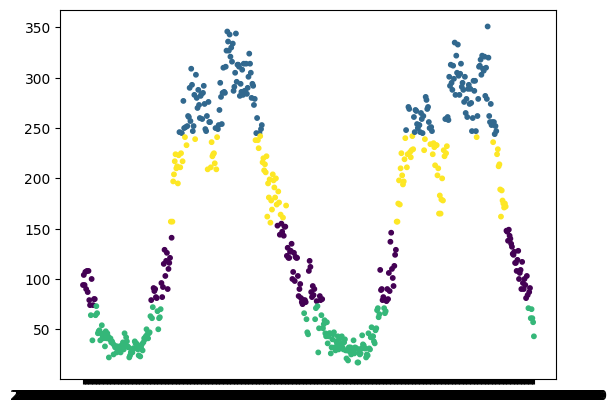

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5906463619730808
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 3745.7052680357565
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5205965353583227


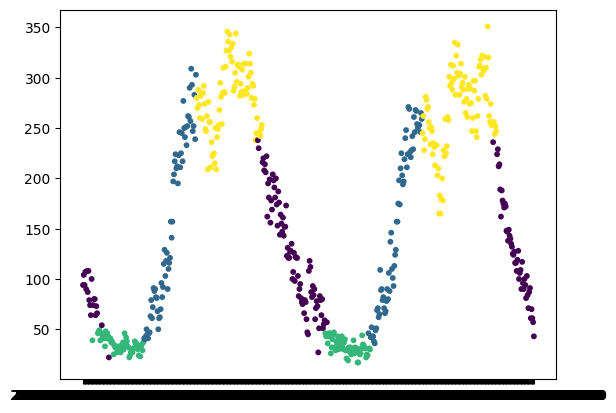

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.2543482563553787
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 524.9853054614244
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 2.1702939384813935


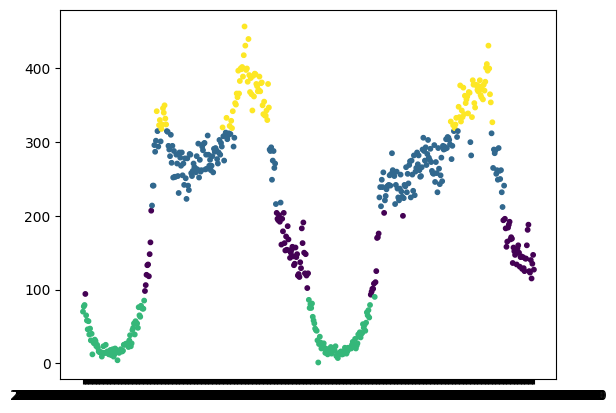

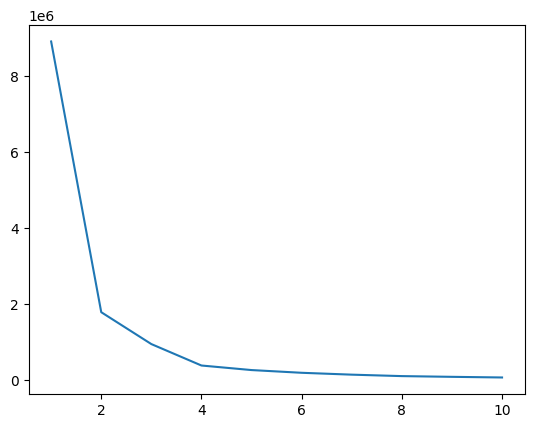

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.569851531680338
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 7381.2096866124475
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.525524185485713


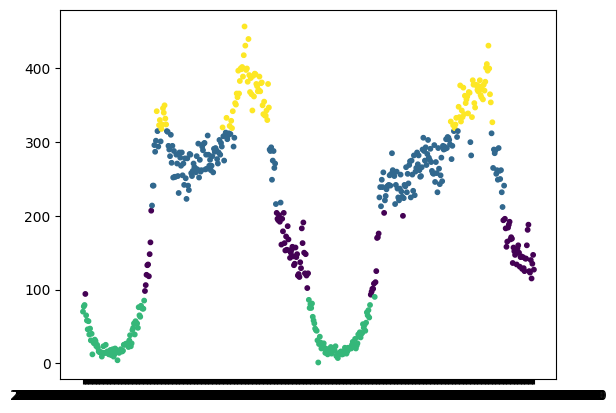

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6541879098827074
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4165.759433241491
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.4282602106934446


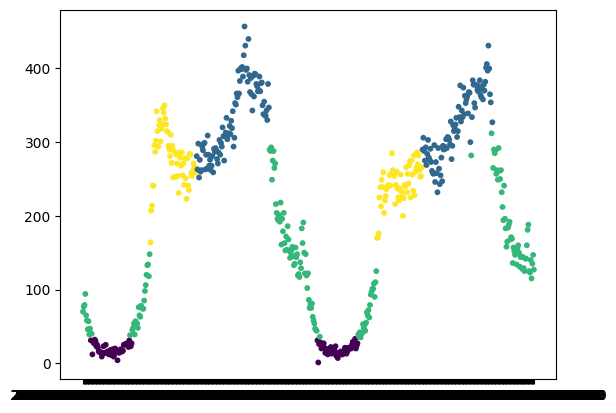

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.257070497519468
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 969.5007605998742
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8188815924680314


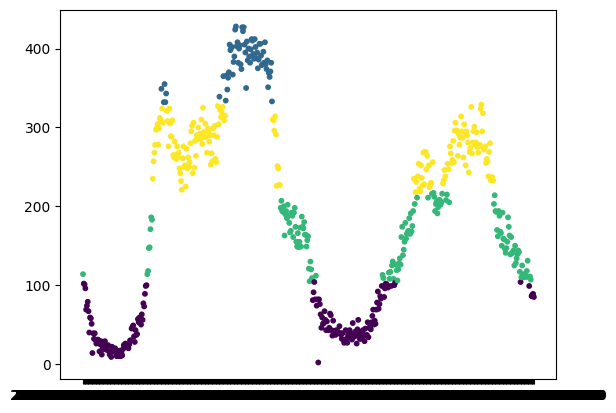

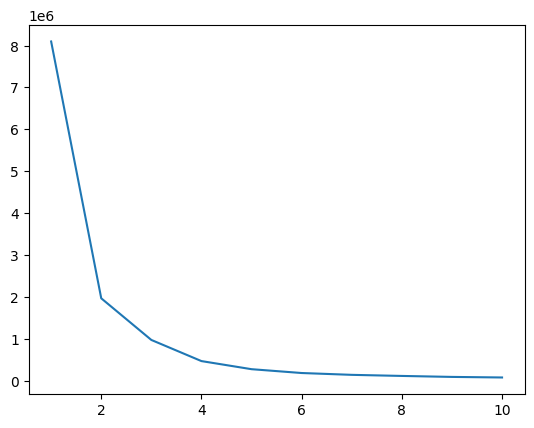

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5534631359410105
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 6614.639675870005
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5124333868117495


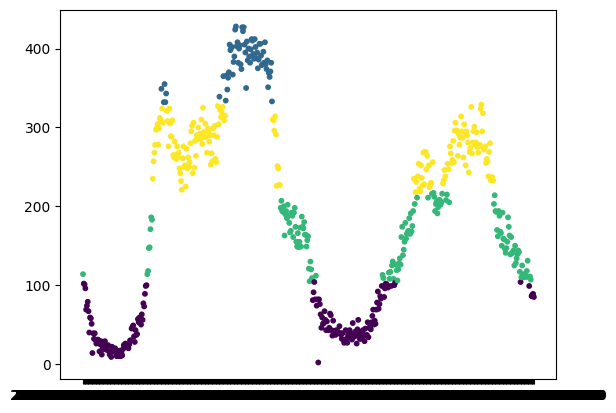

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6192381931010487
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 3111.4266907802094
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.43890658112417913


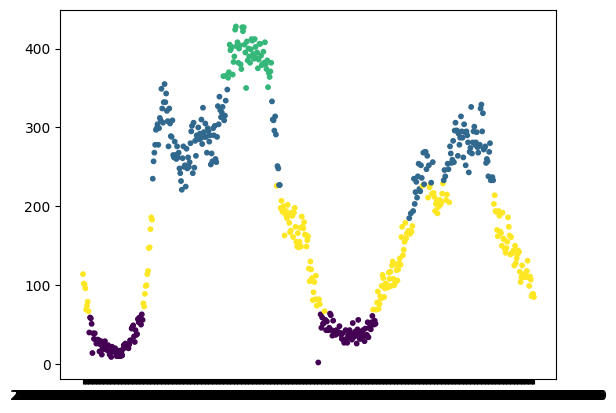

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.5701880536008271
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 2304.6309946544416
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.4507362582325017


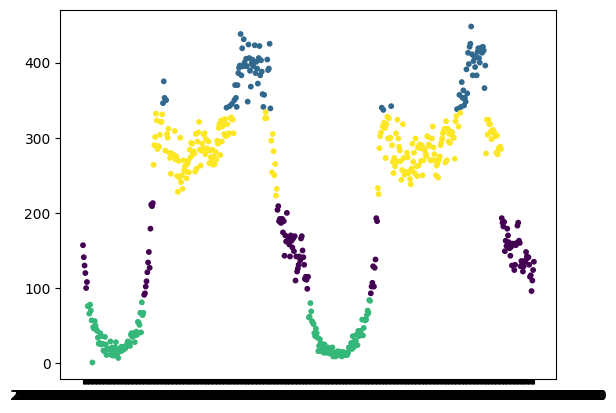

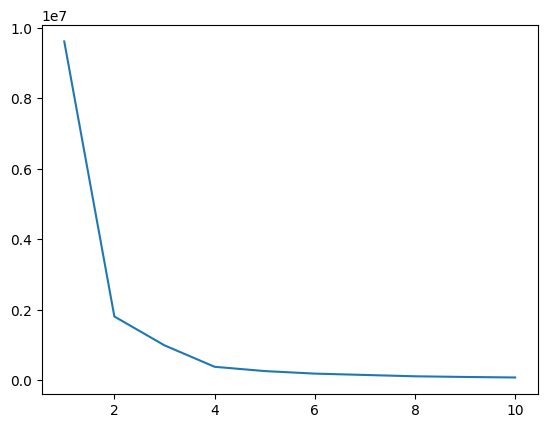

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5618019297814247
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 8647.964877001456
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5256114010095894


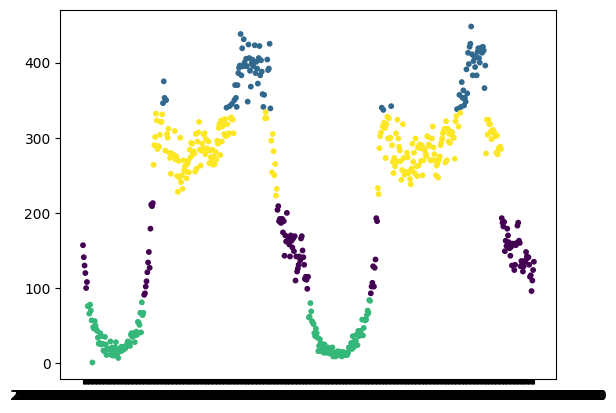

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6800473100419008
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4720.054605639512
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.41441694476617336


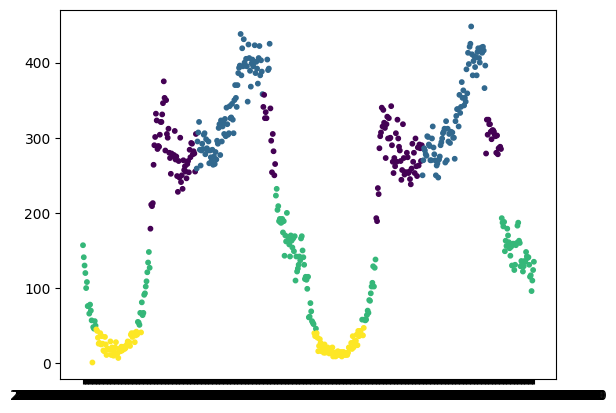

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.33526934239665995
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1717.644482908435
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.9271333914961075


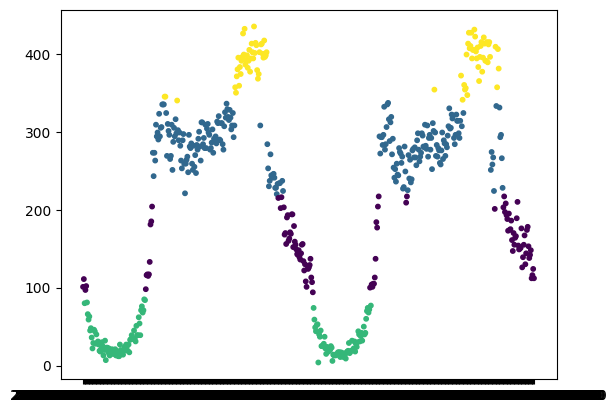

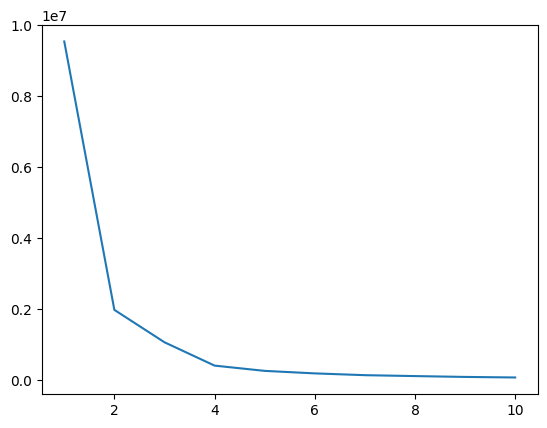

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5636051126844782
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 8245.501033252294
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5114138877745934


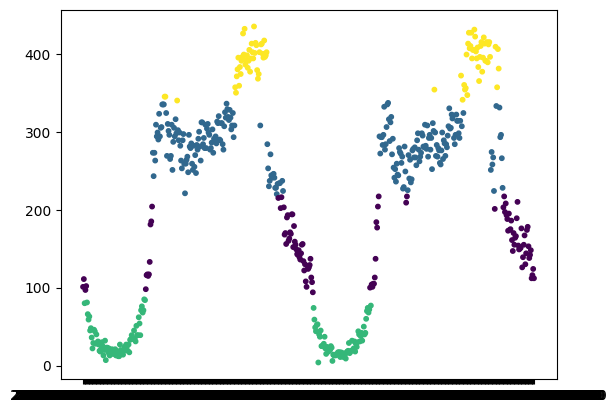

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6784047391772928
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4282.517869546897
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.38420088231044136


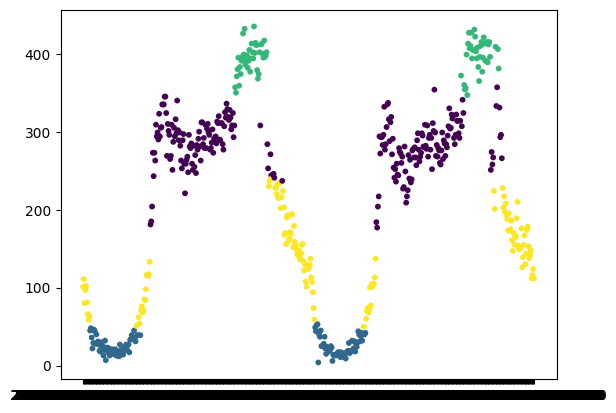

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.6091412155371565
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 2751.099514140964
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.42932437694997416


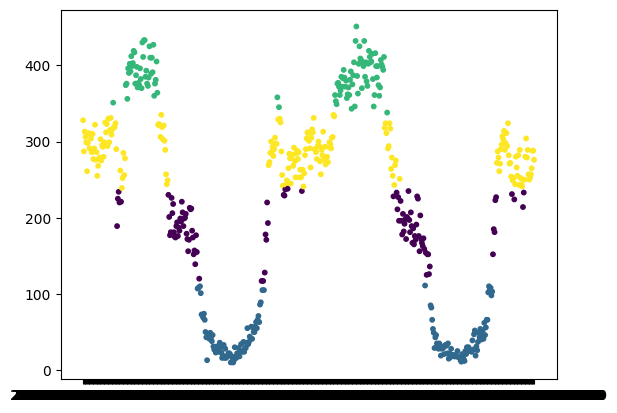

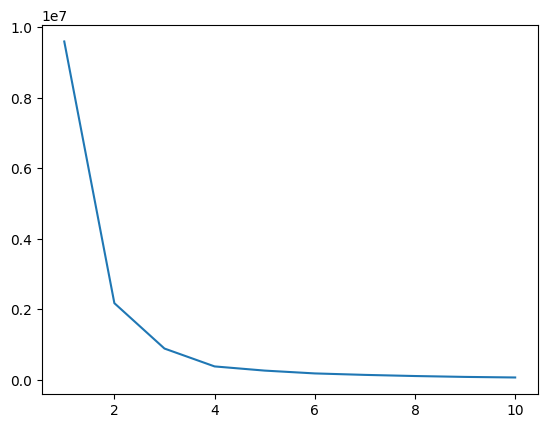

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5743605690717151
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 9222.814623963923
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5070164544899811


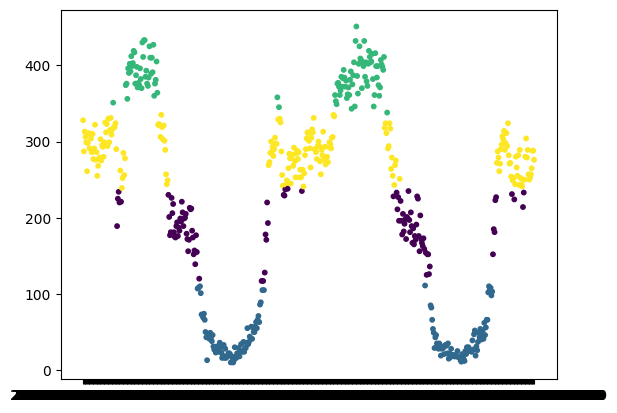

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6740349761361892
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4613.573169193174
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.4034280495064665


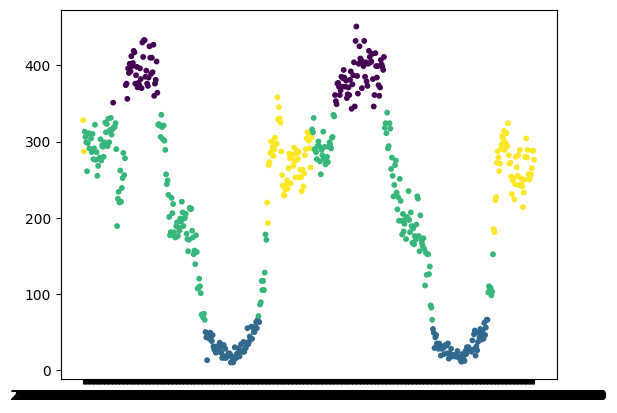

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.34454435871963074
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1110.5793127731968
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.1989748461184604


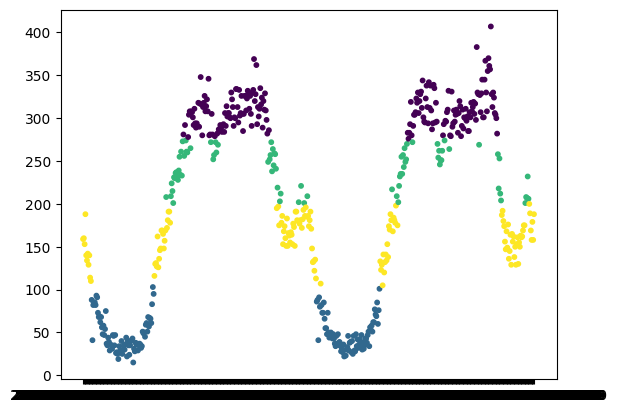

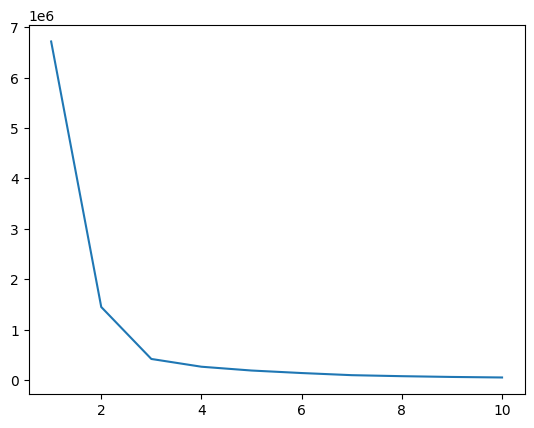

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5577904704080824
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 7828.644095597669
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5130600541918129


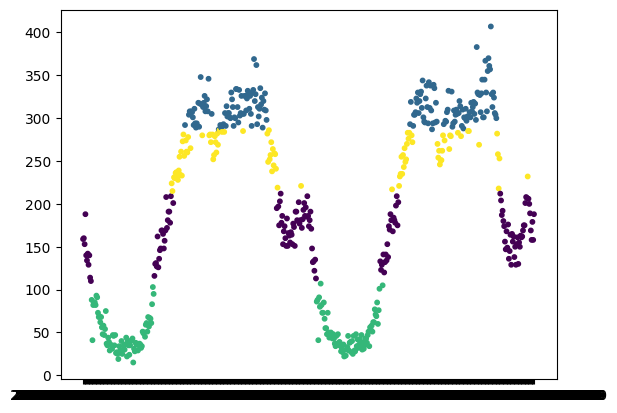

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.6354726199784072
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 4608.190462808267
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.478690698849498


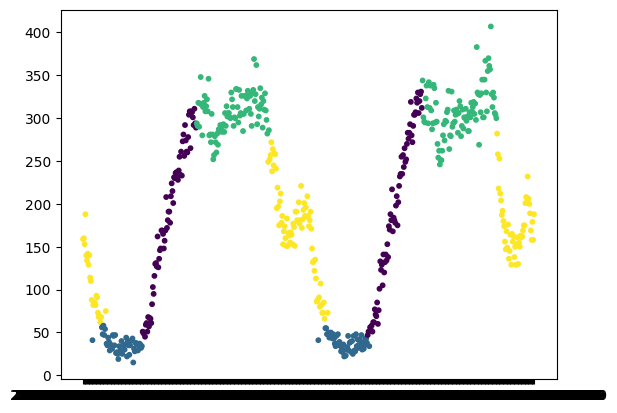

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.337292534077594
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 645.5094666320074
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 2.3856963321891262


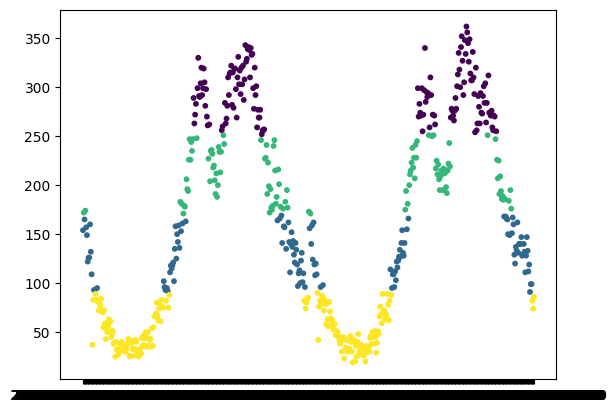

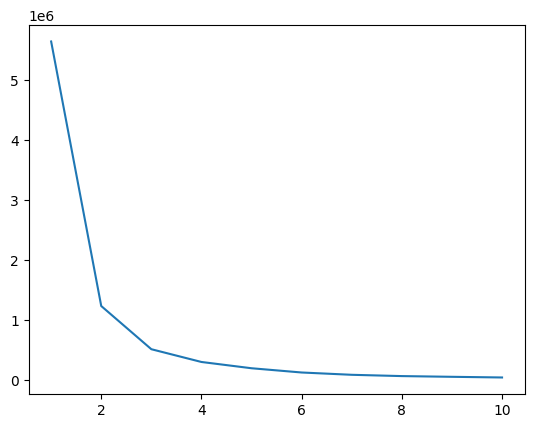

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.5415174965894409
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 7012.011596685015
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.5257253604455926


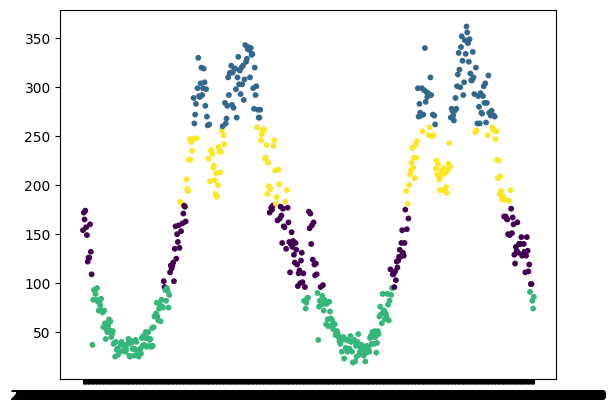

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.5882767801668937
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 3290.6966426541203
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.5057142645211857


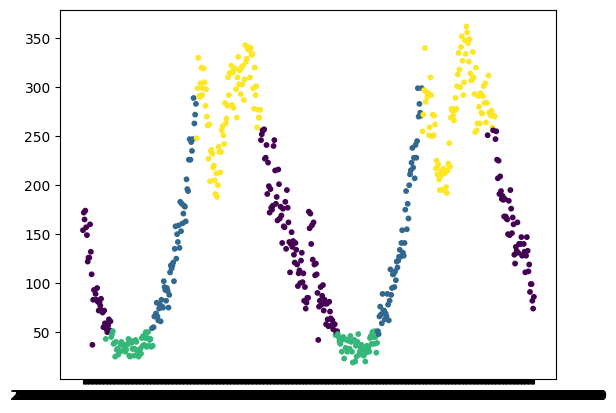

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.25239555110622947
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 569.3010876574167
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 5.891533461046434


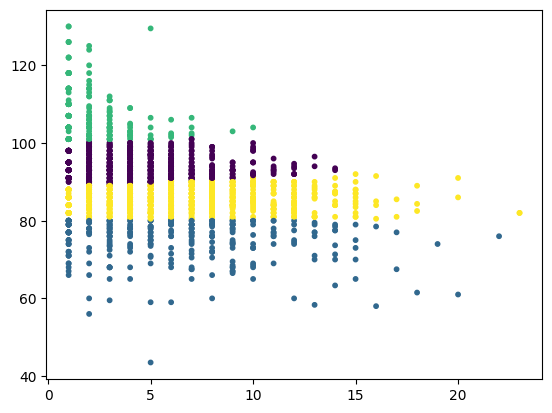

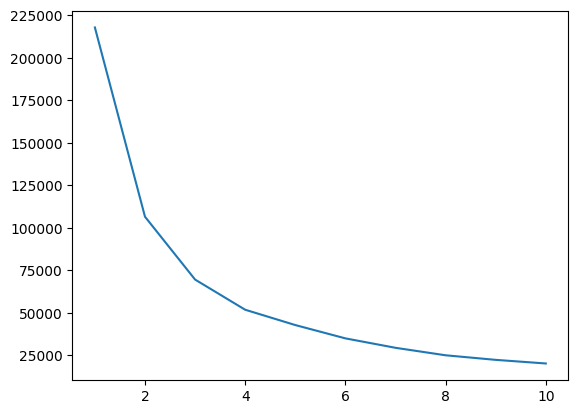

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.36579108390528864
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2184.947831600579
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7997706538527802


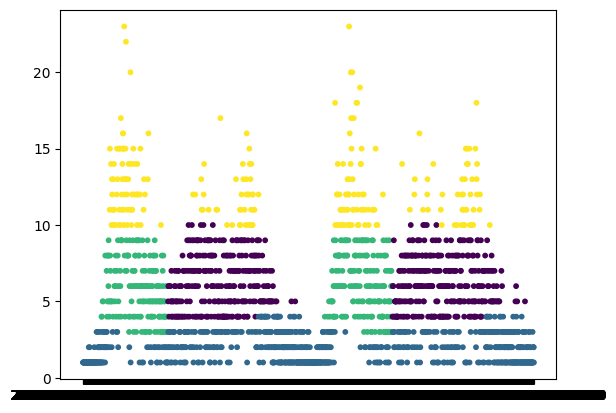

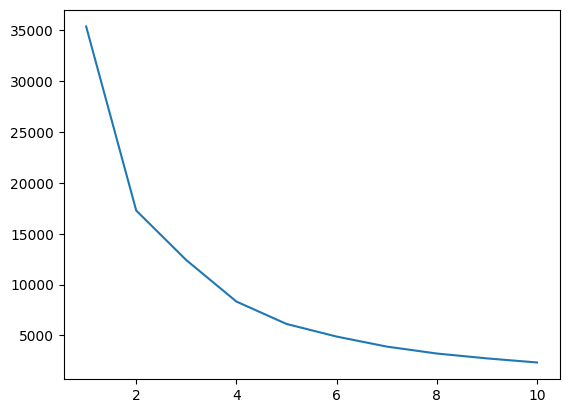

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4594343630390394
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3154.159836223838
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.6546606006263398


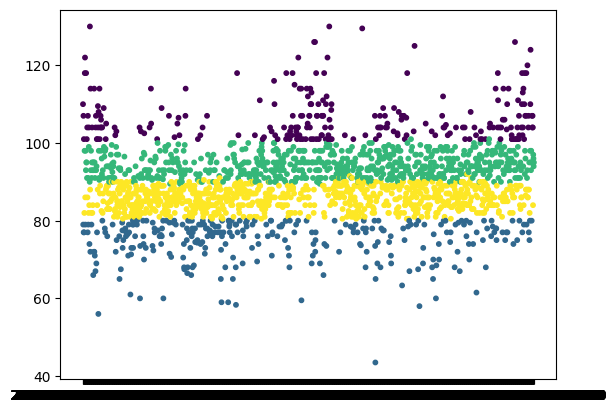

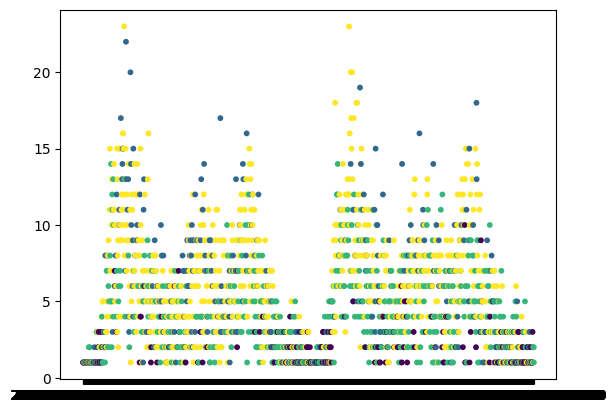

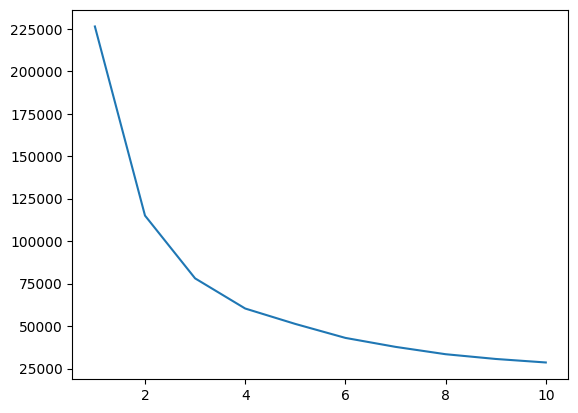

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.28772650736785726
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1551.342471647898
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9899983278753757


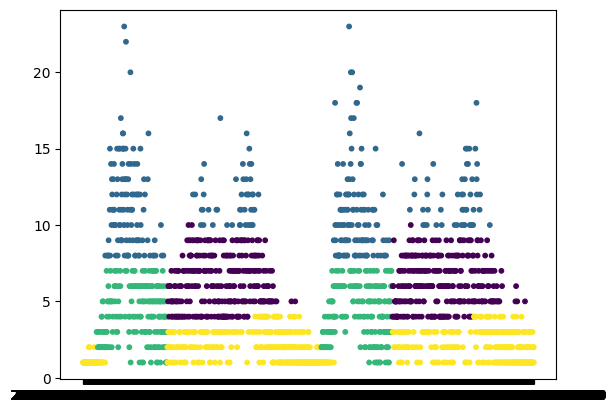

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4460889604541035
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2098.0201141656157
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7567371004589598


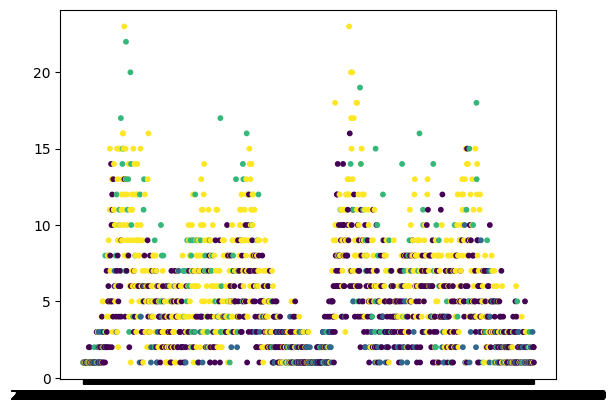

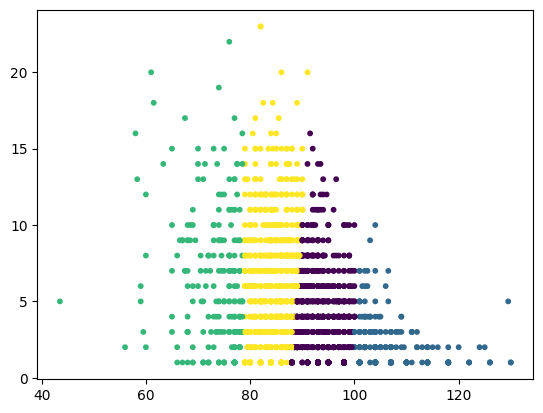

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.33778154739497934
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 1841.0915022870797
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.936430027376729


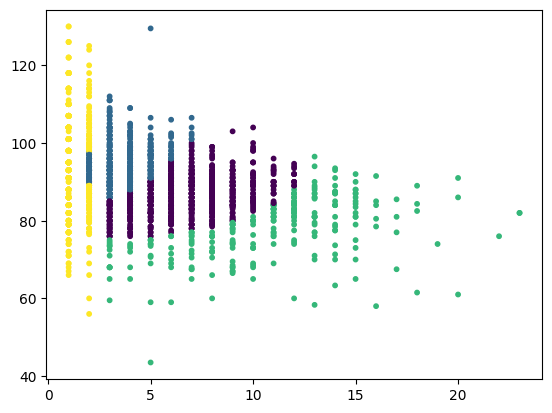

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.10441996923982312
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 445.3898908330194
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.438002838978823


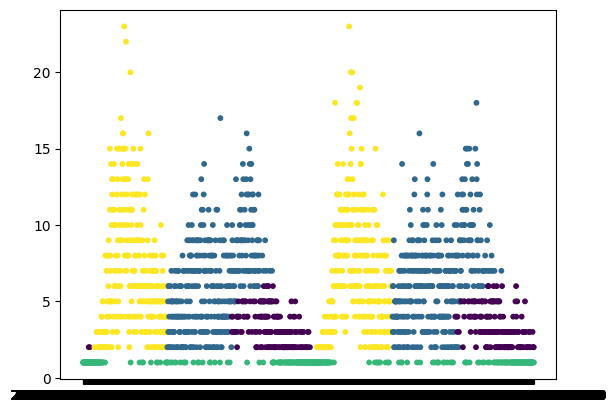

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.189665329252315
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 691.8003888705703
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.1003085369013499


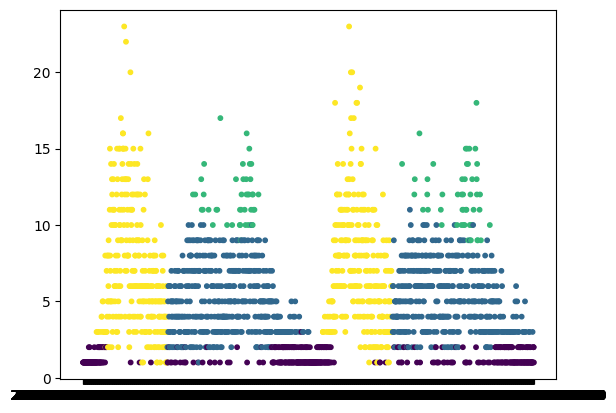

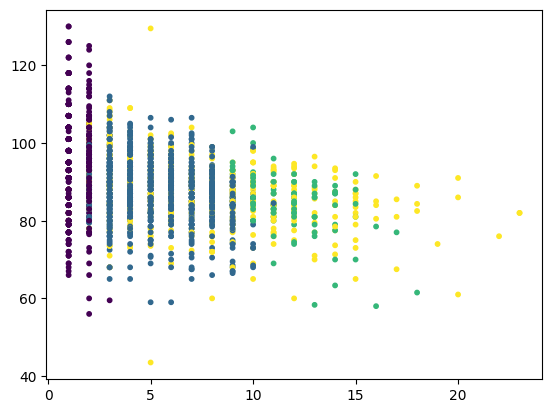

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.05084746690501285
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 146.37754591255674
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 2.4533021635711667


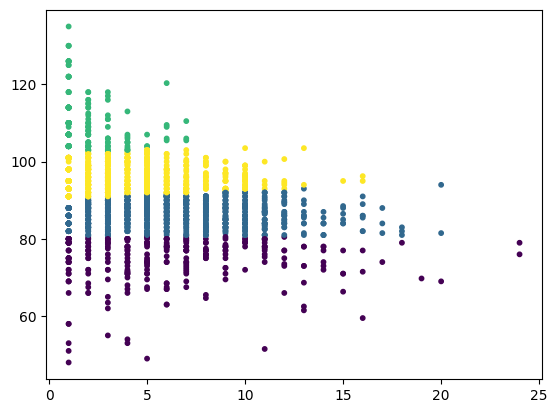

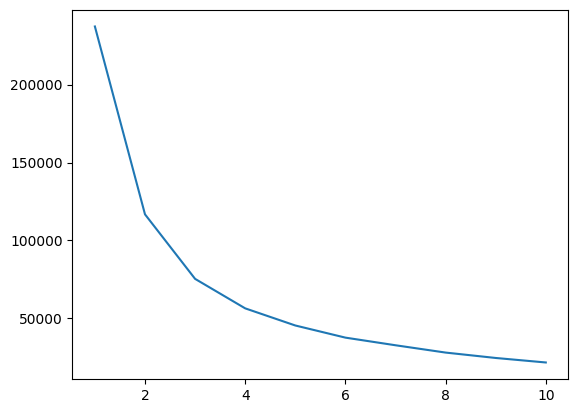

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.37395793407336797
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2254.188912548778
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7924960923747524


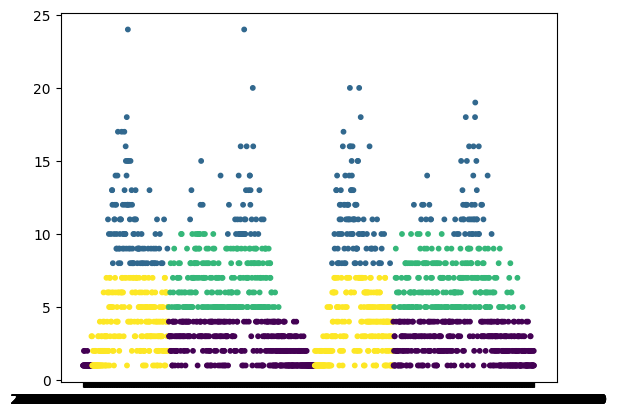

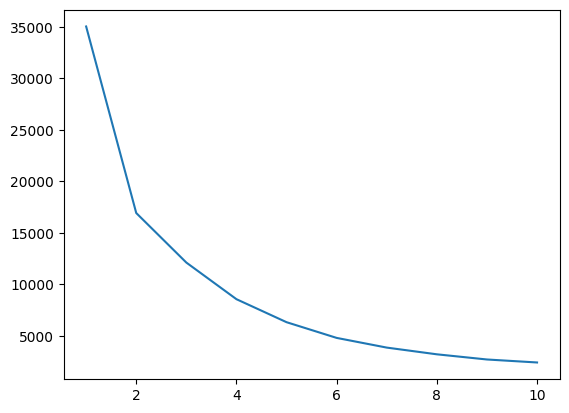

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.453460679130541
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3036.936312076779
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.6814014427231365


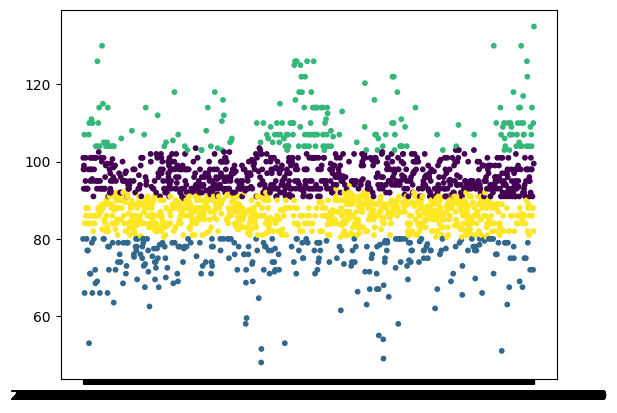

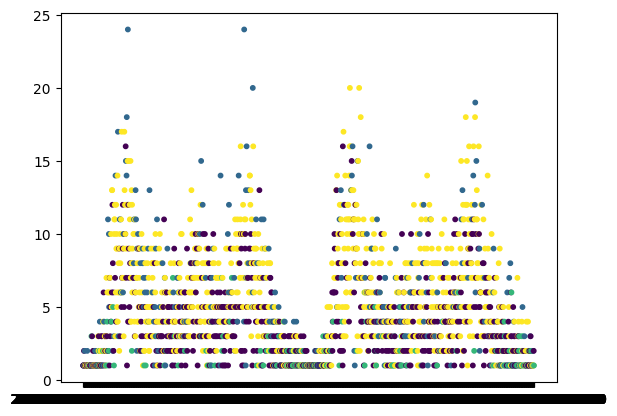

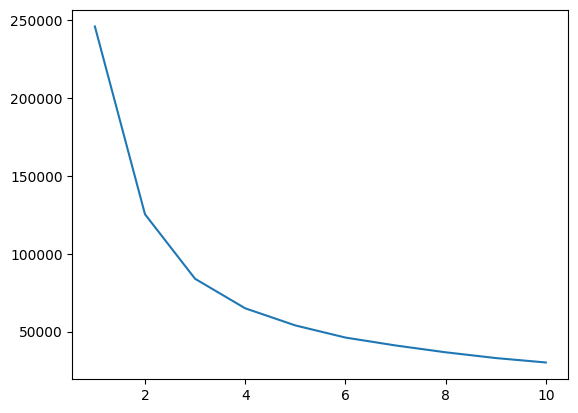

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2989002808990991
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1619.279538003465
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9490425428033328


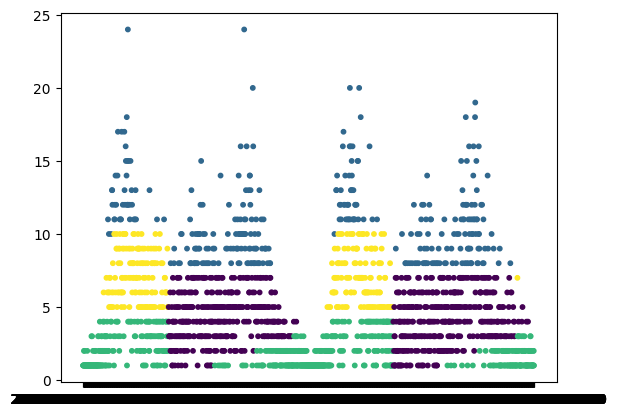

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4155434534413278
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 1871.742611631761
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.886332681996445


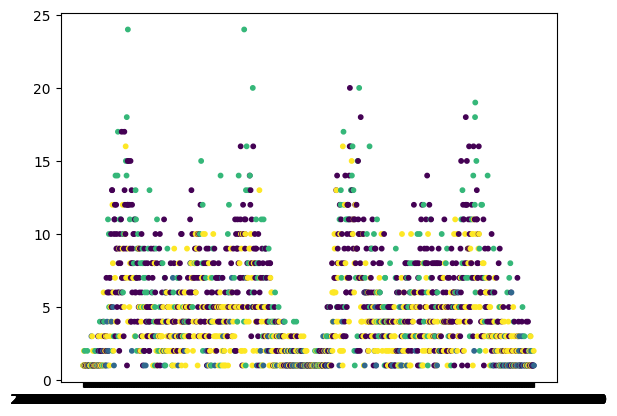

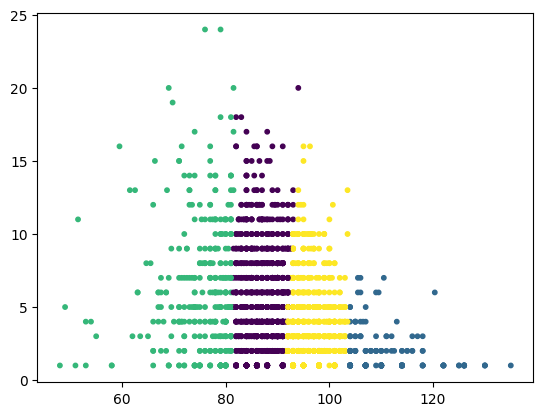

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3387823568793947
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 1888.3661943240804
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.9053778007232102


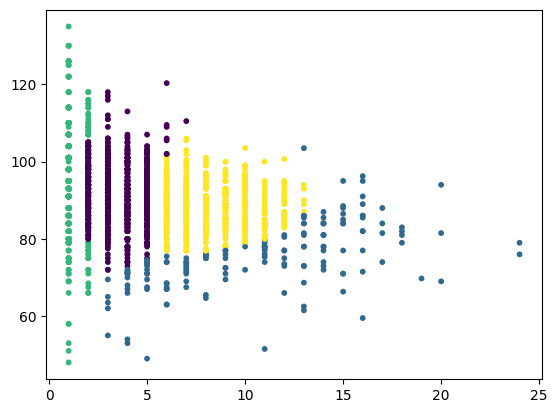

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.07247393809306137
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 281.03075551220763
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 2.9795343856256964


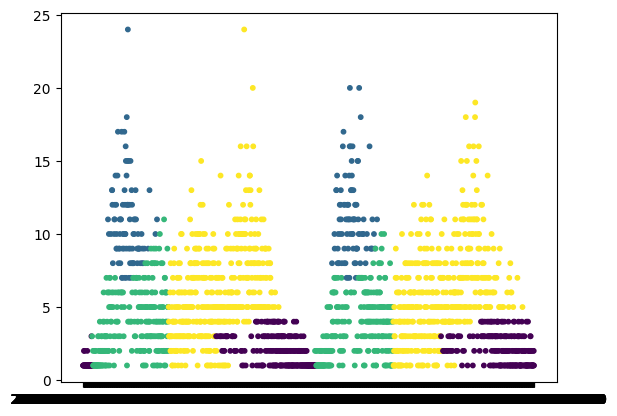

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.2937163848754665
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1037.295775202748
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8453318323559527


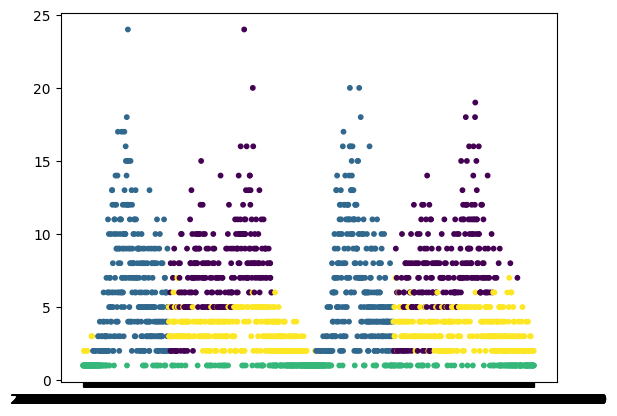

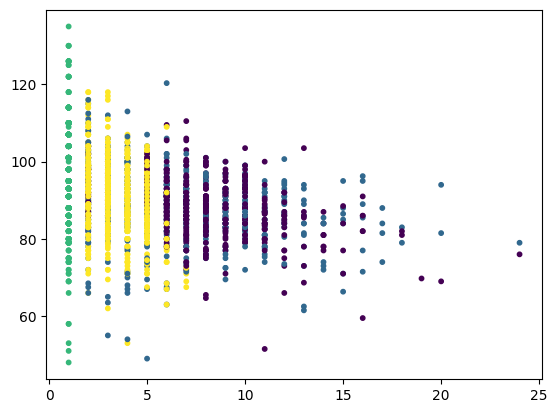

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.013553190315023837
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 102.3333988980454
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 3.348855545843627


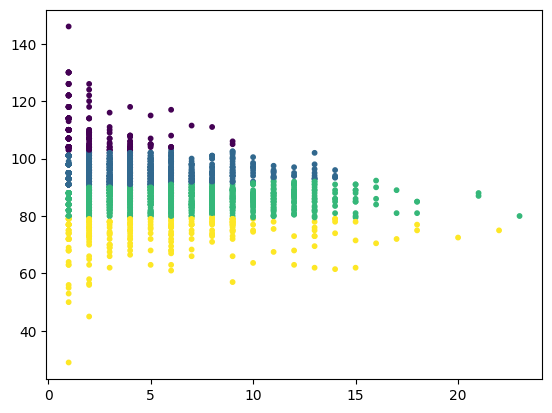

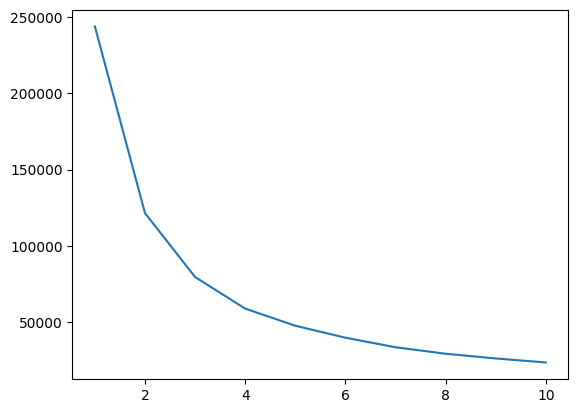

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3518212839188712
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2112.7633655706504
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7887829708976261


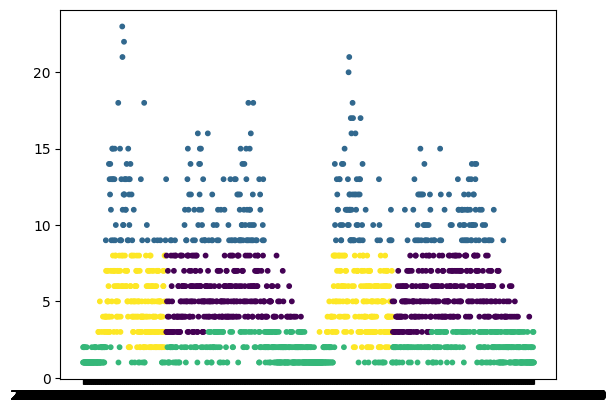

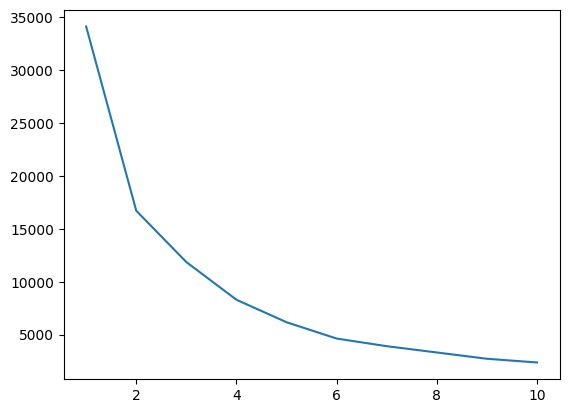

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.46101077578969885
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3031.9902188117007
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.6714859752800644


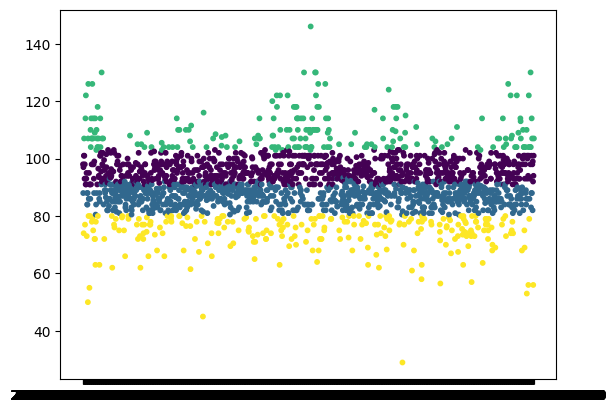

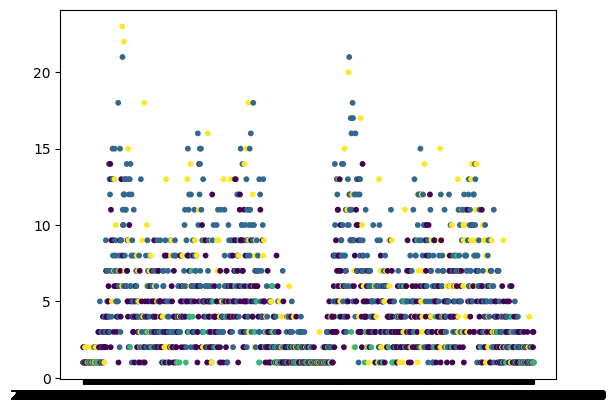

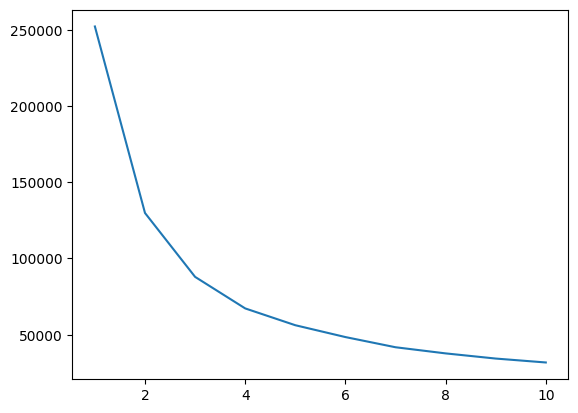

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.29013223663766935
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1561.5094613903273
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.993819852441393


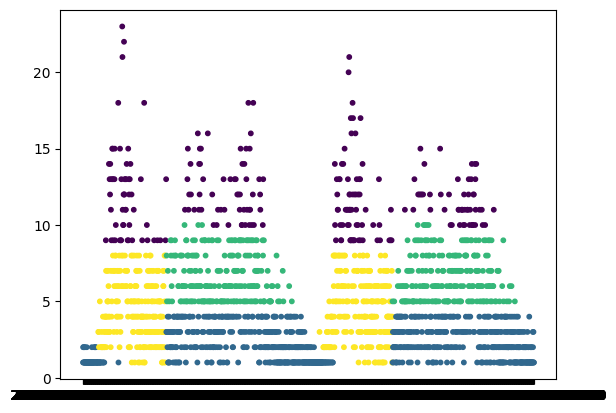

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.44469407318670306
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2089.759396831302
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7785105257876151


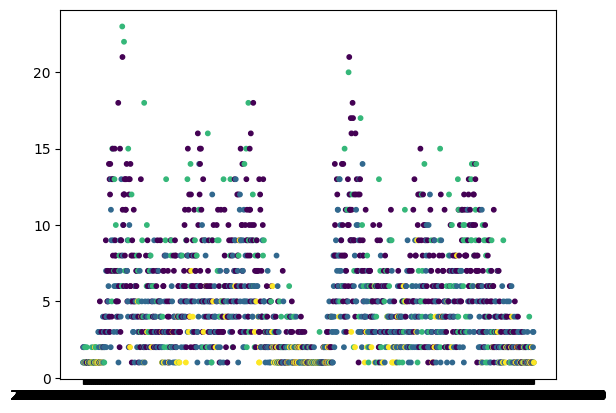

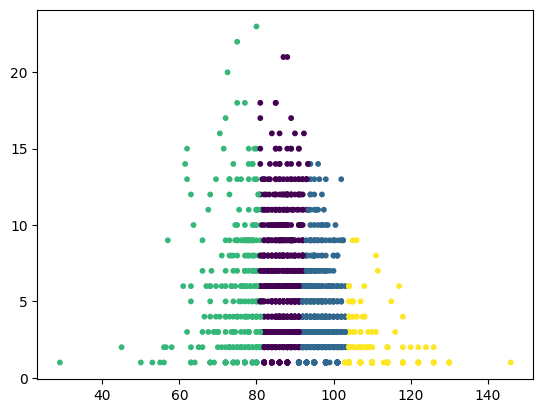

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3429315632082298
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 1856.7241234621708
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.9053826810128623


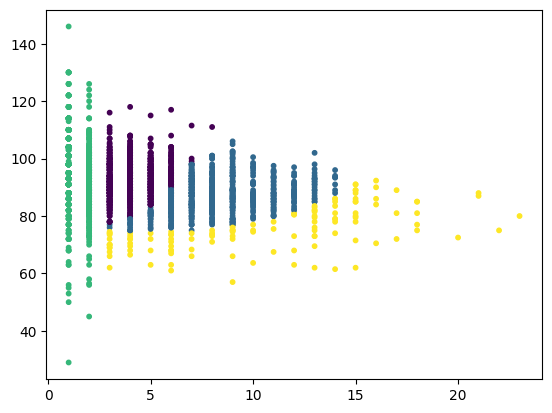

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.036576748993280804
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 259.42675661613674
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.183315957135724


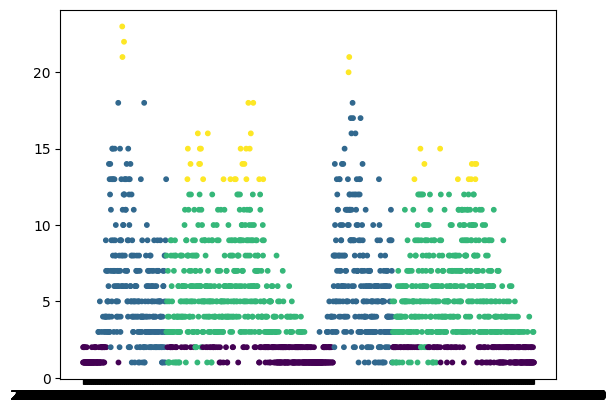

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.30978203629569745
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 874.829340466384
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.897314584004402


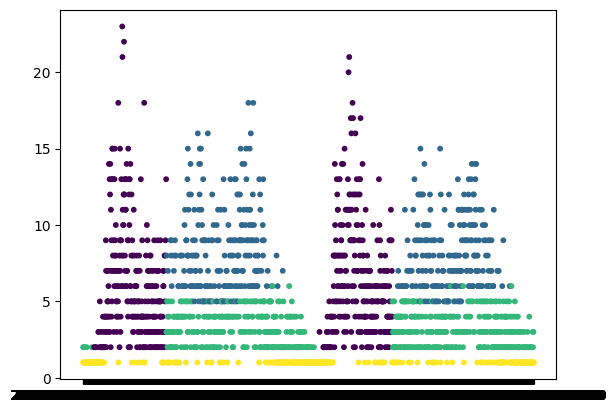

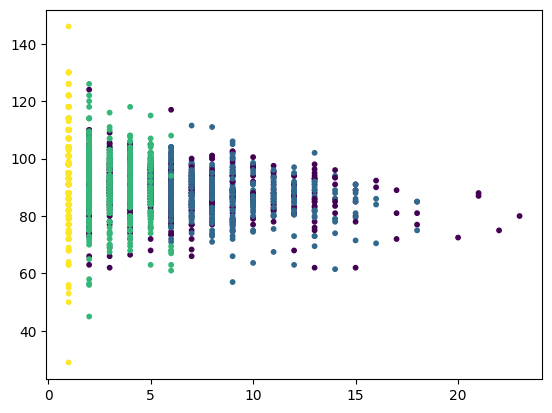

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.03434323872175688
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 112.99360726682843
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 3.067413892863857


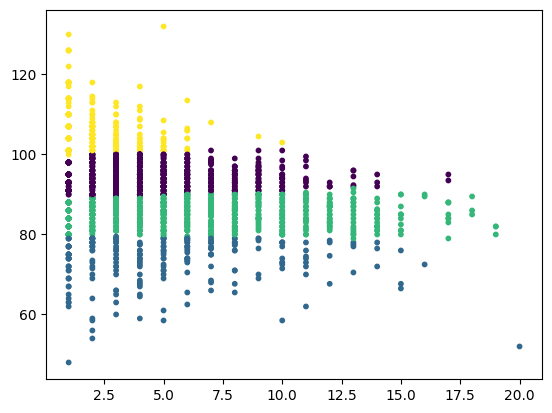

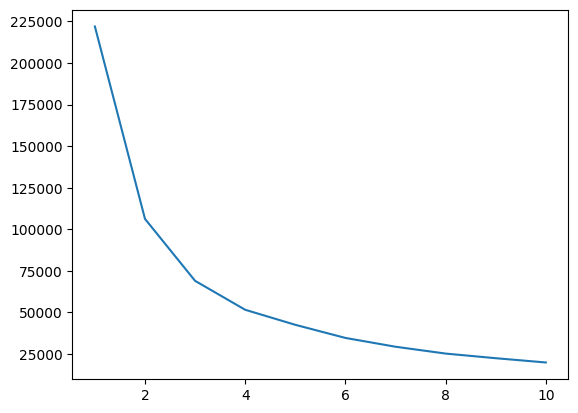

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3679103656281905
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2306.9897901583763
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7955250035575434


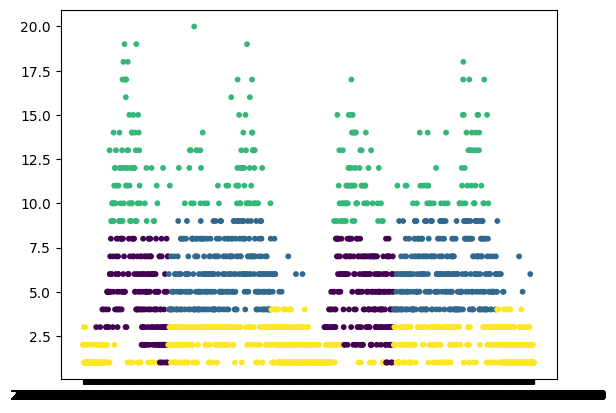

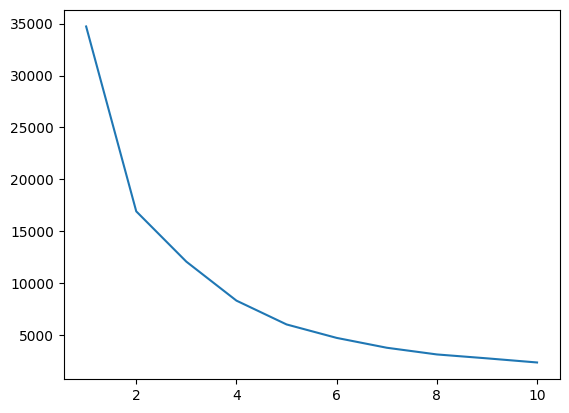

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.45242423088151057
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3159.913718638084
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7017977190578951


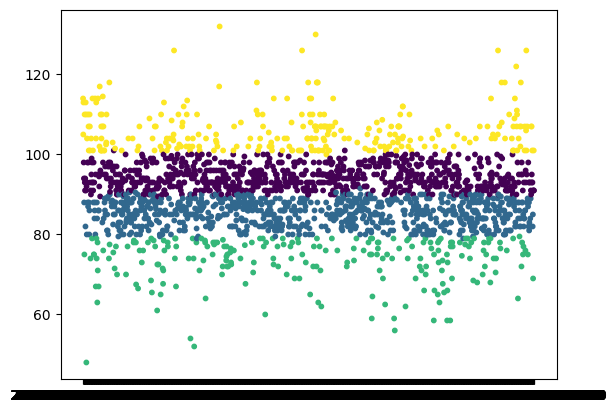

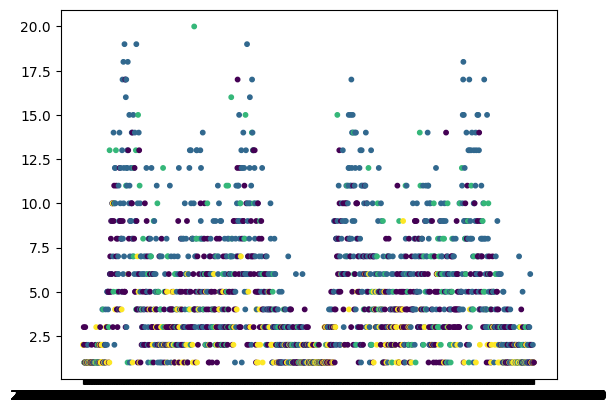

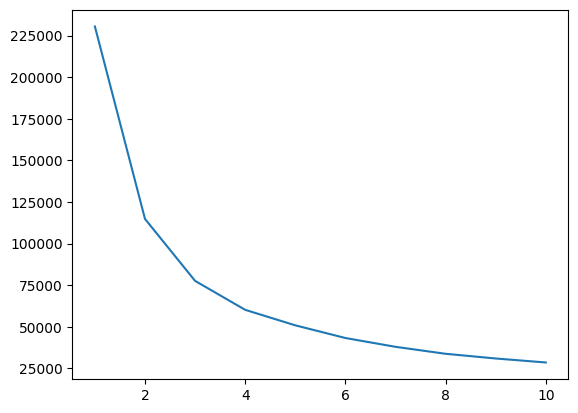

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2801974821310065
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1613.2008258781314
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9971704250000961


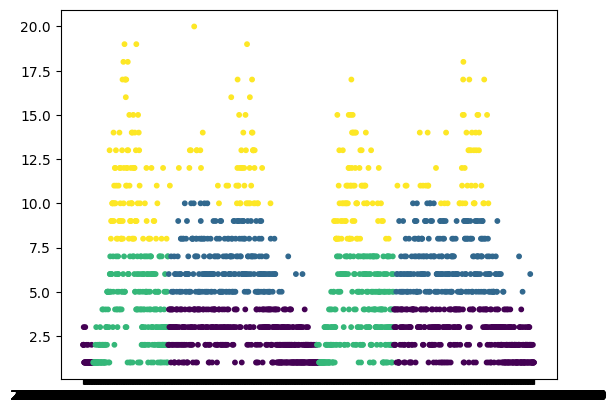

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.44084947511907324
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2146.8249361342287
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8327341966429502


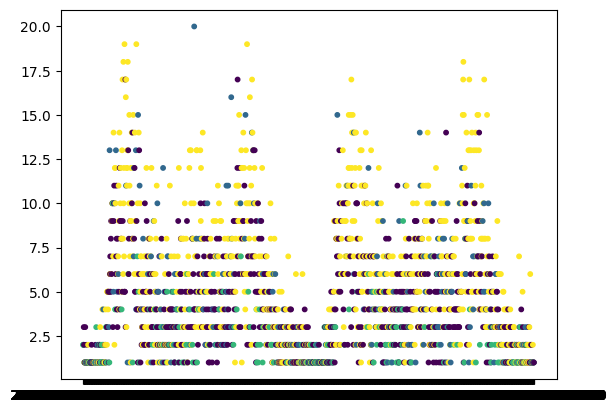

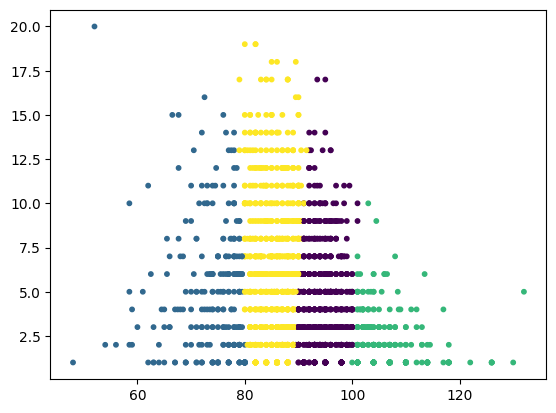

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.33659794132876997
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 1939.1535553334527
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.9387138635054529


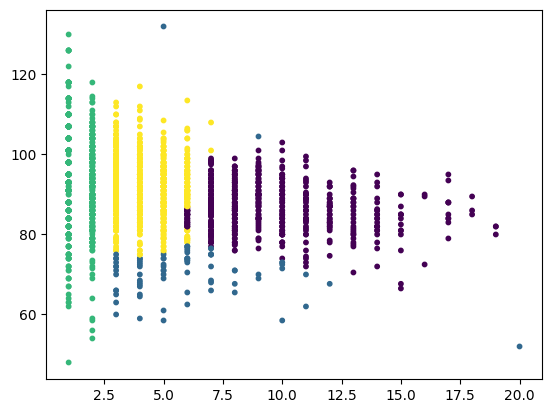

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.058140220431554666
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 266.8947390192
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 2.940424344874485


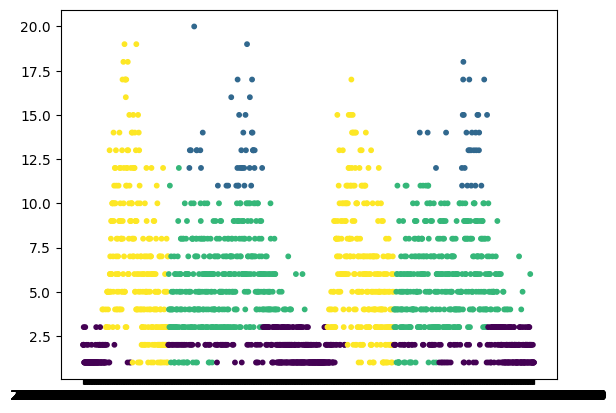

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.33077769346867386
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1025.9507001536492
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8797874306290911


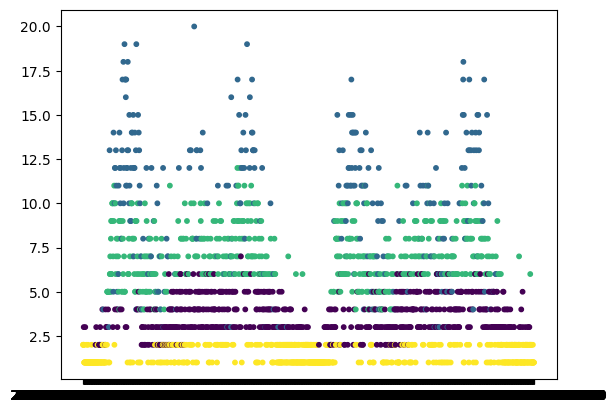

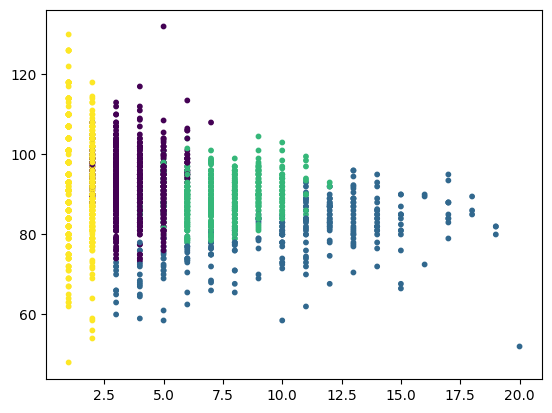

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.012895296399385728
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 249.00133902920408
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 4.212109902210057


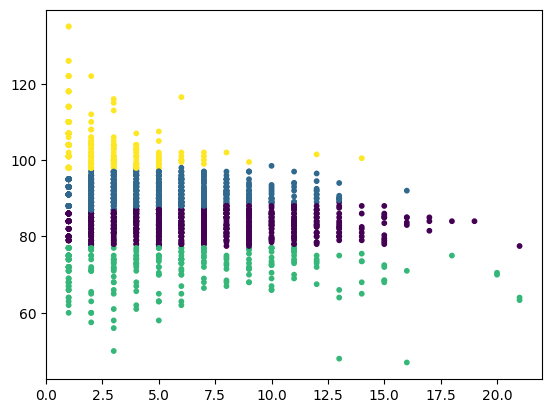

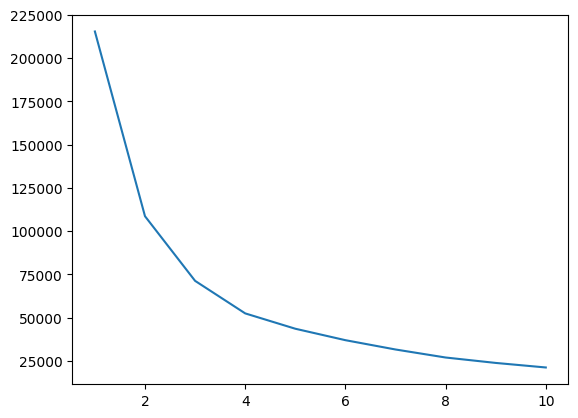

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.36142093581901885
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2136.04346363966
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7936555742634674


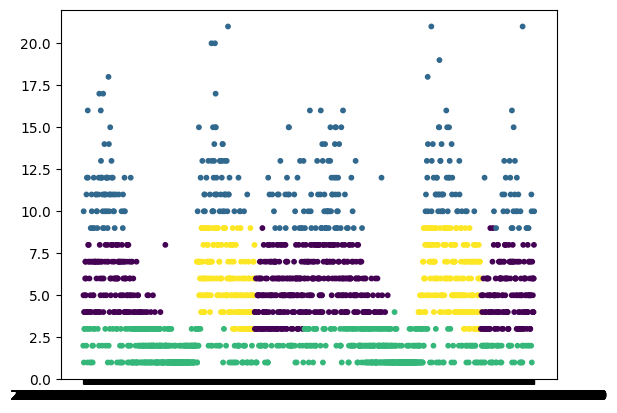

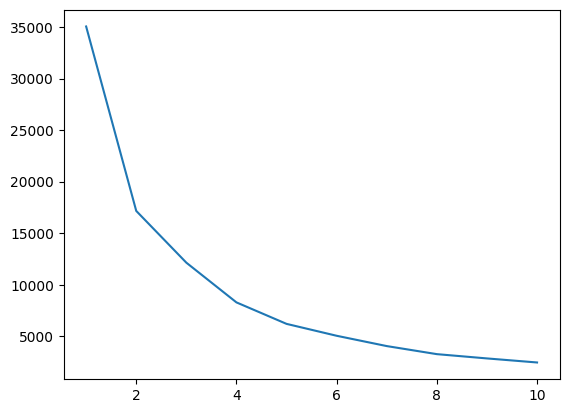

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4456814432507118
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3101.230933820578
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7325234444441768


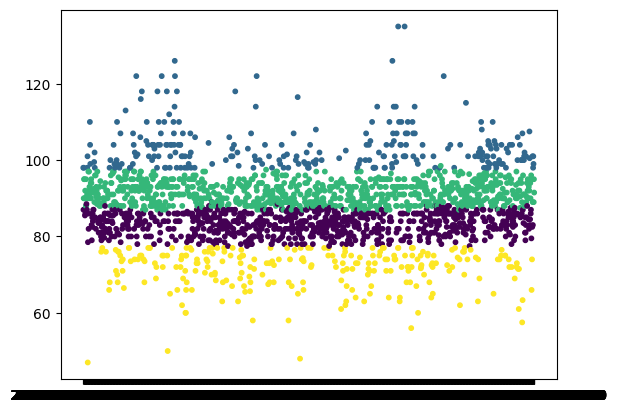

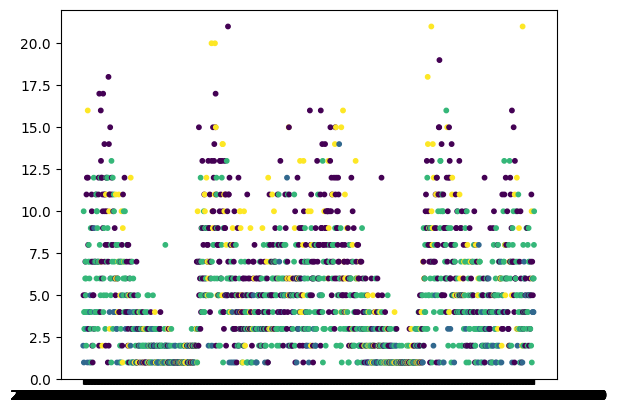

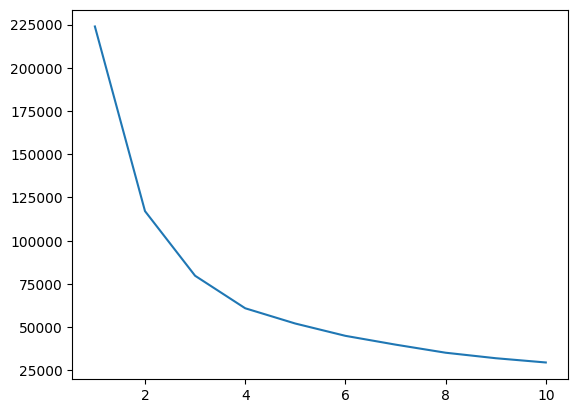

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2916323031498367
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1535.6292691542067
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9812567021652445


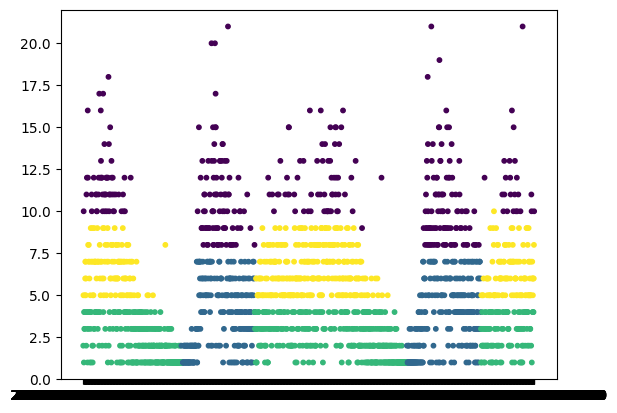

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.42944110181934336
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2116.702105720182
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8555992934175165


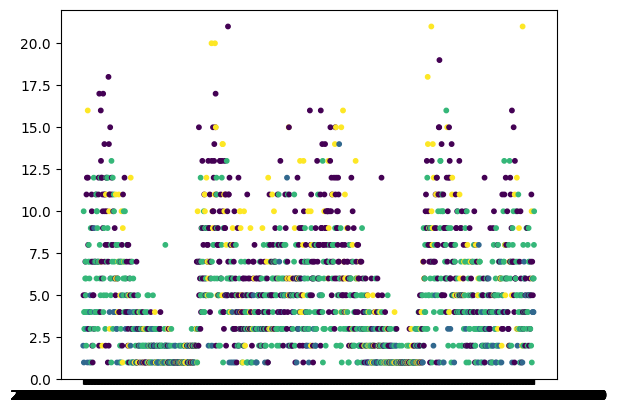

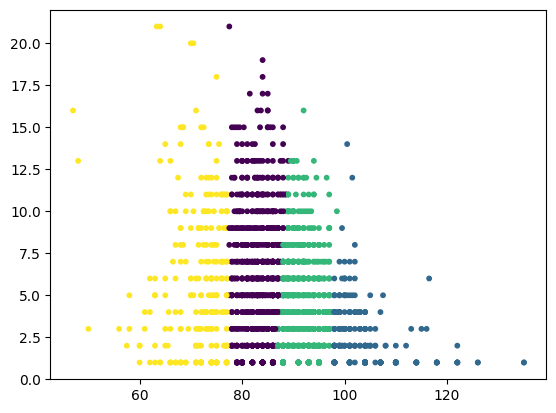

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3339725211298663
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 1879.139493899846
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.9558696451885784


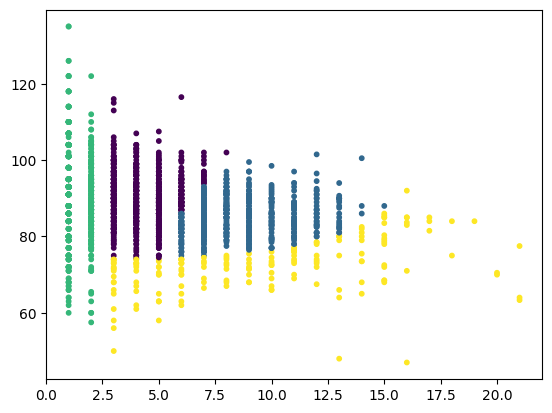

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.06287581323674067
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 345.3174186767082
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.02299254448032


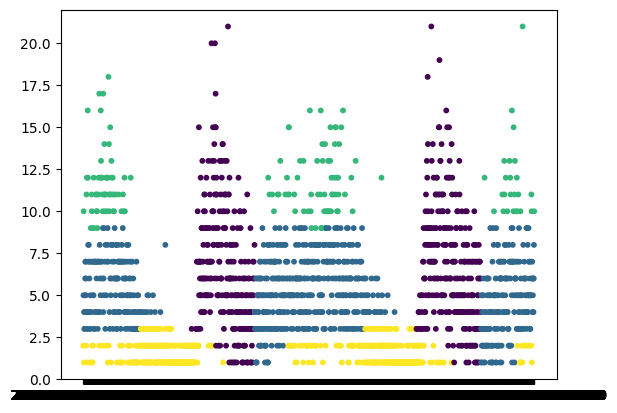

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.36879144163604266
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1301.0624449717814
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8466571961088281


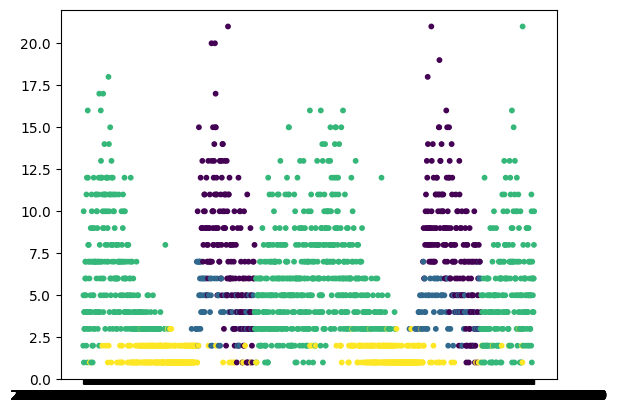

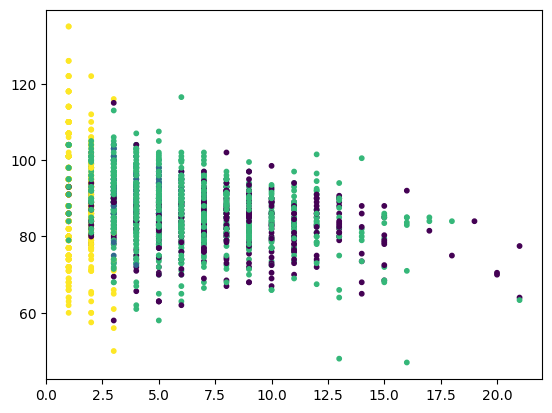

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.07243316235100396
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 104.98118847331278
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 3.218886886425606


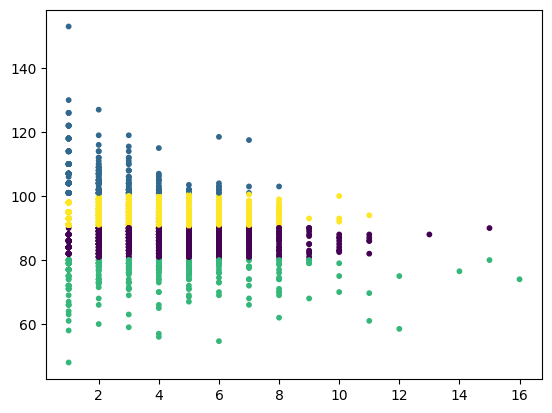

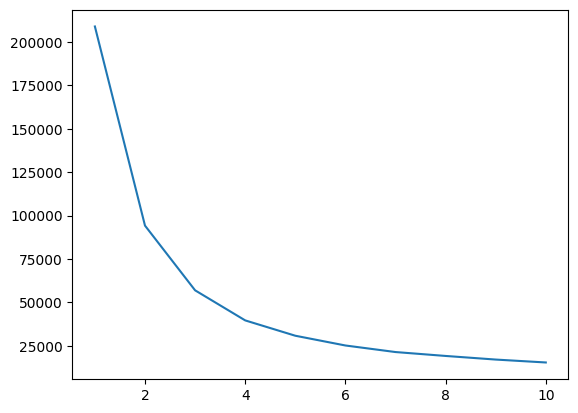

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3780813747098267
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2908.804265915024
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7827564339045908


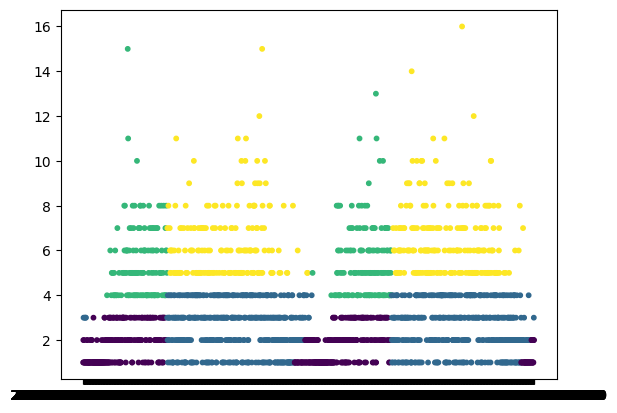

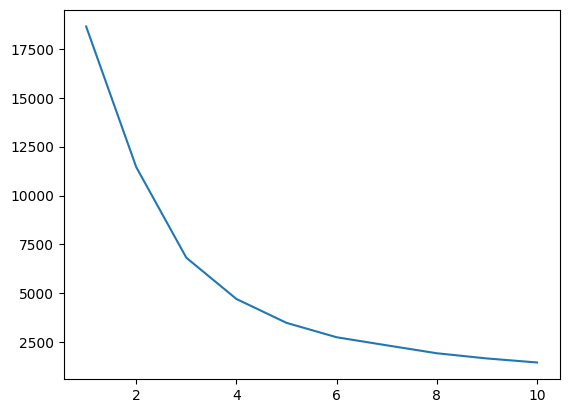

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.45951185346583456
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 2706.361992110697
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7390830131552415


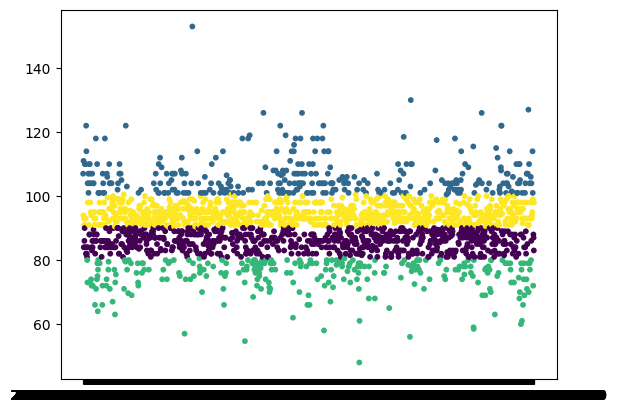

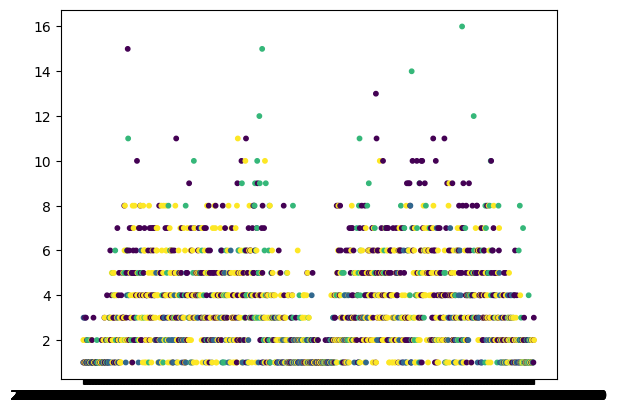

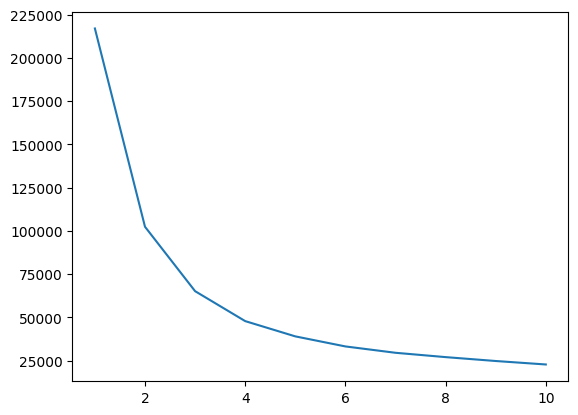

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.29481311127217213
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1978.6238804898776
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 1.0346913982026285


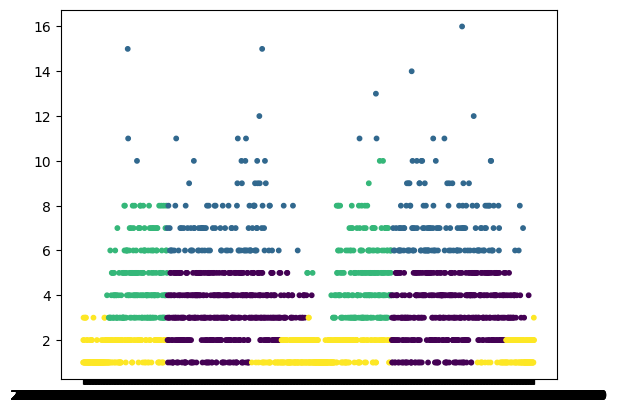

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4289772865355186
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 1960.4168579983916
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7480043711111108


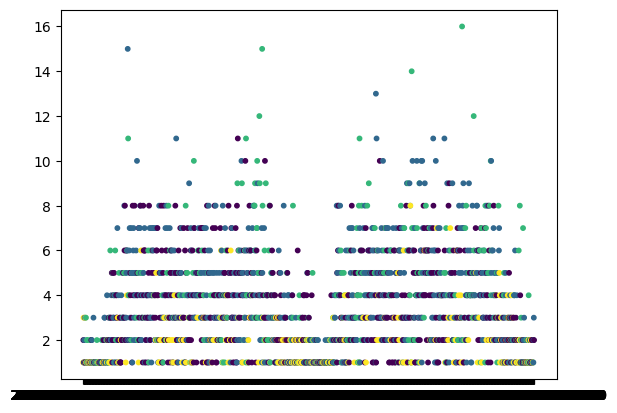

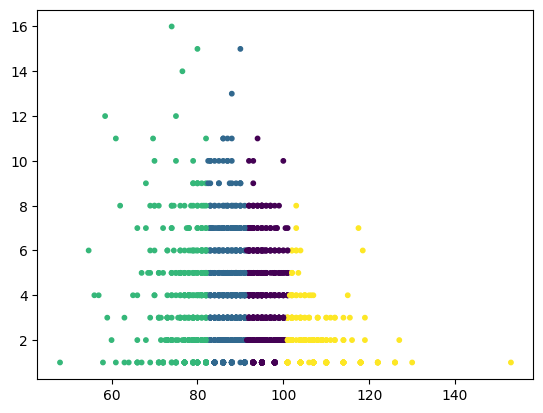

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3590845454621319
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2401.233876162321
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8660260314695708


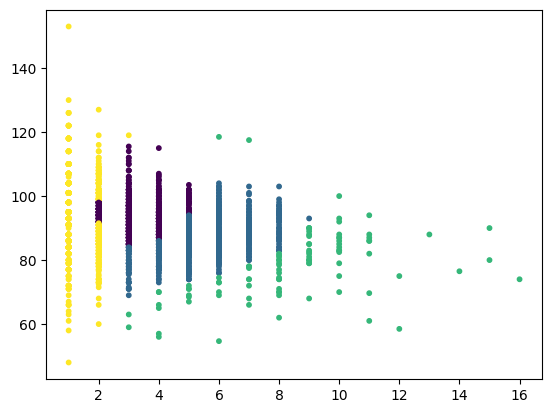

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : -0.00467134480361062
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 196.38108883828008
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.9390308787021246


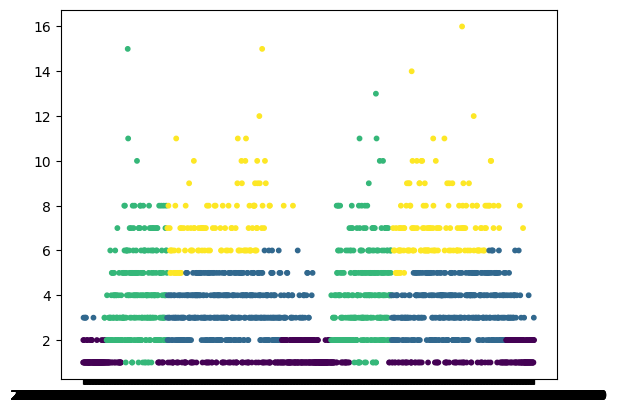

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.3902721384819952
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1676.6852962434152
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.7906860599101435


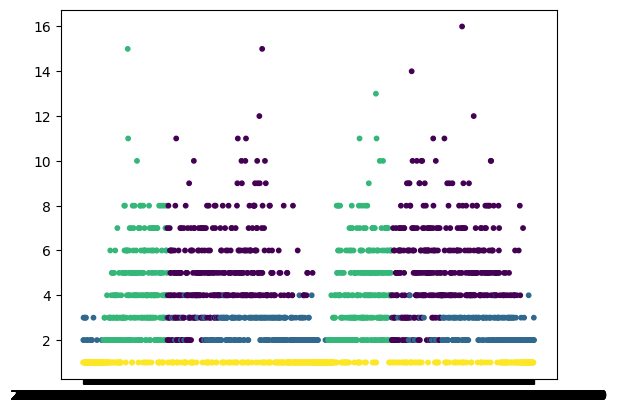

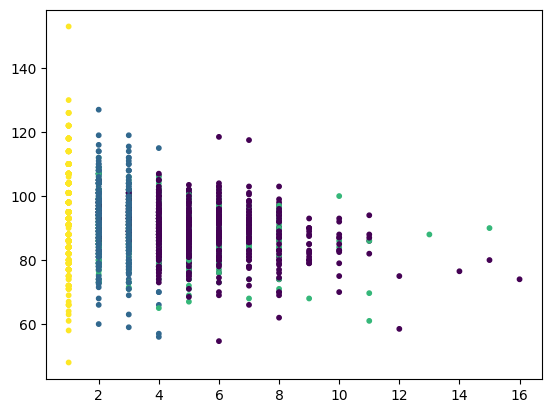

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.02859440381913206
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 69.0132064630297
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 5.086213049593762


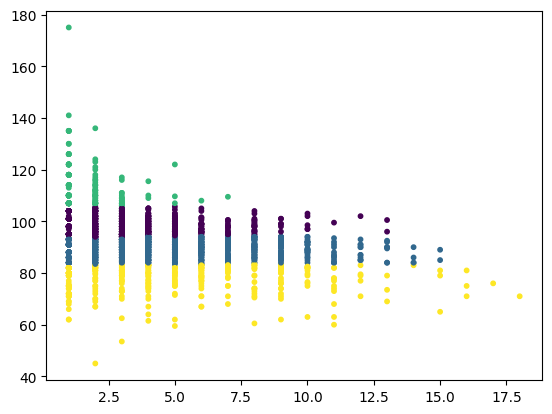

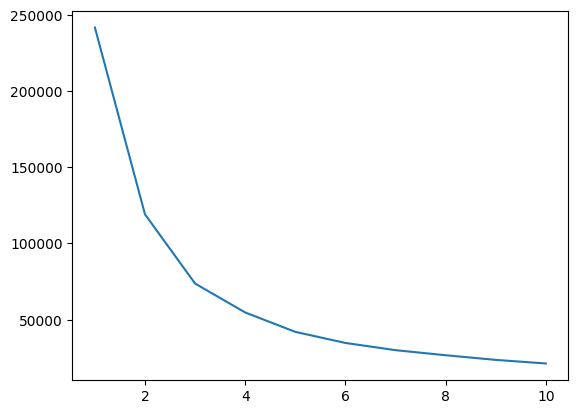

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3786325444173564
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2384.6245687467135
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.805712338286597


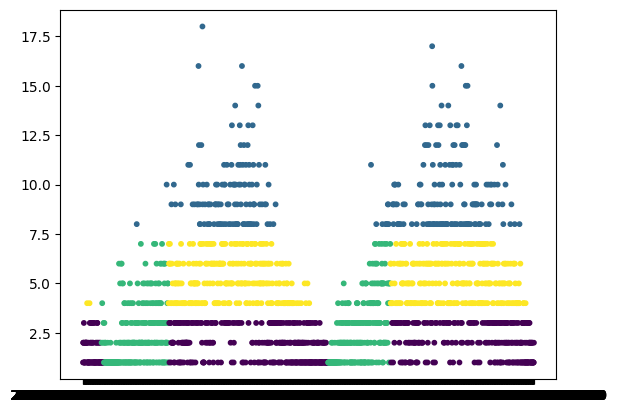

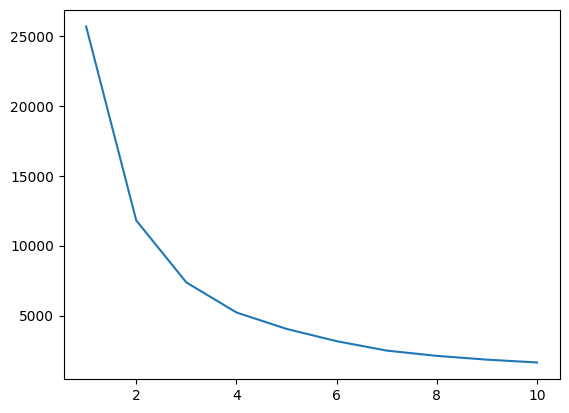

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4491843842418909
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3329.6851063425465
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.692791661518438


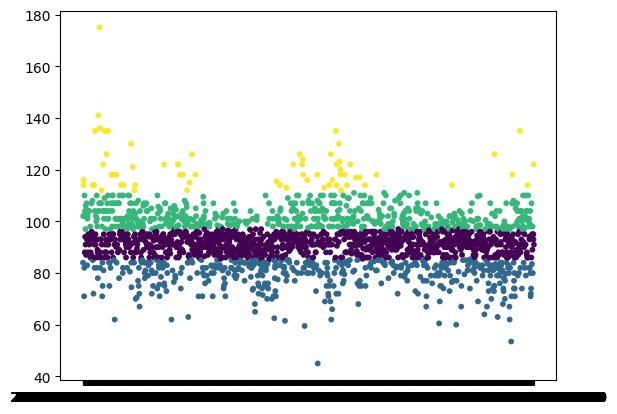

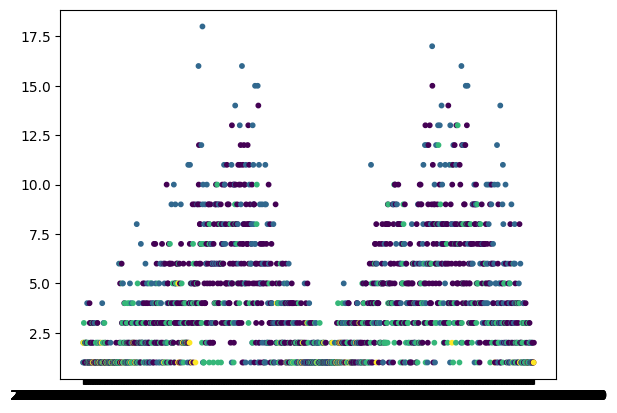

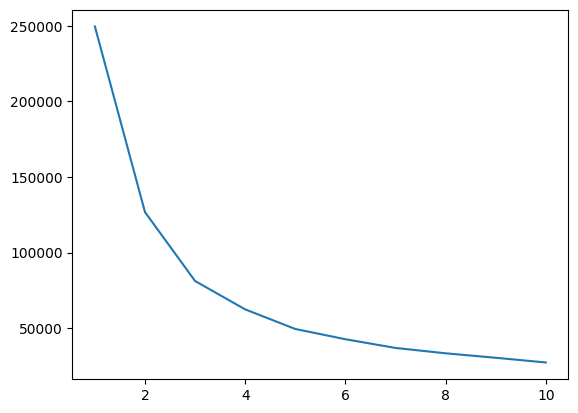

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.31682762292011607
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1860.849257332926
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.873233655991068


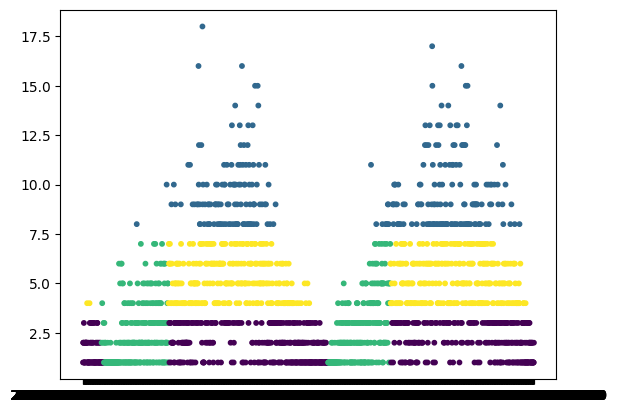

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4409468621447124
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2690.8920067526687
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7583820585587868


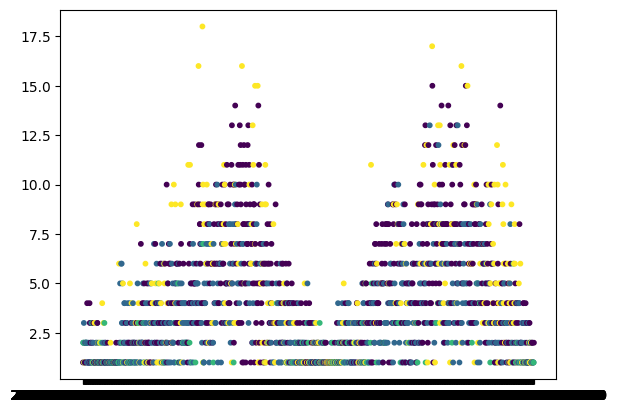

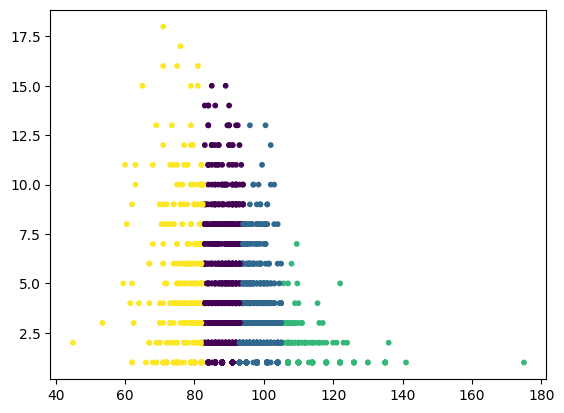

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3543505235522207
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2055.5575185832836
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8584076782756682


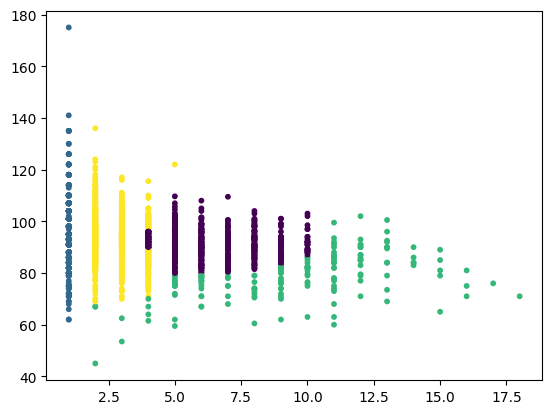

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.022170957059834375
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 200.48186092285908
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.82393841364381


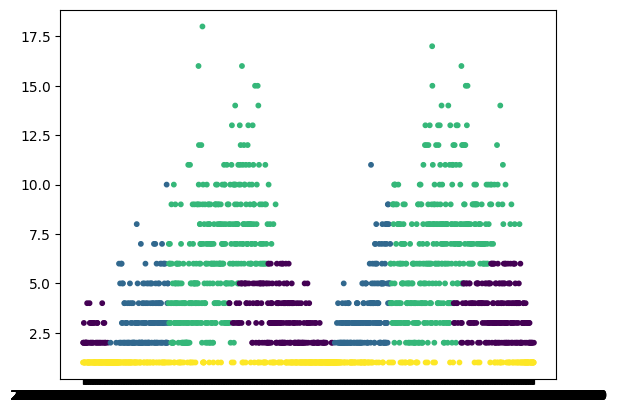

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.25816076041252384
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1067.3682517593609
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.9849201907769528


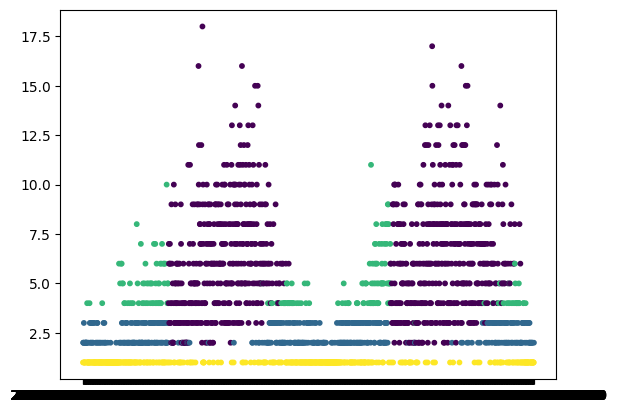

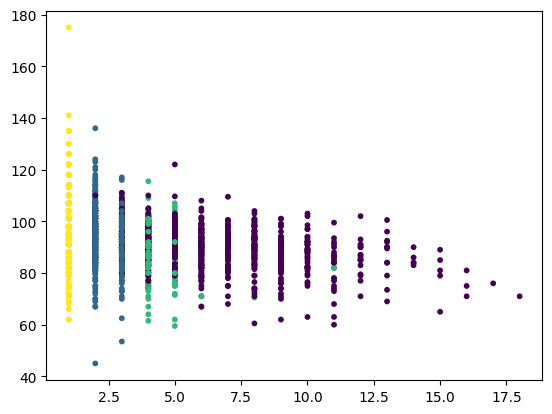

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.014057566622982109
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 87.87005693121935
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 4.886504813209672


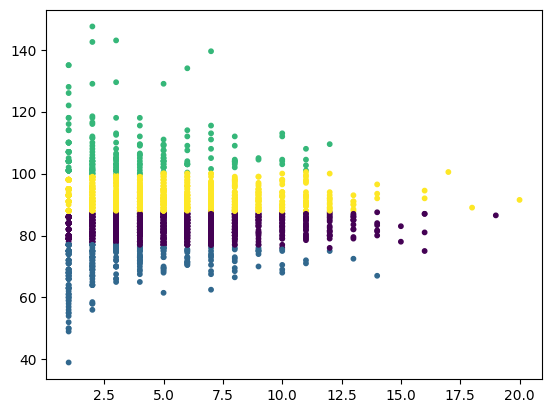

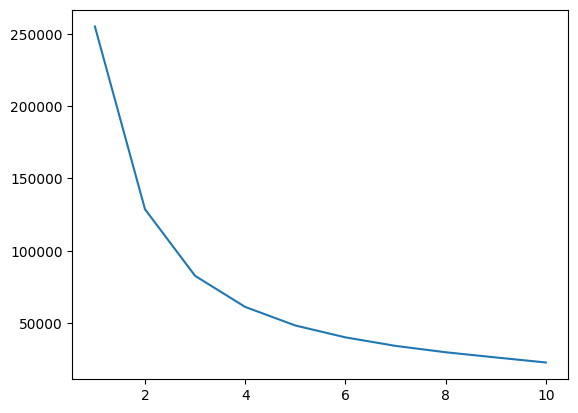

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.36090388603458967
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2474.7351458987855
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7792563461346577


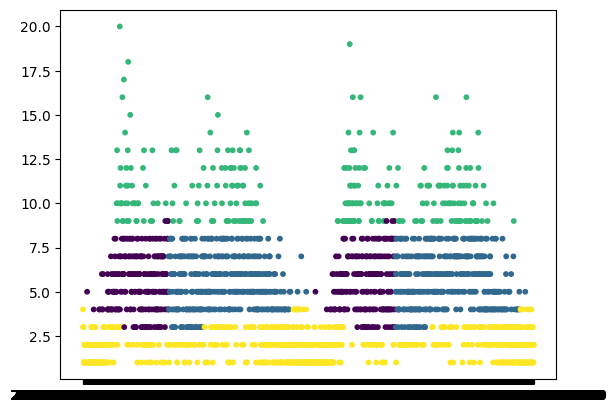

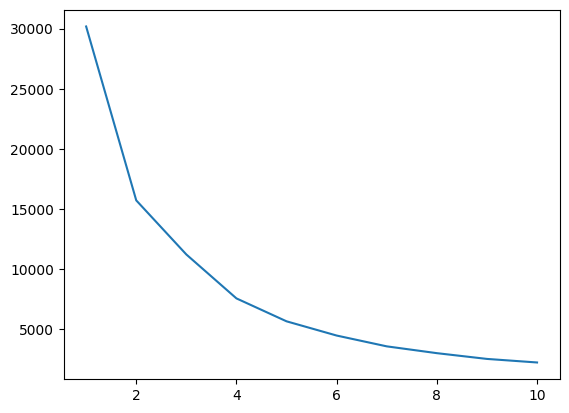

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4645917705979394
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3058.1010987352383
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.6868991442139889


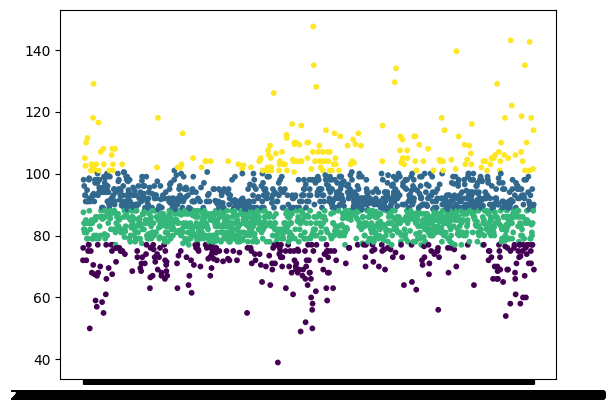

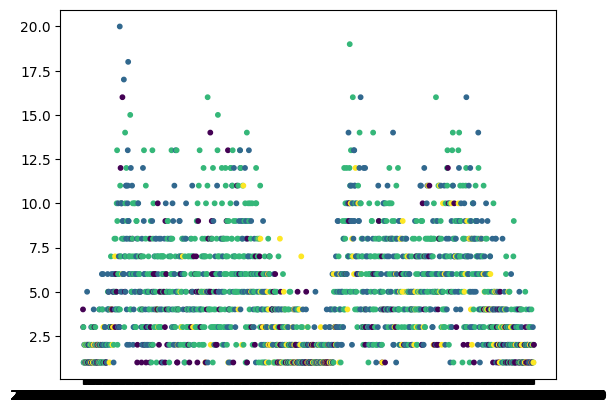

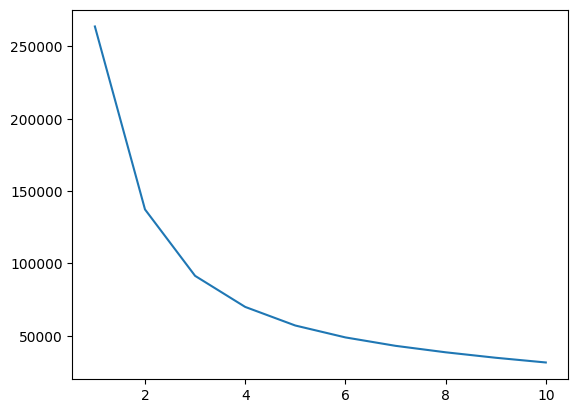

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2844886490682106
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1788.0343818302283
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9545959483820244


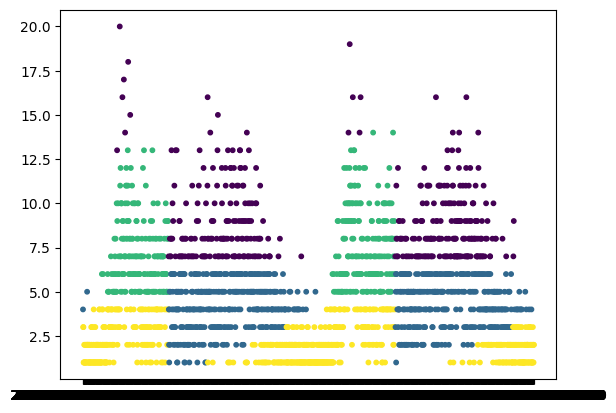

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.43594965864044066
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2068.3238430722017
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8257768652535471


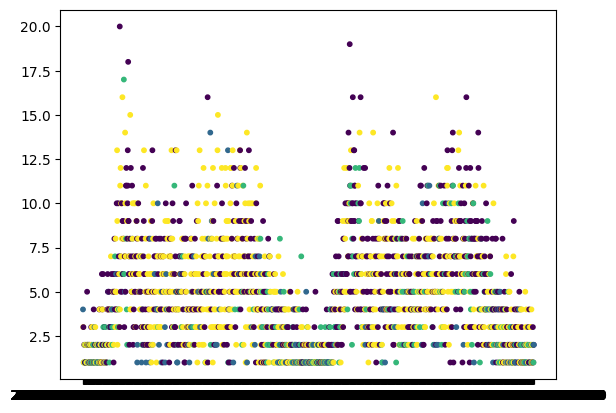

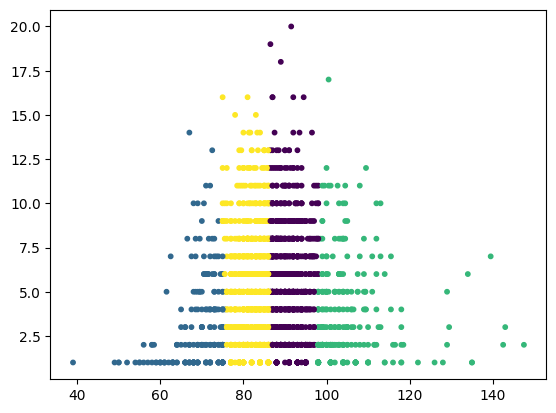

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3524897590790304
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2021.2628595517333
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8838456396272183


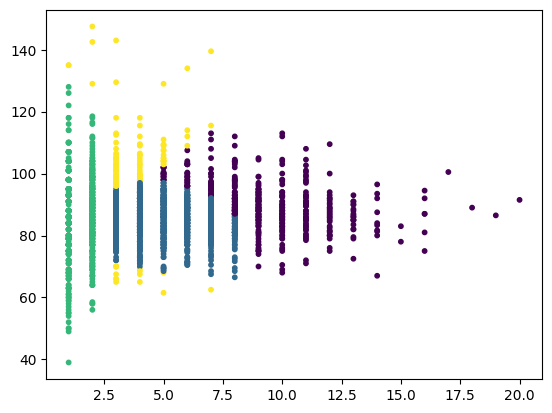

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.0858329904843766
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 176.73063469806857
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 2.8351241887181935


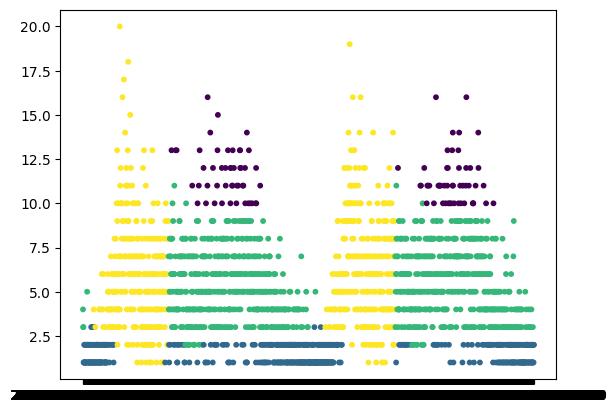

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.3637040346464641
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1302.7572588700777
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.7932351661720332


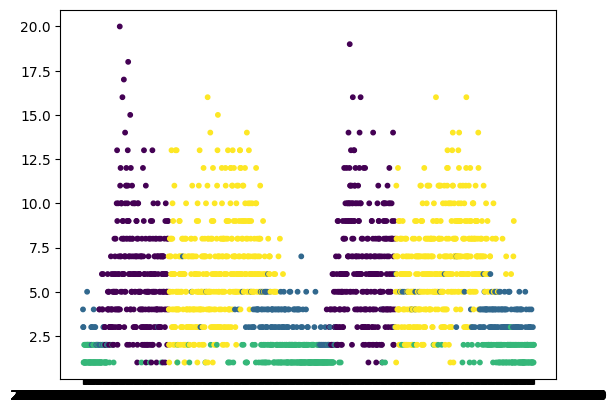

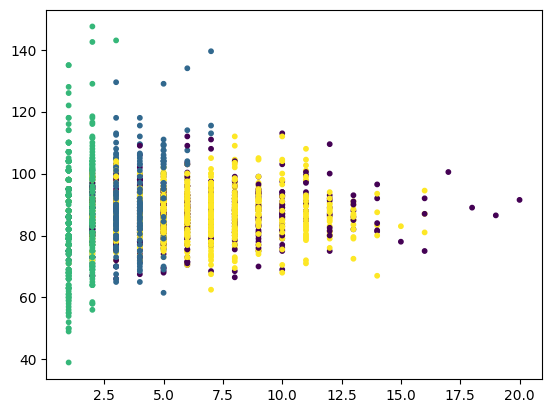

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.03771838160868398
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 55.96365650968699
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 4.618404340457399


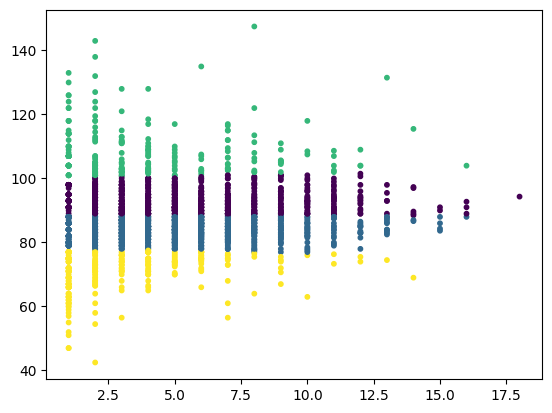

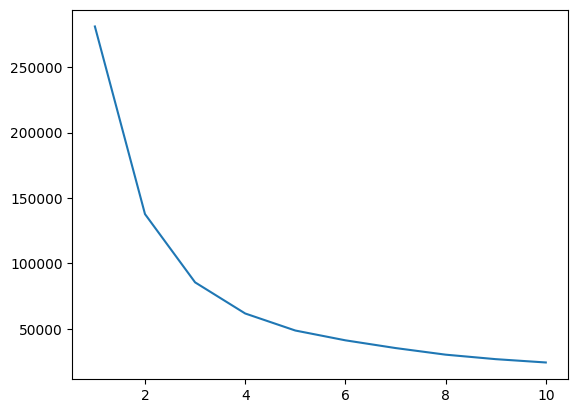

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3545181231306661
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2586.1235334990147
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.8037188472448854


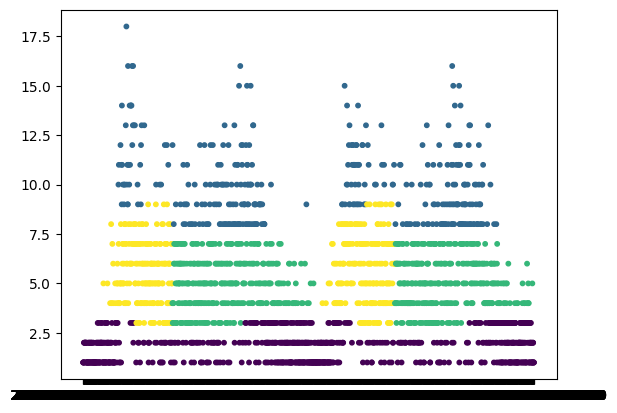

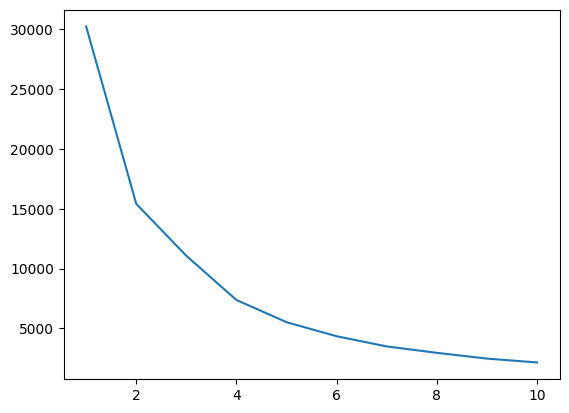

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.45636256283488663
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3198.847738544377
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7116791500377185


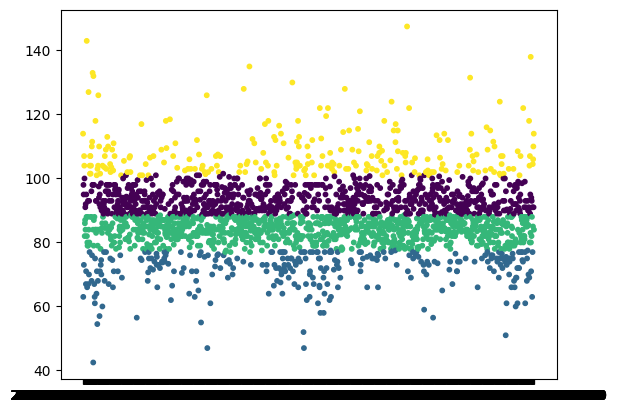

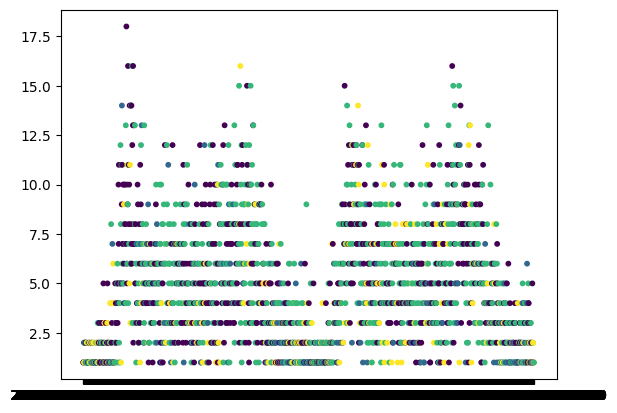

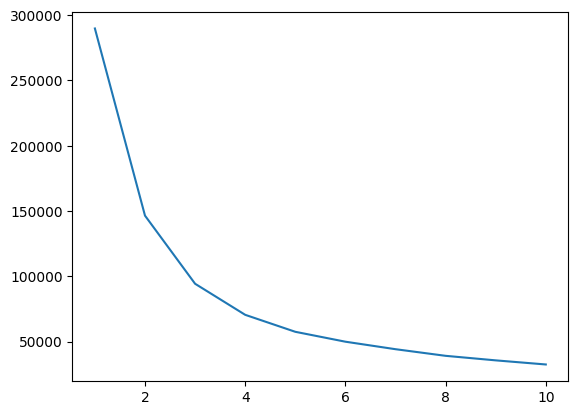

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2869017681305994
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1942.1289819415822
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.970645868150456


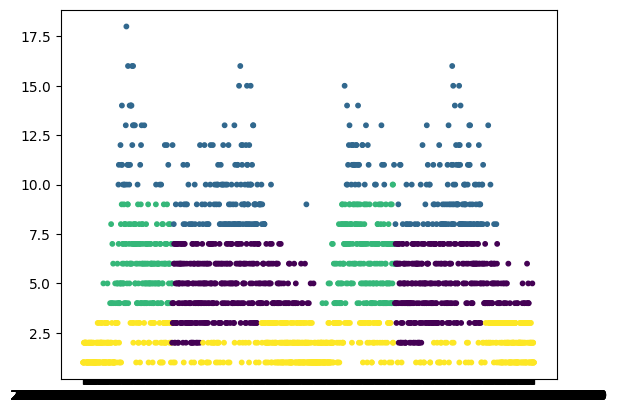

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.44667335215533
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2286.3332050370705
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7433167299853579


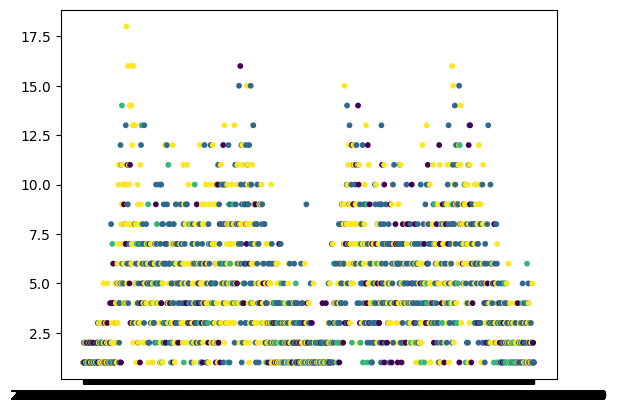

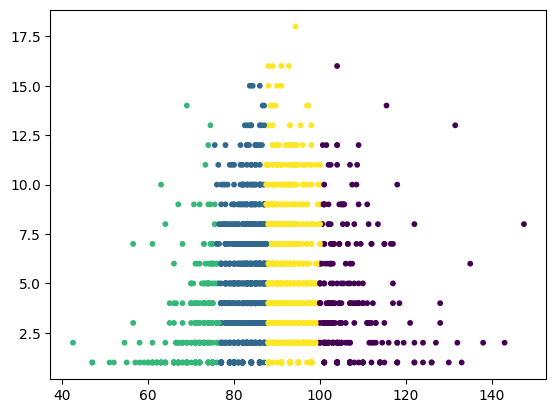

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3572980370034998
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2267.1677342757407
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8649795206960751


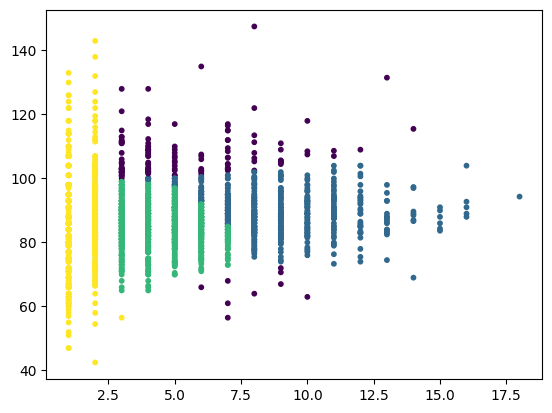

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.04511556791593639
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 220.4832563099985
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 2.9530586036246125


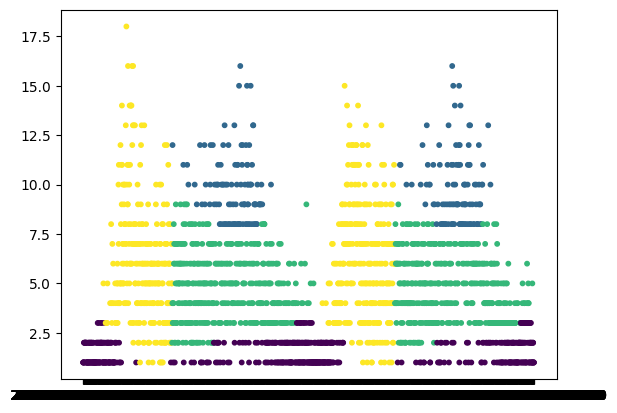

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.37193267790287815
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1535.617007637612
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.7958567558997041


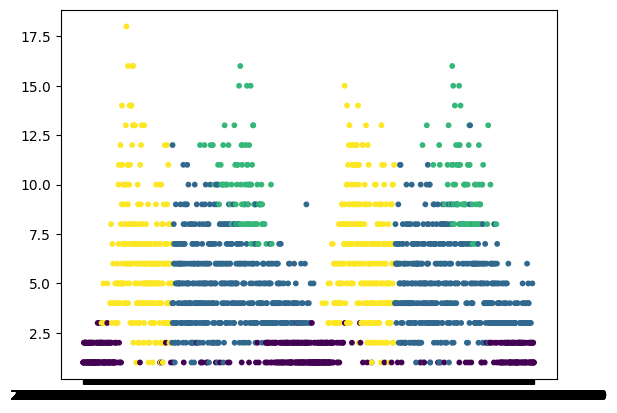

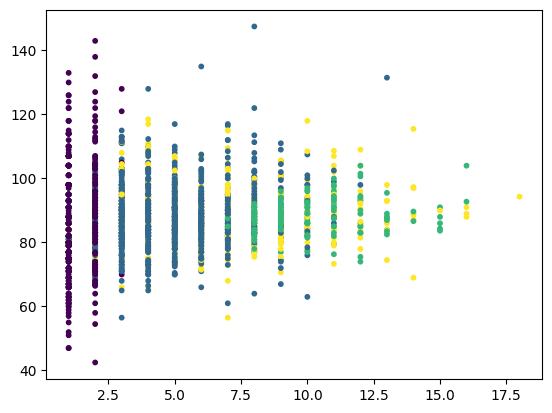

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.03130068516857332
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 53.58213292753171
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 3.8997400747291033


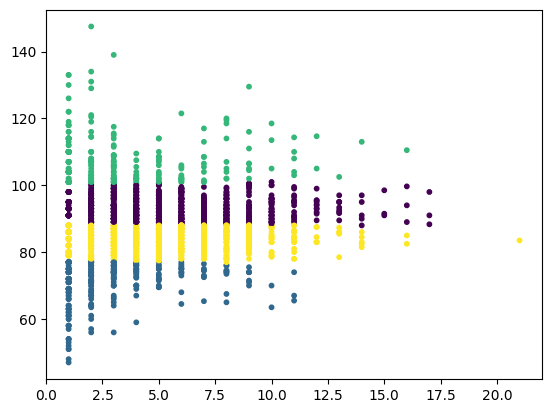

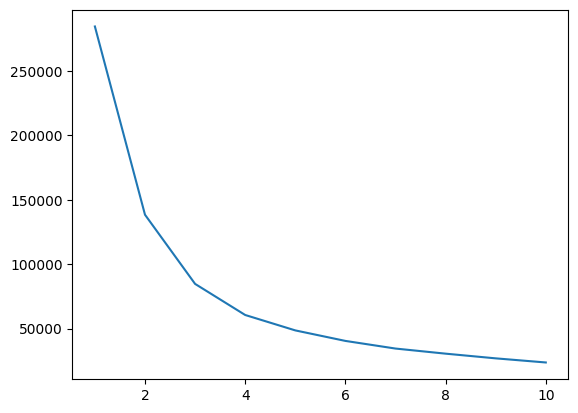

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.35717216482268316
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2733.8187148064567
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.8141685804735719


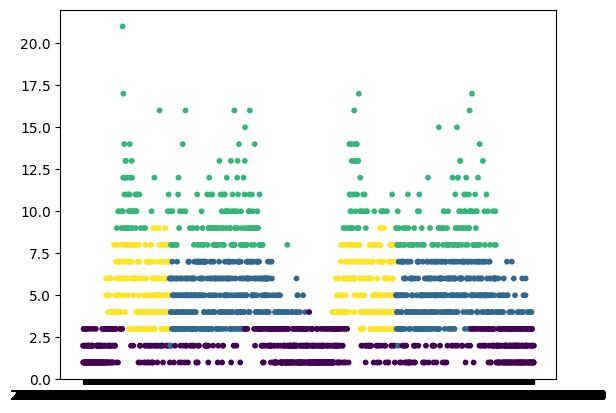

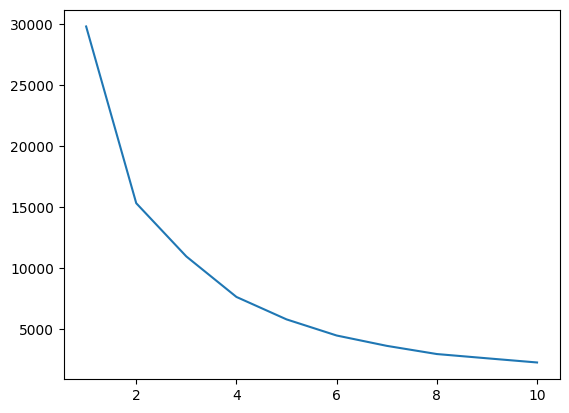

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4372342381847187
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 2994.530774259365
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7361801232746809


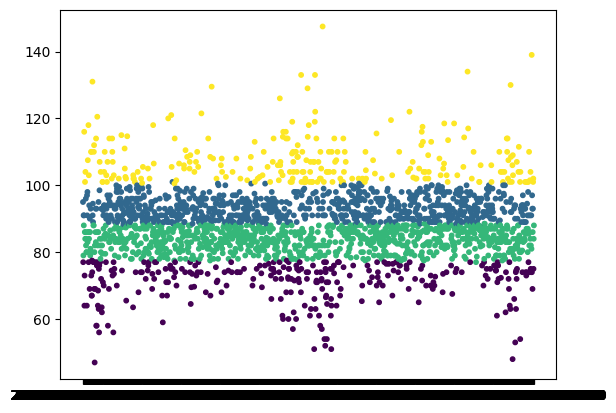

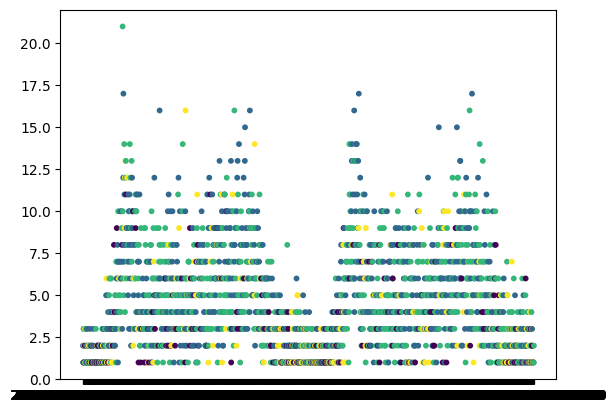

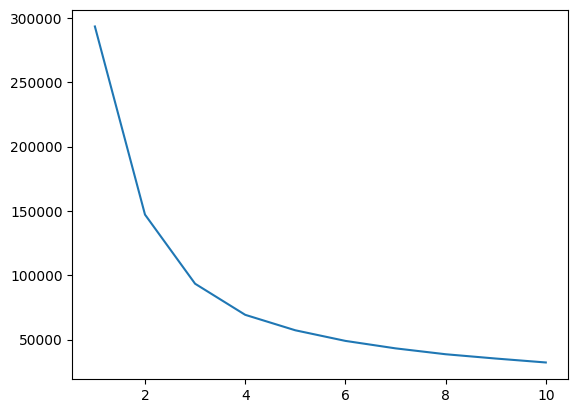

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2875946264555234
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 2009.5360126241815
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9613724384702602


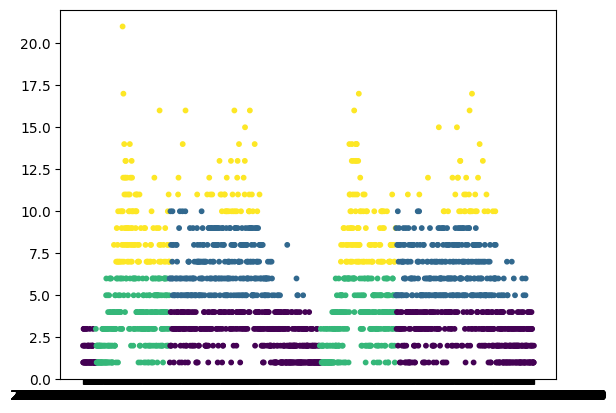

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.42600605505023525
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2066.2180901162837
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.903065010961912


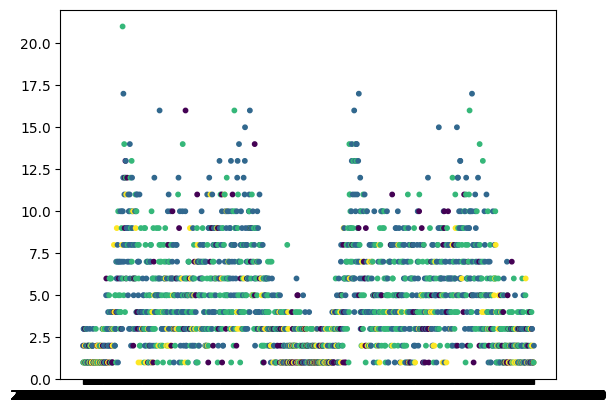

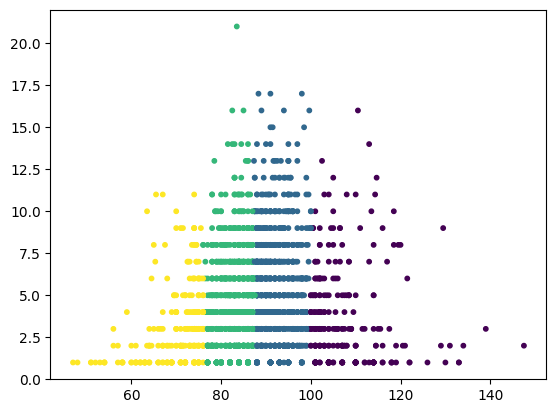

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.36393398370913305
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2399.813286360802
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8507432981427335


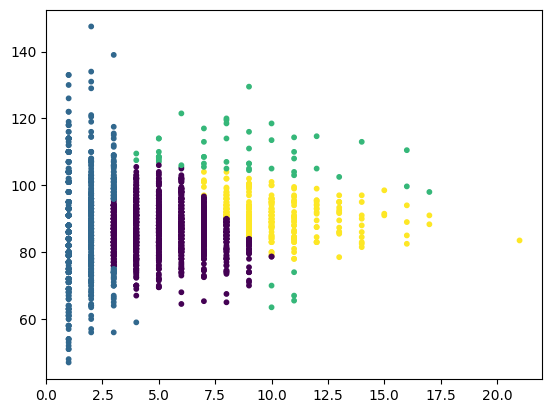

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.018093156663020693
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 112.5785836032789
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.1050537522317354


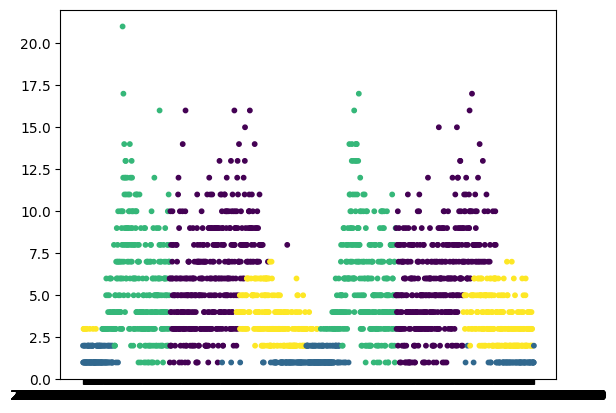

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.20798611447516513
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 821.533889866084
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.1102661007856331


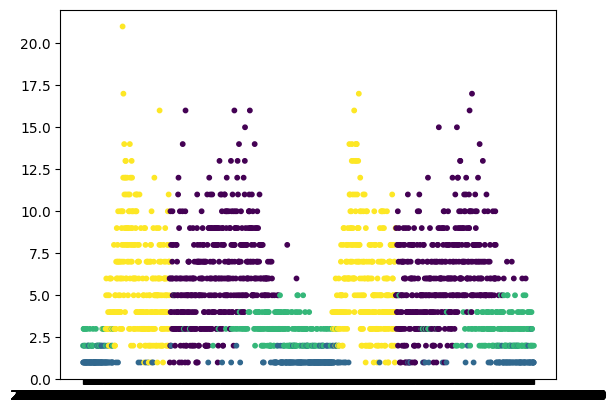

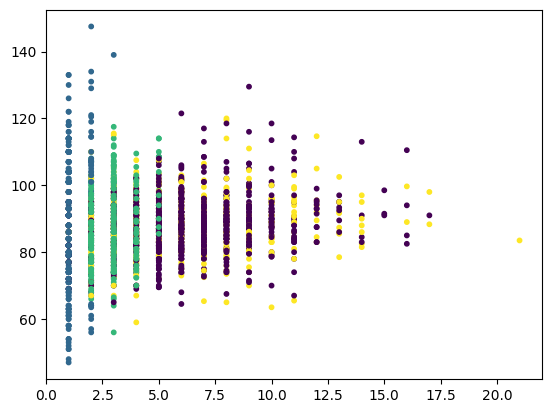

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.02969313548592989
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 45.506900208872125
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 6.698937742280017


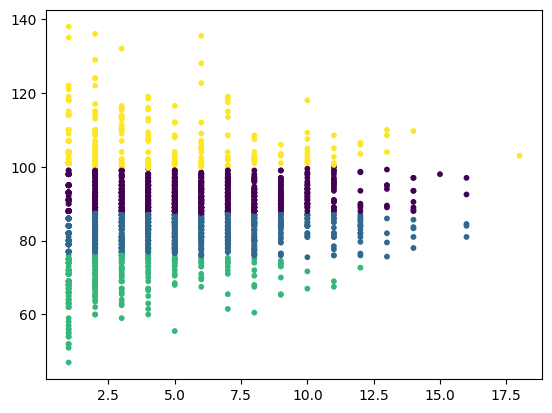

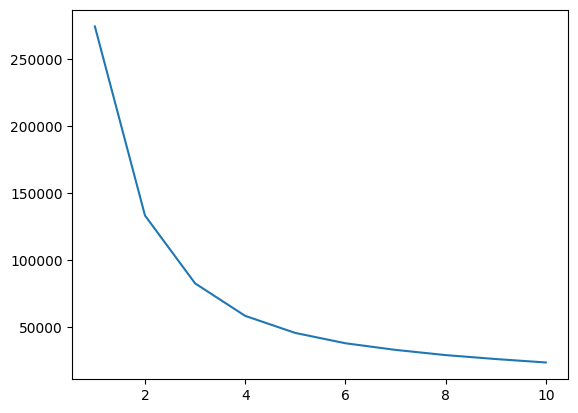

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3451106162384784
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2634.82323568434
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.8373835704967553


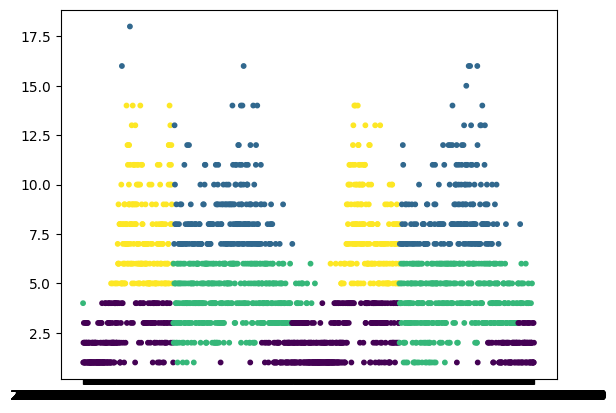

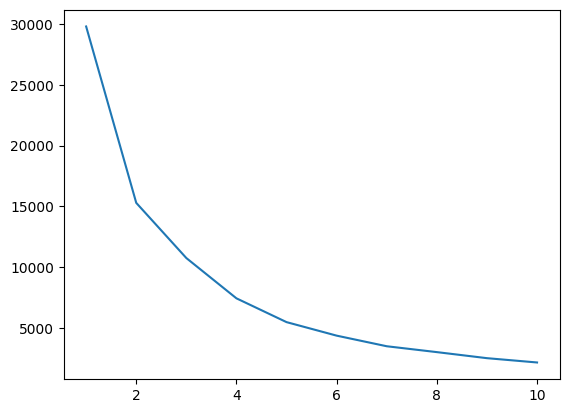

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4560081371529898
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3145.0797403639235
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.698420805075608


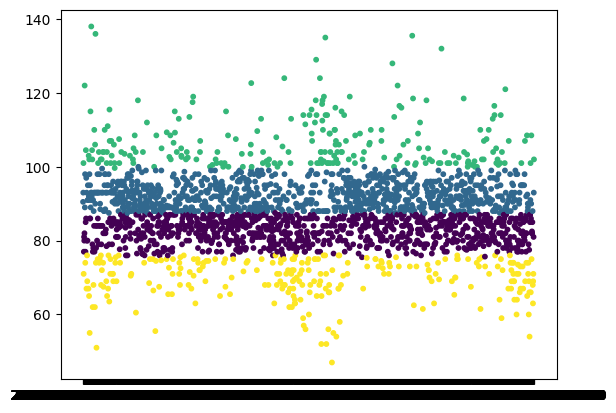

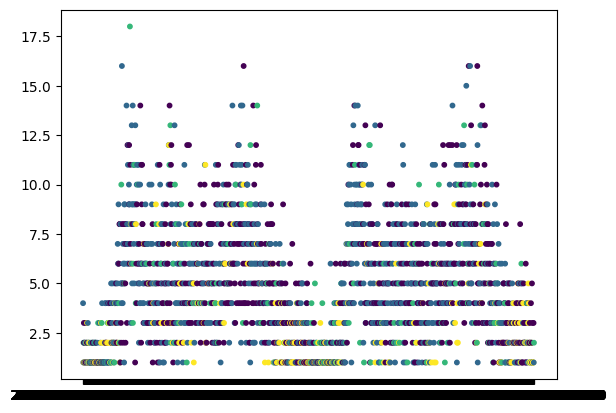

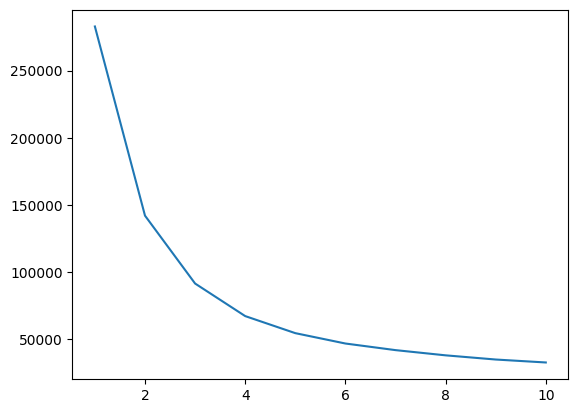

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2718600855174882
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1911.1496554829525
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 1.0942717675869909


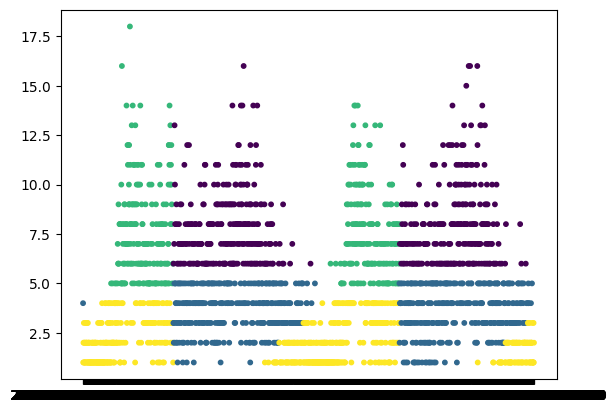

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4256777294675201
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2180.489437805203
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8442403156786777


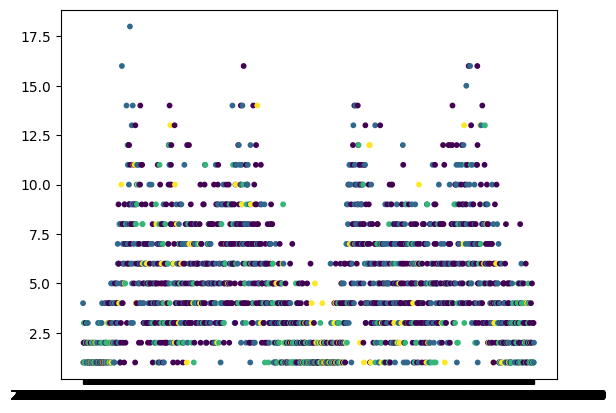

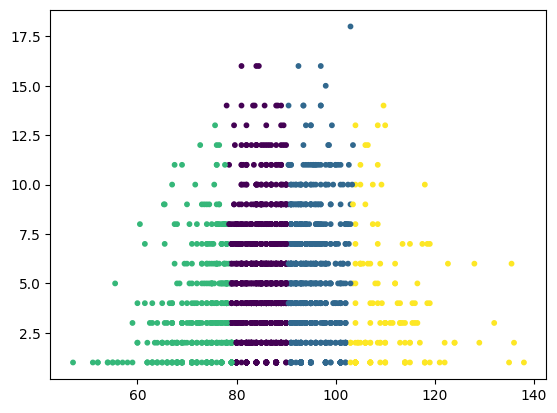

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.36386674612309766
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2356.8600654498773
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.8458452608609479


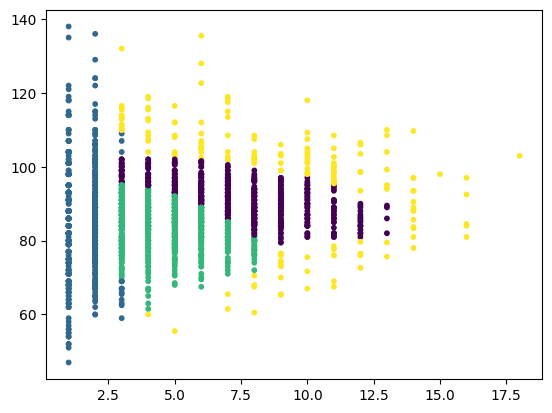

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.056077676126660196
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 187.0680730556006
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.574618261070712


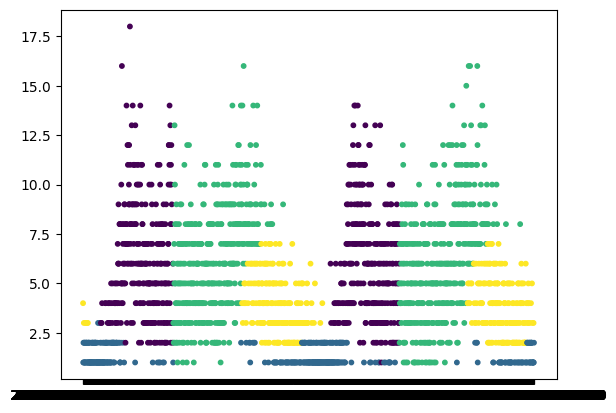

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.2313138517949354
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 957.7127847185511
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 1.1110321127822296


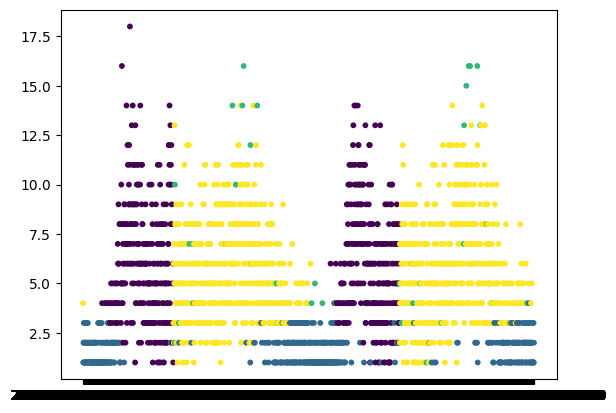

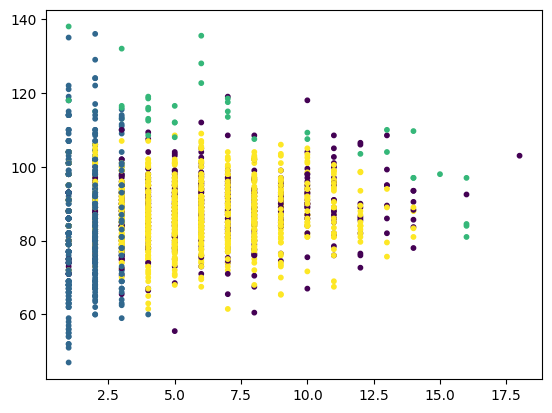

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.043694451598210095
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 123.40331573739215
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 2.9130275833333203


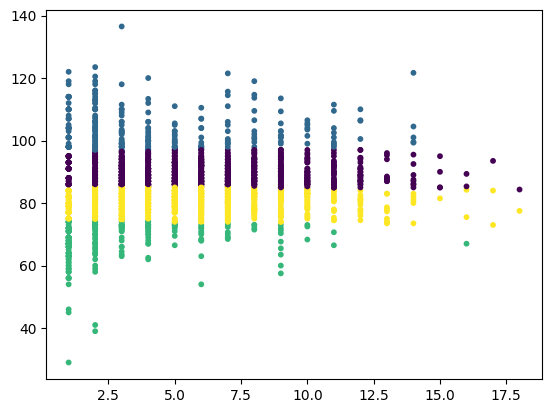

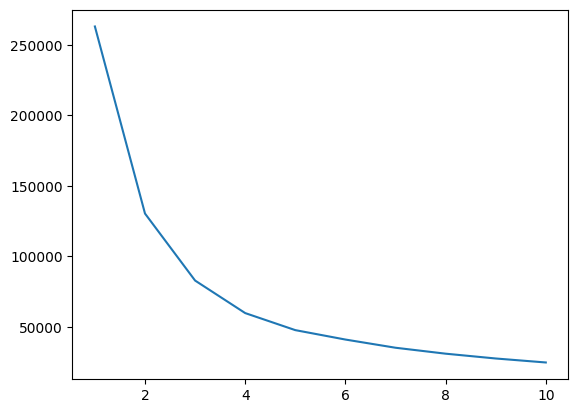

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.35162709981124074
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 2432.604944353469
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7822249711213949


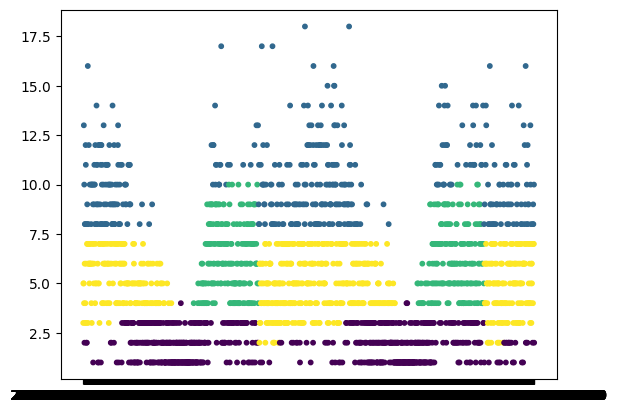

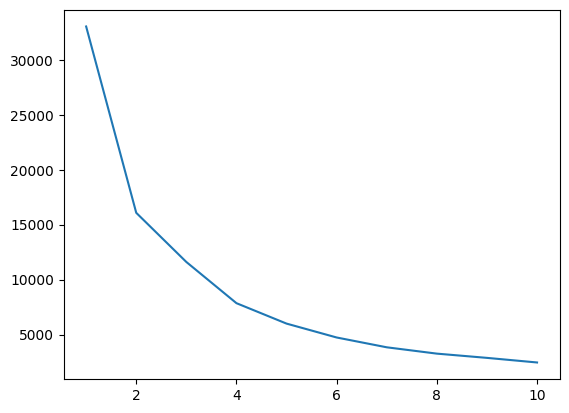

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.44517148808590423
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3143.441421804121
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7379298100235292


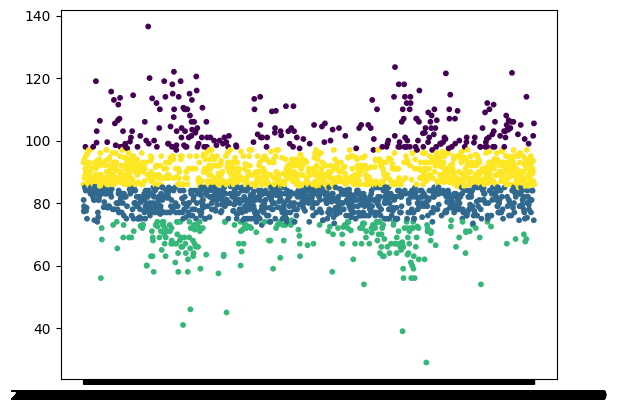

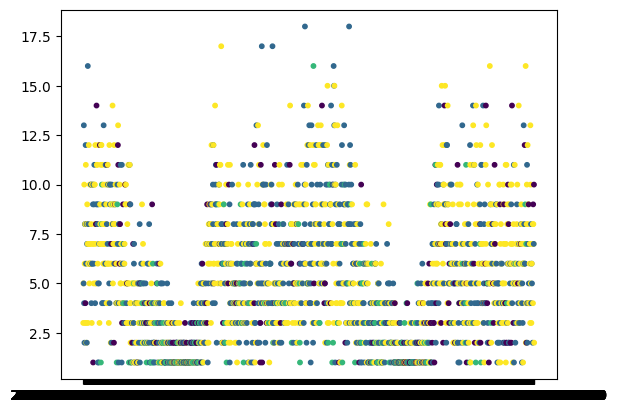

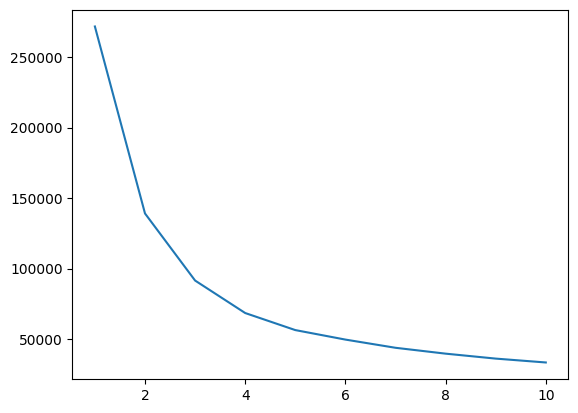

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.28209116029231807
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 1802.1382392779483
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9384042784524311


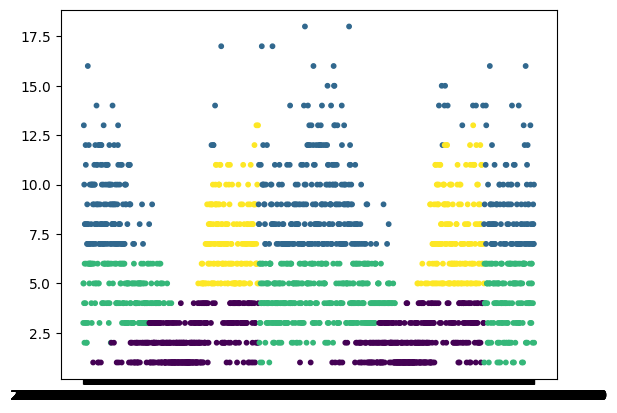

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4370749180832054
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2335.242225317106
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8049242071566802


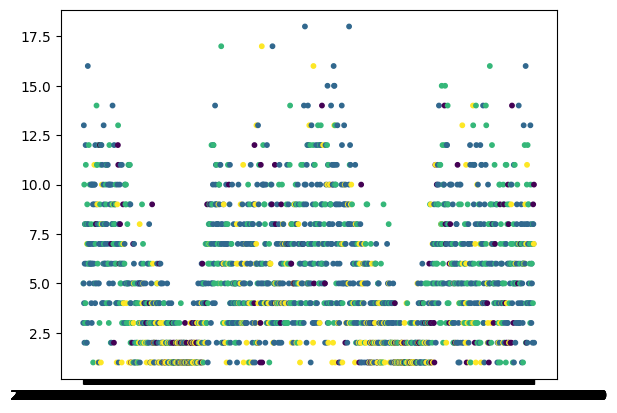

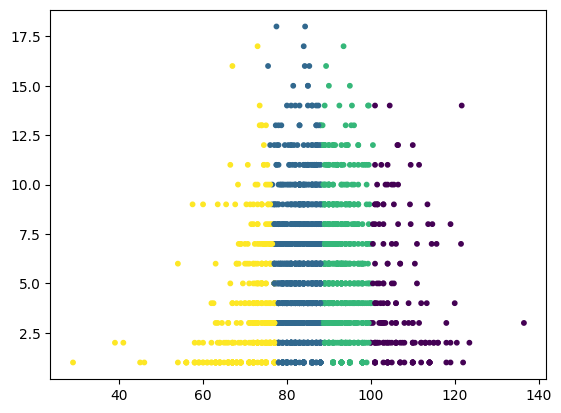

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.34822198834510243
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2197.297231724613
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.87834298896116


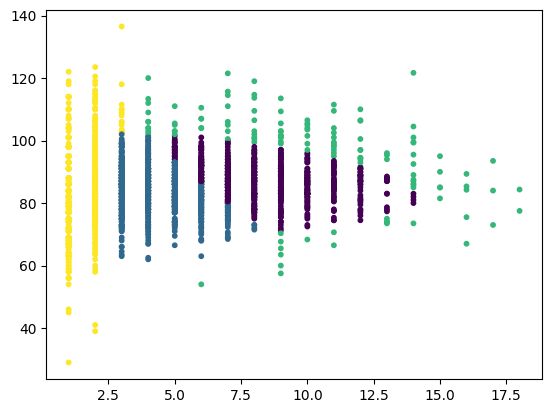

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.03932180779850375
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 136.36470120518987
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.8796009979273363


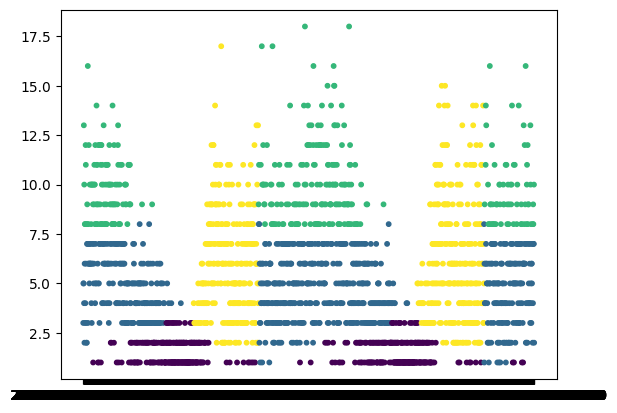

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.391322180530202
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1843.6449952104606
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.799465922530639


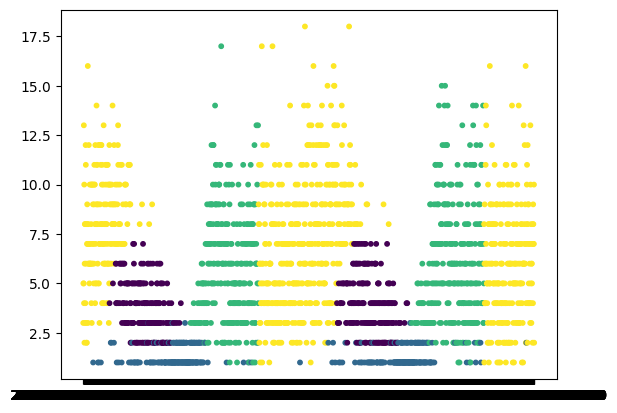

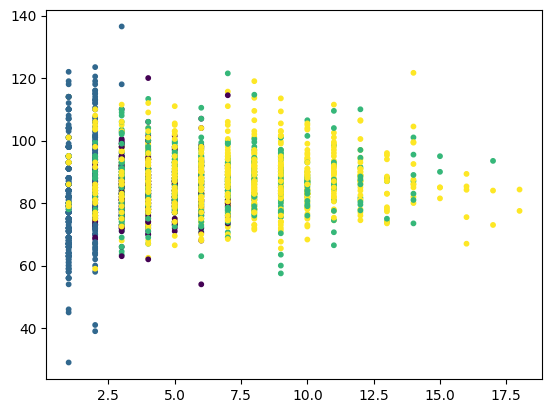

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.006400371182668808
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 65.08287017720848
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 5.234489565907884


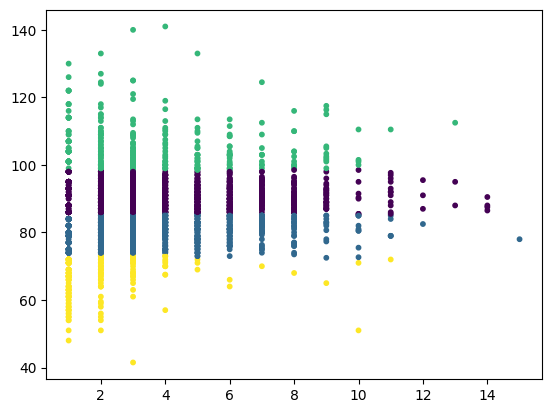

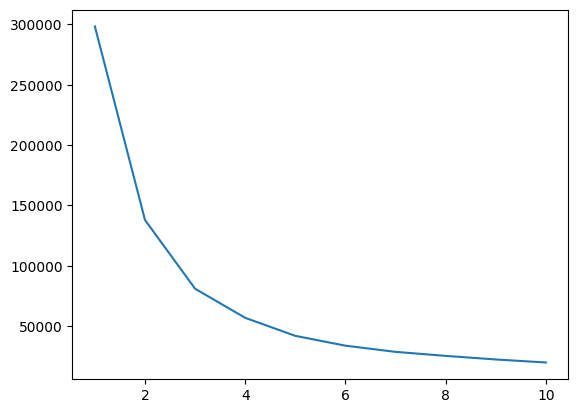

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.36708231164480365
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 3599.8195250322638
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.7916196005202875


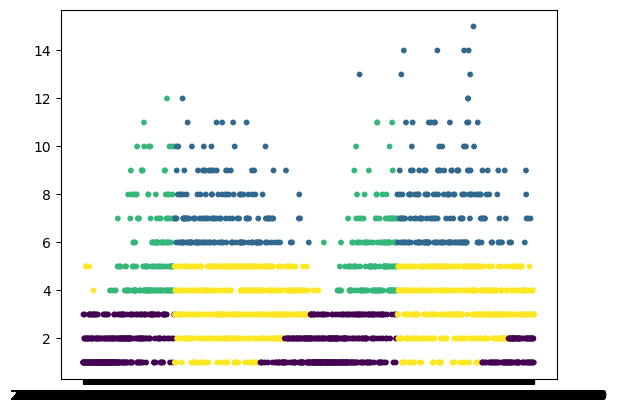

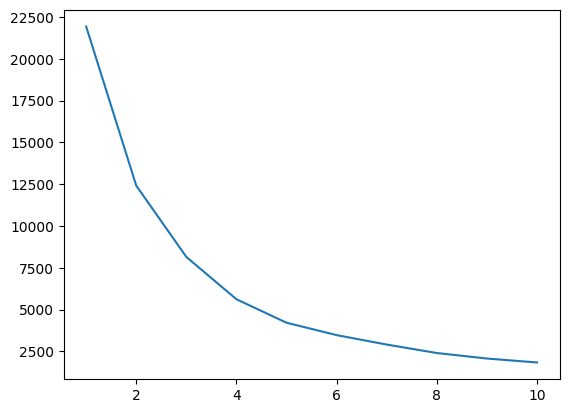

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.4327807137720932
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 2793.678101674025
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7350035927098836


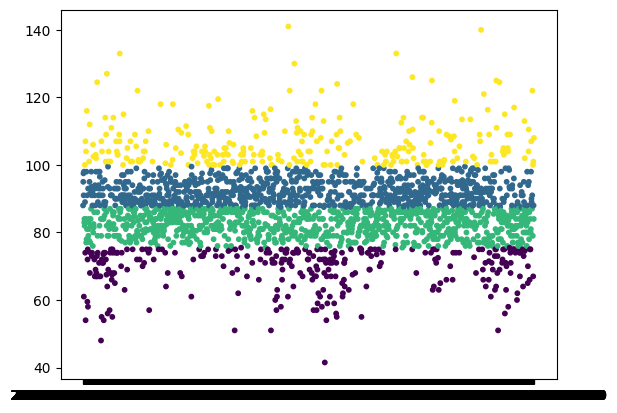

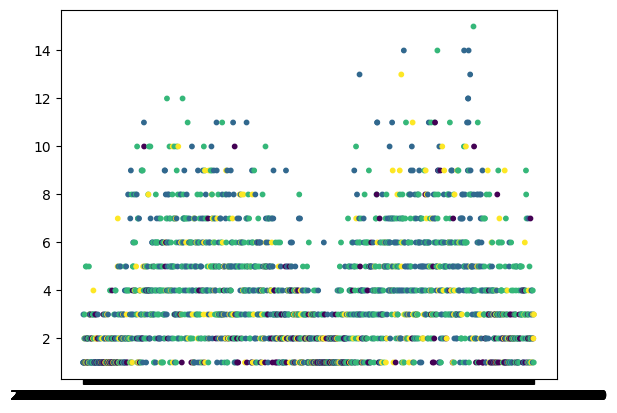

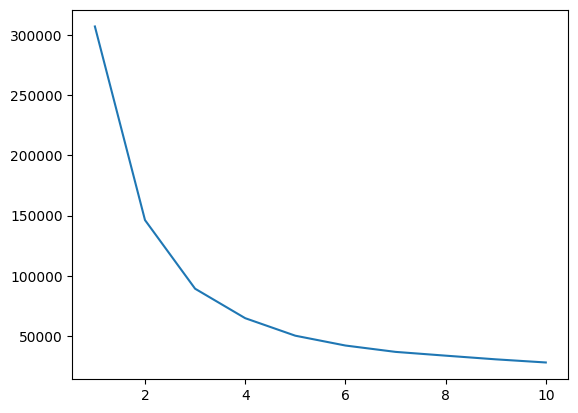

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.2917938819712896
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 2527.5681808837926
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.9426922898972692


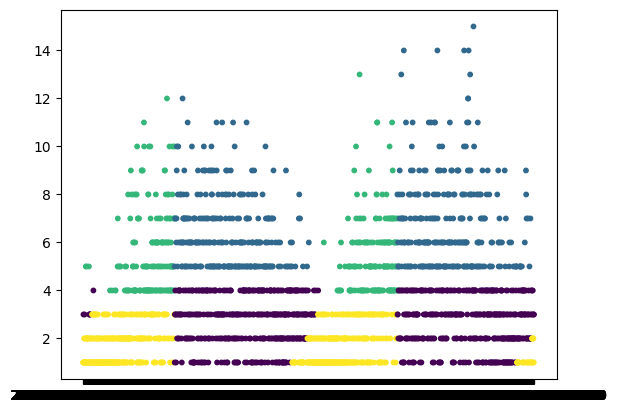

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.42749054611049164
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2218.59045863718
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.7586798444273544


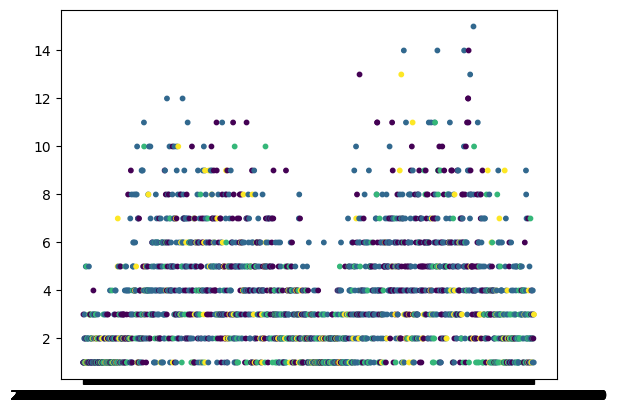

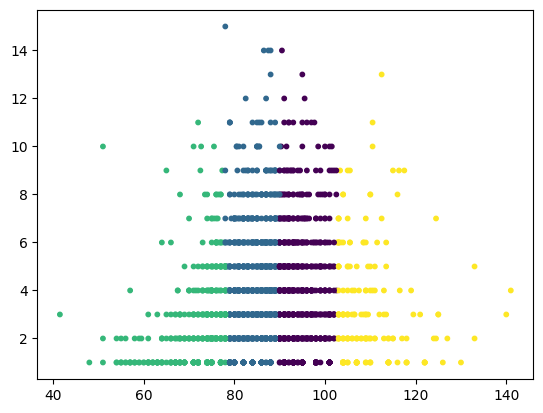

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3791313832321658
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2794.707060035479
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.7952452247718466


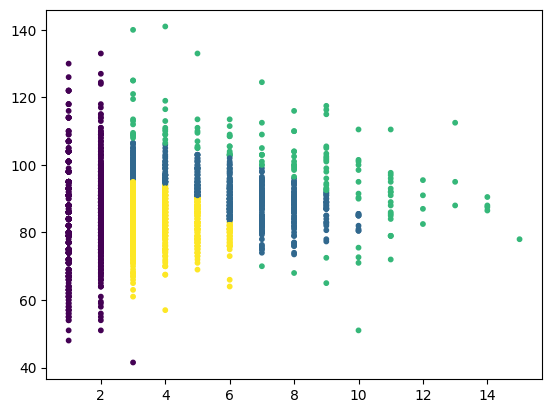

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : -0.017436082130590138
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 181.92673170786398
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 3.4637692219164116


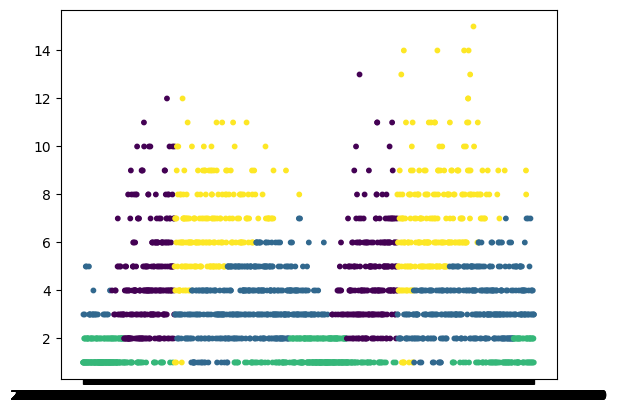

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.35749341731138
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1674.8795413358125
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8406604647624035


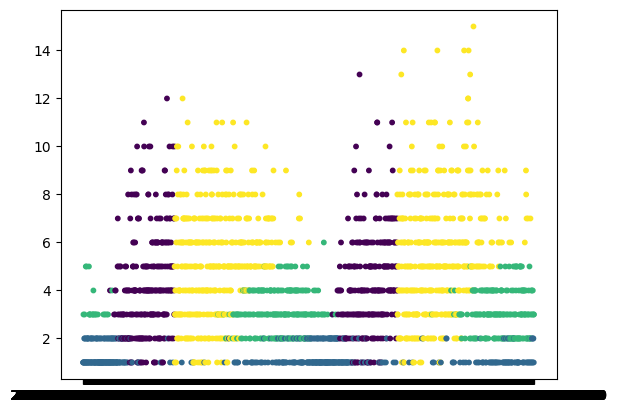

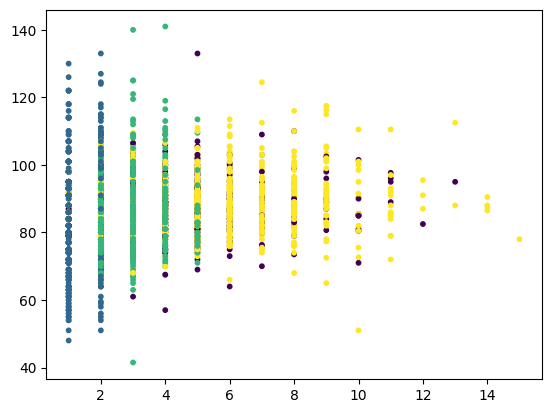

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : 0.0047488202549517775
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 45.00130186022778
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 6.701992141567365


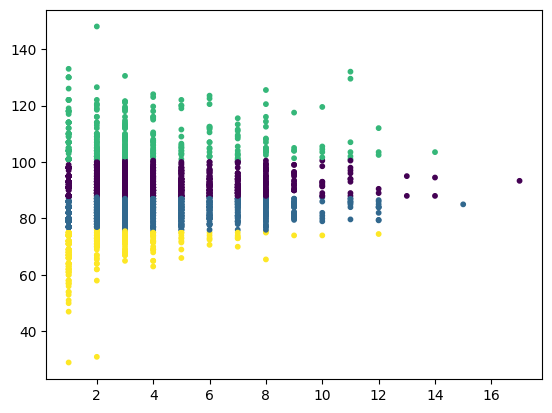

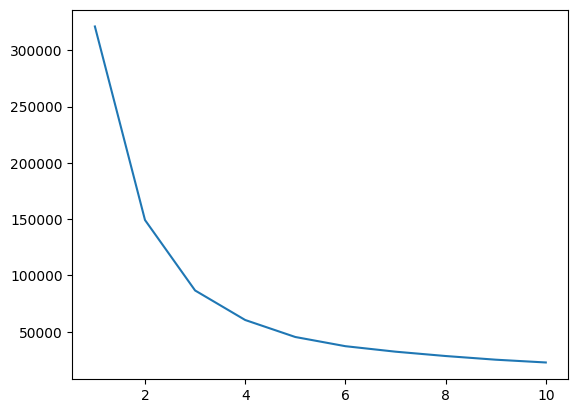

The average silhouette score for the flux_and_velocity dataset (K-Means) is : 0.3751775631129973
The Calinski-Harabaz Index for the flux_and_velocity dataset (K-Means) is : 3327.926123125212
The Davies-Bouldin Index for the flux_and_velocity dataset (K-Means) is : 0.8337896643641851


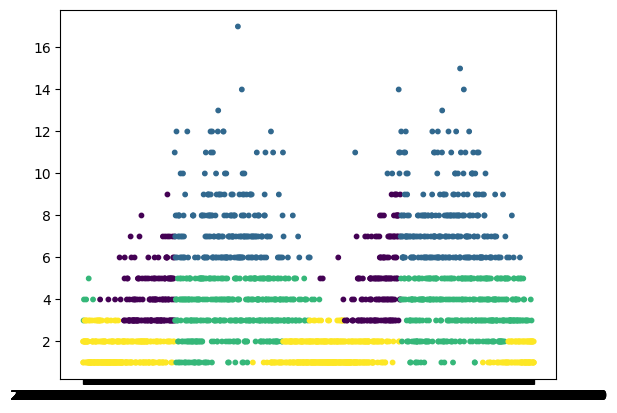

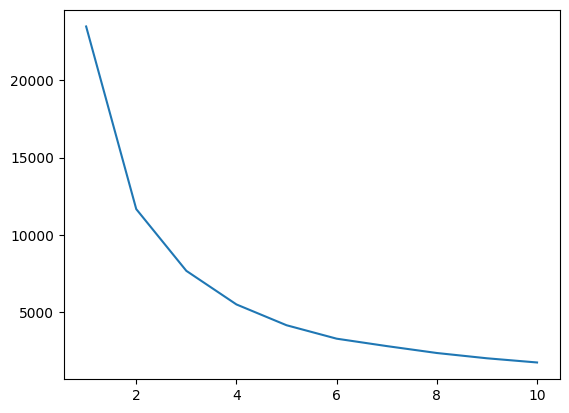

The average silhouette score for the time_and_flux dataset (K-Means) is : 0.44696659287759805
The Calinski-Harabaz Index for the time_and_flux dataset (K-Means) is : 3160.323572333075
The Davies-Bouldin Index for the time_and_flux dataset (K-Means) is : 0.7118941558033668


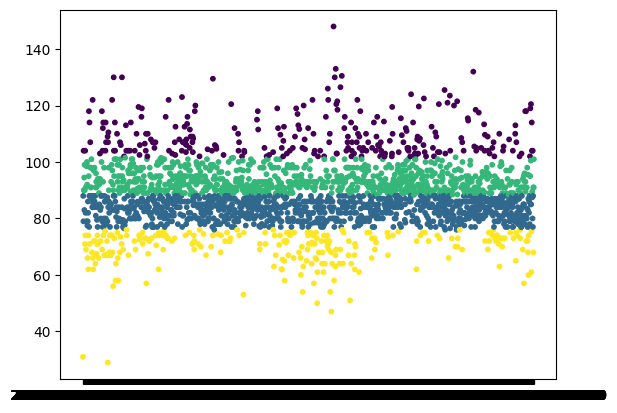

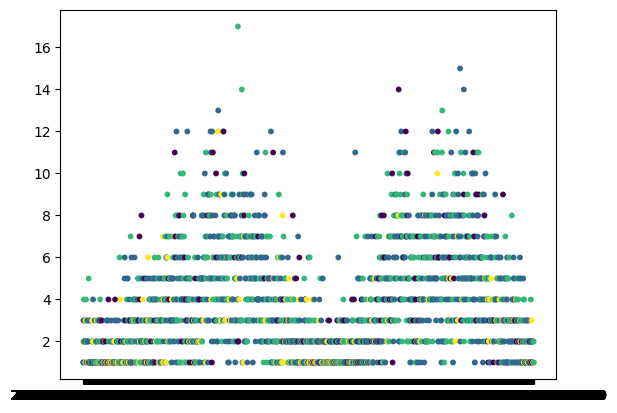

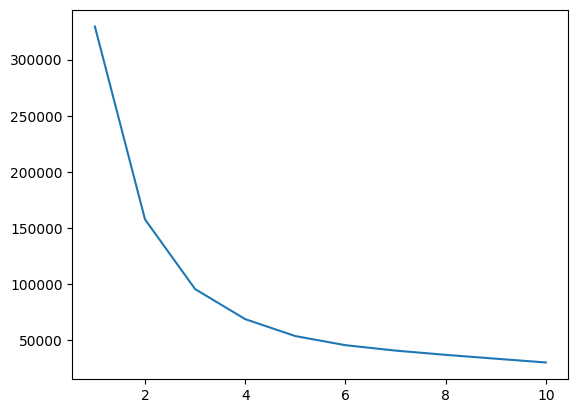

The average silhouette score for the time_flux_and_velocity (K-Means) dataset is : 0.3115070054019747
The Calinski-Harabaz Index for the time_flux_and_velocity (K-Means) dataset is : 2520.176699613647
The Davies-Bouldin Index for the time_flux_and_velocity (K-Means) dataset is : 0.950795765405618


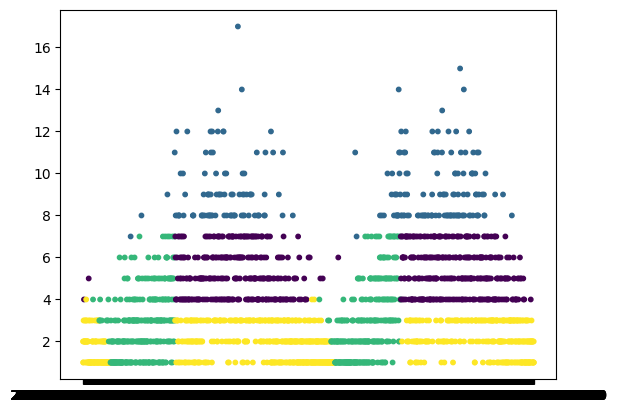

The average silhouette score for the time_and_flux dataset (Timeseries K-Means) is : 0.4081420124745731
The Calinski-Harabaz Index for the time_and_flux dataset (Timeseries K-Means) is : 2261.0239639650626
The Davies-Bouldin Index for the time_and_flux dataset (Timeseries K-Means) is : 0.8482751732350349


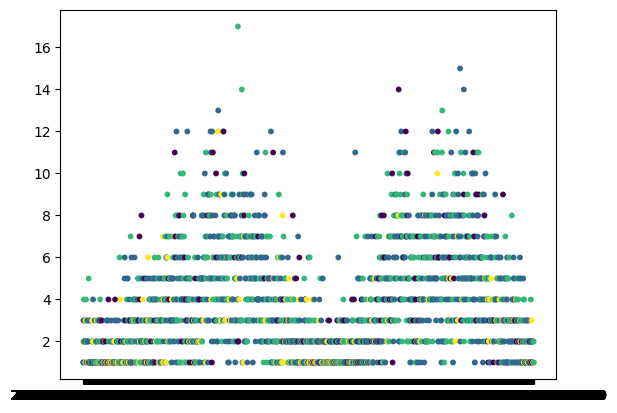

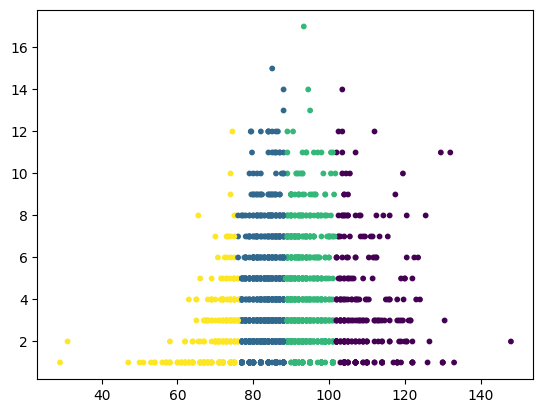

The average silhouette score for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.3966425417215387
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 2893.8876040065884
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Timeseries K-Means) is : 0.7735238582547703


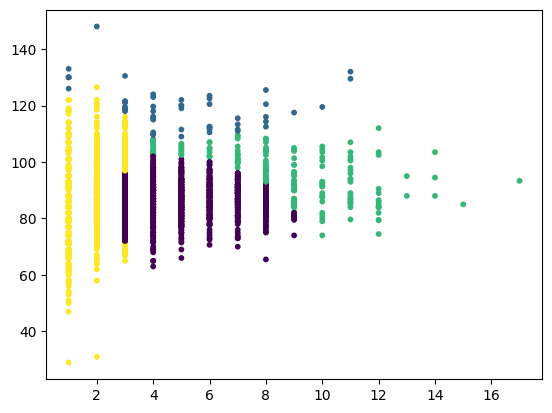

The average silhouette score for the flux_and_velocity dataset (Gaussian Mixture) is : 0.03720741047212642
The Calinski-Harabaz Index for the flux_and_velocity dataset (Gaussian Mixture) is : 242.0014602210885
The Davies-Bouldin Index for the flux_and_velocity dataset (Gaussian Mixture) is : 2.813051609427305


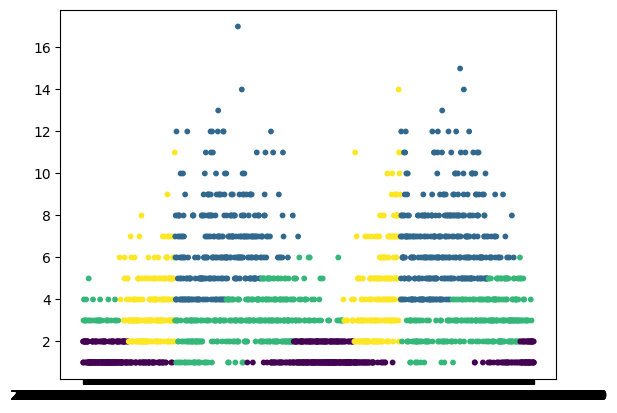

The average silhouette score for the time_and_flux dataset (Gaussian Mixture) is : 0.36875435947221713
The Calinski-Harabaz Index for the time_and_flux dataset (Gaussian Mixture) is : 1904.1300923966144
The Davies-Bouldin Index for the time_and_flux dataset (Gaussian Mixture) is : 0.8262917472051376


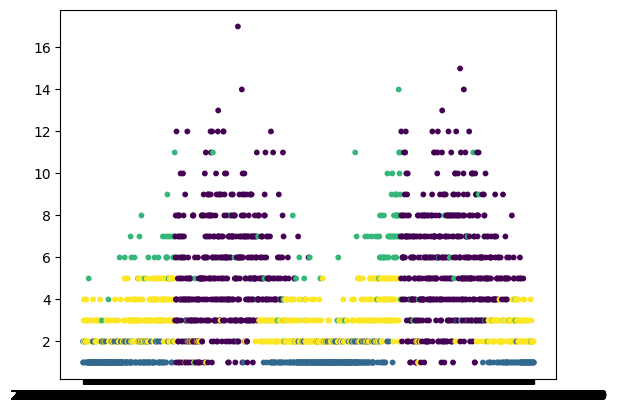

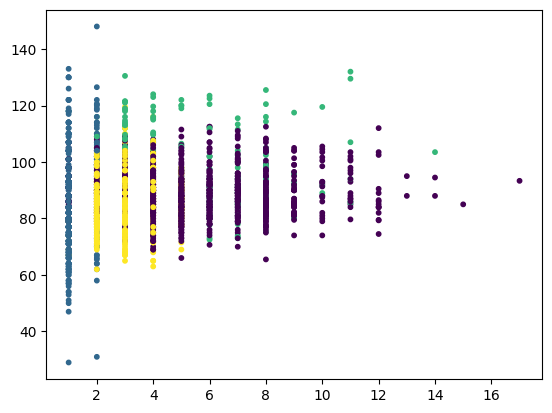

The average silhouette score for the time_flux_and_velocity dataset (Gaussian Mixture) is : -0.008661857143279989
The Calinski-Harabaz Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 97.69891752376493
The Davies-Bouldin Index for the time_flux_and_velocity dataset (Gaussian Mixture) is : 6.454243452440776


In [18]:
days = ['Monday', 'Tuesday', 'Wednesday', 'Thursday', 'Friday', 'Saturday', 'Sunday']

for sensor in sensors_weekday:
    for i in range(0,7):
        
        value = sensor['SensorCCVId'][0]
        filename = '../docs/model_performances/notebook/weekday_models/'+str(value)+'_'+days[i]+'_results.csv'

        weekday_models(i, sensor, filename)

- As good practice calls, we now close the file stream.

In [19]:
file.close()

- Now to save the best models, for each sensor.

In [26]:
import pickle

# Sensor 10000028
time_and_flux = sensors[0][['Timestamp', 'Fluxo']]
gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_and_flux)

with open("../final_sensor_models/10000028.pkl", 'wb') as file:
    pickle.dump(gmm, file)

# Sensor 10000029
time_and_flux = sensors[1][['Timestamp', 'Fluxo']]
gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_and_flux)

with open("../final_sensor_models/10000029.pkl", 'wb') as file:
    pickle.dump(gmm, file)


# Sensor 10010172
time_flux_and_velocity = sensors[2][['Timestamp', 'Fluxo', 'Velocidade']]
gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_flux_and_velocity)

with open("../final_sensor_models/10010172.pkl", 'wb') as file:
    pickle.dump(gmm, file)

# Sensor 10010173
time_flux_and_velocity = sensors[3][['Timestamp', 'Fluxo', 'Velocidade']]
gmm = GaussianMixture(n_components=4, random_state=0, init_params='k-means++').fit(time_flux_and_velocity)

with open("../final_sensor_models/10010173.pkl", 'wb') as file:
    pickle.dump(gmm, file)
